# Non-stationary time series forecasting for the study of electrical consumption

# Time Series Forecasting as Supervised Learning

**Time series data can be phrased as supervised learning.**

Given a sequence of numbers for a time series dataset, we can **restructure the data to look like a supervised learning problem**. We can do this by using previous time steps as input variables and use the next time step as the output variable.

The use of prior time steps to predict the next time step is called the ***sliding window method***. For short, it may be called the window method in some literature. In statistics and time series analysis, this is called a lag or lag method.
<br>

The number of previous time steps is called the **window width** or size of the lag.

Sliding window is the basis for how we can turn any time series dataset into a supervised learning problem. From this simple example, we can notice a few things:

   - We can see how this can work to turn a time series into either a regression or a classification supervised learning problem for real-valued or labeled time series values.
   - We can see how once a time series dataset is prepared this way that any of the standard linear and nonlinear machine learning algorithms may be applied, as long as the order of the rows is preserved.
   - We can see how the width sliding window can be increased to include more previous time steps.
   - We can see how the sliding window approach can be used on a time series that has more than one value, or so-called multivariate time series.

We will explore some of these uses of the sliding window, starting next with using it to handle time series with more than one observation at each time step, called ***multivariate time series***.

## Sliding Window With Multivariate OR Univariate Time Series Data

The number of observations recorded for a given time in a time series dataset matters.

Traditionally, different names are used:

   - **Univariate Time Series**: These are datasets where only a single variable is observed at each time, such as temperature each hour. The example in the previous section is a univariate time series dataset.
   - **Multivariate Time Series**: These are datasets where two or more variables are observed at each time.

Most time series analysis methods, and even books on the topic, focus on univariate data. This is because it is the simplest to understand and work with. Multivariate data is often more difficult to work with. It is harder to model and often many of the classical methods do not perform well.

===============================================================================================================================
## Sliding Window With Univariate Multi-Step Forecasting :
===============================================================================================================================


In [27]:
# !pip install -U scikit-learn
# !pip install pandas
# !pip install tenserflow
# !pip install seaborn
# !pip install dtaidistance
# !pip install keras_multi_head
# !pip install keras-mdn-layer
# !pip install keras-tcn
# !pip install tensorflow-probability
# !pip install statsmodels

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
pd.set_option('display.max_columns', None)
from datetime import datetime, date,timedelta
import tensorflow as tf

import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 14})

from typing import Tuple, List

#from sklearn.model_selection import TimeSeriesSplit
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler


import seaborn as sns

from IPython.display import display_html # To visualize dataframes side by side
import os


# Fix seed for reproducible results
SEED = 2023
os.environ['PYTHONHASHSEED']=str(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

import warnings
warnings.filterwarnings('ignore')

2023-04-12 07:46:44.582720: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-12 07:46:45.715118: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [2]:
from dtaidistance import dtw
from dtaidistance import dtw_visualisation as dtwvis

In [3]:
import keras
from keras.models import Sequential, Model , load_model
from keras.layers import LSTM, Dense, BatchNormalization, RepeatVector, TimeDistributed, Activation, Input, Lambda, Bidirectional, GlobalMaxPool1D
from keras.layers import Conv1D, MaxPooling1D, Flatten, Embedding, Dropout, dot, multiply, concatenate, Layer
from keras.callbacks import EarlyStopping, Callback, ModelCheckpoint
from keras.utils.vis_utils import plot_model, model_to_dot
import keras.backend as K

from keras_multi_head import MultiHead, MultiHeadAttention
from keras_self_attention import SeqSelfAttention

from mdn import MDN, get_mixture_loss_func, sample_from_output
from tcn import TCN
# from keras_self_attention import SeqSelfAttention

In [4]:
es = EarlyStopping(monitor='val_loss', mode='auto', verbose=0,patience=10)
mc = ModelCheckpoint('best-model.h5', monitor='val_loss', mode='auto', verbose=0, save_best_only=True)

In [5]:
class PrintDot(Callback):
    def on_epoch_end(self, epoch, logs):
        if epoch % 100 == 0: print('.', end='')

In [6]:
def PLOT_RESULT_3D(y_pred,y_val):
    if isinstance(y_val, np.ndarray):y_val=y_val.ravel()
    if isinstance(y_val, pd.DataFrame):y_val=y_val.values.ravel()
    if isinstance(y_val, pd.Series):y_val=y_val.values.ravel()
   
    if isinstance(y_pred, np.ndarray):y_pred=y_pred.ravel()
    if isinstance(y_pred, pd.DataFrame):y_pred=y_pred.values.ravel()
    if isinstance(y_pred, pd.Series):y_pred=y_pred.values.ravel()
        
    fig, axes = plt.subplots(nrows=4,ncols=1,figsize=(30,20))

    axes[0].plot(y_pred.ravel()[:500],'r',label='prediction model')
    axes[0].plot(y_val.ravel()[:500],label='y_true')
    
    axes[1].plot(y_pred.ravel()[3100:3600],'r',label='prediction model')
    axes[1].plot(y_val.ravel()[3100:3600],label='y_true')

    axes[2].plot(y_pred.ravel()[4000:4500],'r',label='prediction model')
    axes[2].plot(y_val.ravel()[4000:4500],label='y_true')

    axes[3].plot(y_pred.ravel()[-500:],'r',label='prediction model')
    axes[3].plot(y_val.ravel()[-500:],label='y_true')
    
    plt.legend()
    plt.show()


In [7]:
def plot_learning_curve(history, monitor_label = 'val_loss'):
    hist = pd.DataFrame(history.history)
    hist['epoch'] = history.epoch

    min_vec = []
    for i in range(0, len(hist)):
        if i == 0:
            min_vec.append(hist[[monitor_label]].iloc[i, :].values[0])
        else:
            if hist[[monitor_label]].iloc[i, :].values[0] < np.min(min_vec):
                min_vec.append(hist[[monitor_label]].iloc[i, :].values[0])
            else:
                min_vec.append(np.min(min_vec))

    hist['best_from_start'] = min_vec
    hist['improved'] = np.where(hist['best_from_start'] == hist[monitor_label], 1, 0)
            

    best_epoch = hist[hist[monitor_label] == np.min(hist[monitor_label])]['epoch'].values[0]

    plt.figure(figsize = (18, 9))
    plt.plot(hist[monitor_label], label = monitor_label)
    try:
        plt.plot(hist['loss'], label = 'loss')
    except:
        pass
    #plt.plot(hist[monitor_label], label = 'val_loss')

    plt.scatter(hist[hist['improved'] == 1]['epoch'], hist[hist['improved'] == 1][monitor_label], color = 'green', label = 'Improved')
    plt.legend()
    plt.title('Learning curve'
              '\n' + 'best epoch:' + str(best_epoch) + '(' + str(round(np.min(hist[monitor_label]), 3)) + ')')
    
def Plot_History_val_loss(history):
    monitor_label = 'val_loss'
    plot_learning_curve(history)
    max_epoch = np.max(history.epoch)
    hist = pd.DataFrame(history.history)
    hist['epoch'] = history.epoch
    best_epoch = hist[hist[monitor_label] == np.min(hist[monitor_label])]['epoch'].values[0]
    print('max epoch :', max_epoch)

In [48]:
def shiftting_data(data:pd.DataFrame,n_in:int,n_out:int,Target_column:str,dropna:bool=True)-> Tuple[pd.DataFrame,List[str]]:
    """
This function takes a DataFrame and creates new columns by shifting the values of the Target_column by a specified number of positions.
It takes inputs such as the number of time steps to shift the Target_column backwards and forwards, the name of the Target_column, 
and a boolean value indicating whether or not to drop the rows with missing values. It returns the modified DataFrame and a list of the names of the new columns.

Parameters:
    data : pandas DataFrame
        The input DataFrame.
    n_in : int
        The number of time steps to shift the Target_column backwards.
    n_out : int
        The number of time steps to shift the Target_column forwards.
    Target_column : str
        The name of the target column to shift.
    dropna : bool, optional
        A boolean value indicating whether or not to drop rows with missing values. Default is True.

Returns:
    shifted_df : pandas DataFrame
        The modified DataFrame with new columns representing the shifted values of the Target_column.
    new_columns : list of str
        A list of the names of the new columns.

Example:
    df = pd.DataFrame({'Date': ['2021-01-01', '2021-01-02', '2021-01-03'], 'Value': [10, 20, 30]})
    shifted_df, new_columns = shiftting_data(df, n_in=2, n_out=3, Target_column='Value', dropna=True)

    # shifted_df:
    #         Date  Value  Value -1h  Value -2h  Value +1h  Value +2h  Value +3h
    # 2 2021-01-03     30       20.0       10.0        NaN        NaN        NaN

    # new_columns:
    # ['Value', 'Value -1h', 'Value -2h', 'Value +1h', 'Value +2h', 'Value +3h']
"""
    df=data.copy()
    TARGET=str(Target_column)
    col_name=[TARGET]
    
    for k in range(1,n_in+1):
        col=f'{TARGET} -{k}h'
        df[col]=df[TARGET].shift(k)
        col_name.append(col)
        
    for k in range(1,n_out+1):
        col=f'{TARGET} +{k}h'
        df[col]=df[TARGET].shift(-k)
        col_name.append(col)
    
    df.dropna(inplace=True)
    
    return df,col_name


In [9]:
def delete_every_nth_row(df, n):
    """
    This function takes in a pandas DataFrame and deletes every nth row from it. The value of n represents the size of the window or the number of forecasted values.
    It returns a new DataFrame with every nth row deleted.

    Parameters:
        df : pandas DataFrame
            The input DataFrame.
        n : int
            The frequency of rows to be deleted.

    Returns:
        pandas DataFrame
            A new DataFrame with every nth row removed.

    Example:
        df = pd.DataFrame({'A': [1, 2, 3, 4, 5, 6], 'B': [7, 8, 9, 10, 11, 12]})
        new_df = delete_every_nth_row(df, n=2)

        # new_df:
        #    A   B
        # 0  1   7
        # 2  3   9
        # 4  5  11
    """

    mask = pd.Series([True if i % n == 0 else False for i in range(len(df))])
    mask.index = df.index
    return df[mask]


In [10]:
def check_missing_dates(df,freq='H'):
    """
    freq can have '6H' or 'D' or any other form.......
    """
    # Get the start and end dates of the dataset
    start_date = df.index[0]
    end_date = df.index[-1]
    
    # Create a date range from the start to end date
    all_dates = pd.date_range(start=start_date, end=end_date, freq=freq)
    
    # Compare the date range to the index of the dataframe
    missing_dates = set(all_dates) - set(df.index)
    
    # Print the missing dates, if any
    if missing_dates:
        print("Missing dates:")
        for date in missing_dates:
            print(date)
    else:
        print("No missing dates.")
# check_missing_dates(df)

# import DrahiX_SIRTA_20160715_20210520_1h  DATA

In [11]:
df=pd.read_csv("~/work/DrahiX_SIRTA_allzones_20160715_20210520_1h.csv")
df.rename(columns={"Date and time (UTC)": "Datetime"},inplace=True)
df['Datetime']=pd.to_datetime(df['Datetime'])
df=df.set_index("Datetime")
df.rename(columns={"T1": "T"},inplace=True)
df.fillna(value=None, method='ffill', axis=None, limit=None, downcast=None,inplace=True)

In [12]:
df

,Global_Solar_Flux,Direct_Solar_Flux,Diffuse_Solar_Flux,AirTemp,TGBT,T,T2,T3,T4,T5,T6,T7
Datetime,,,,,,,,,,,,
2016-07-15 00:00:00+00:00,-1.03,-0.53,-1.38,12.41,9.37,0.99,2.12,0.19,1.50,1.41,0.26,2.64
2016-07-15 01:00:00+00:00,-1.05,-0.44,-1.36,12.12,9.78,0.99,2.17,0.17,1.69,1.57,0.54,2.36
2016-07-15 02:00:00+00:00,-1.05,-0.46,-1.34,11.54,10.95,1.13,2.31,0.34,1.66,1.68,0.33,3.18
2016-07-15 03:00:00+00:00,-0.48,-0.41,-0.75,11.28,13.73,1.31,2.40,0.89,1.64,1.78,0.54,4.81
2016-07-15 04:00:00+00:00,32.49,127.50,16.05,10.77,14.24,1.17,2.29,0.27,2.10,2.10,0.76,5.25
...,...,...,...,...,...,...,...,...,...,...,...,...
2021-05-19 20:00:00+00:00,-1.17,-0.48,-1.34,10.93,15.04,5.31,1.65,2.37,0.51,1.54,0.94,2.22
2021-05-19 21:00:00+00:00,-1.19,-0.47,-1.35,10.10,11.11,2.06,1.02,2.29,0.50,1.50,0.94,2.34
2021-05-19 22:00:00+00:00,-1.16,-0.48,-1.30,9.48,22.12,7.20,2.26,2.31,0.52,1.50,1.02,6.72


In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 42481 entries, 2016-07-15 00:00:00+00:00 to 2021-05-20 00:00:00+00:00
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Global_Solar_Flux   42481 non-null  float64
 1   Direct_Solar_Flux   42481 non-null  float64
 2   Diffuse_Solar_Flux  42481 non-null  float64
 3   AirTemp             42481 non-null  float64
 4   TGBT                42481 non-null  float64
 5   T                   42481 non-null  float64
 6   T2                  42481 non-null  float64
 7   T3                  42481 non-null  float64
 8   T4                  42481 non-null  float64
 9   T5                  42481 non-null  float64
 10  T6                  42481 non-null  float64
 11  T7                  42481 non-null  float64
dtypes: float64(12)
memory usage: 4.2 MB


In [14]:
df.corr()

,Global_Solar_Flux,Direct_Solar_Flux,Diffuse_Solar_Flux,AirTemp,TGBT,T,T2,T3,T4,T5,T6,T7
Global_Solar_Flux,1.000000,0.849073,0.762702,0.459360,0.019478,-0.059671,-0.026401,0.046996,0.099777,-0.036720,0.005705,0.009890
Direct_Solar_Flux,0.849073,1.000000,0.403792,0.371252,0.029471,-0.033756,-0.008330,0.016656,0.067626,-0.029112,-0.003836,0.040117
Diffuse_Solar_Flux,0.762702,0.403792,1.000000,0.360636,0.064894,-0.009422,0.018299,0.104926,0.166870,0.031806,0.048202,0.018576
AirTemp,0.459360,0.371252,0.360636,1.000000,-0.524082,-0.589638,-0.542112,-0.457672,-0.342251,-0.520096,-0.195674,-0.441272
TGBT,0.019478,0.029471,0.064894,-0.524082,1.000000,0.871551,0.810585,0.596056,0.590278,0.645329,0.500772,0.891565
T,-0.059671,-0.033756,-0.009422,-0.589638,0.871551,1.000000,0.789007,0.590007,0.557212,0.600507,0.218138,0.826240
T2,-0.026401,-0.008330,0.018299,-0.542112,0.810585,0.789007,1.000000,0.536923,0.744344,0.573210,0.141120,0.714949
T3,0.046996,0.016656,0.104926,-0.457672,0.596056,0.590007,0.536923,1.000000,0.507518,0.524661,0.201268,0.455679
T4,0.099777,0.067626,0.166870,-0.342251,0.590278,0.557212,0.744344,0.507518,1.000000,0.469886,0.131171,0.422692
T5,-0.036720,-0.029112,0.031806,-0.520096,0.645329,0.600507,0.573210,0.524661,0.469886,1.000000,0.140953,0.496020


In [15]:
df=df.drop(['Global_Solar_Flux','Direct_Solar_Flux','Diffuse_Solar_Flux'], axis=1)


## seasonal_decompose & plot

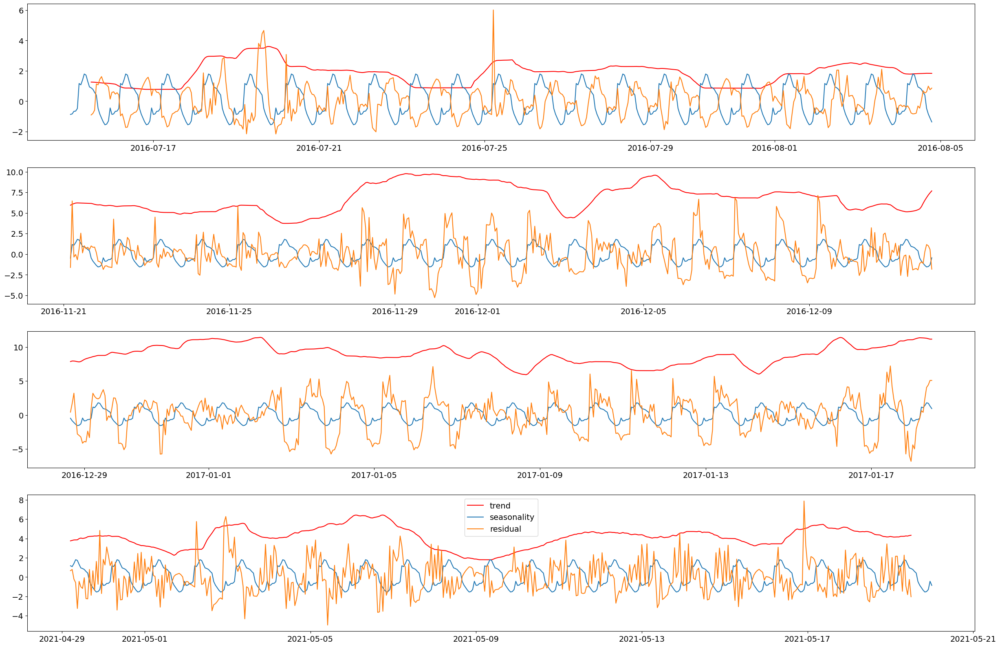

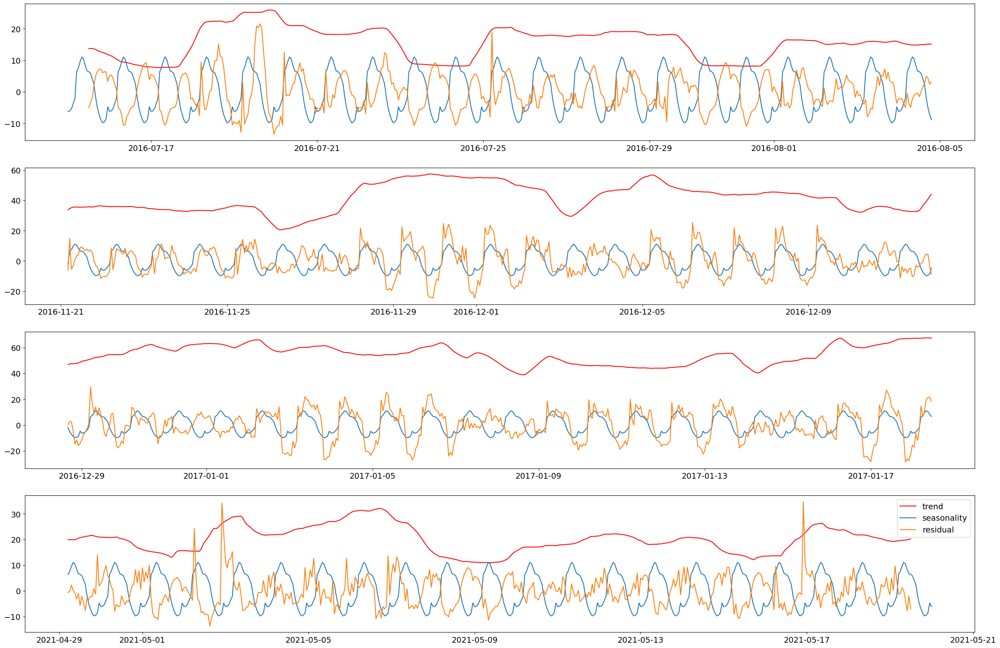

In [16]:
from statsmodels.tsa.seasonal import seasonal_decompose

def plot_saisonal_decomp(data):
    # Perform seasonal decomposition
    result = seasonal_decompose(data)

    # Extract the components
    trend = result.trend
    seasonal = result.seasonal
    residual = result.resid

    # Create a dataframe with the original data and the decomposition components
    df_seasonality=pd.DataFrame({'original': data, 'trend': trend, 'seasonality': seasonal, 'residual': residual})



    fig, axes = plt.subplots(nrows=4,ncols=1,figsize=(30,20))

    axes[0].plot(df_seasonality['trend'][:500],'r',label='trend')
    axes[0].plot(df_seasonality['seasonality'][:500],label='seasonality')
    axes[0].plot(df_seasonality['residual'][:500],label='residual')


    axes[1].plot(df_seasonality['trend'][3100:3600],'r',label='trend')
    axes[1].plot(df_seasonality['seasonality'][3100:3600],label='seasonality')
    axes[1].plot(df_seasonality['residual'][3100:3600],label='residual')

    axes[2].plot(df_seasonality['trend'][4000:4500],'r',label='trend')
    axes[2].plot(df_seasonality['seasonality'][4000:4500],label='seasonality')
    axes[2].plot(df_seasonality['residual'][4000:4500],label='residual')

    axes[3].plot(df_seasonality['trend'][-500:],'r',label='trend')
    axes[3].plot(df_seasonality['seasonality'][-500:],label='seasonality')
    axes[3].plot(df_seasonality['residual'][-500:],label='residual')

    plt.legend()
    plt.show()

plot_saisonal_decomp(df['T'])
plot_saisonal_decomp(df['TGBT'])

**autocorrelation**

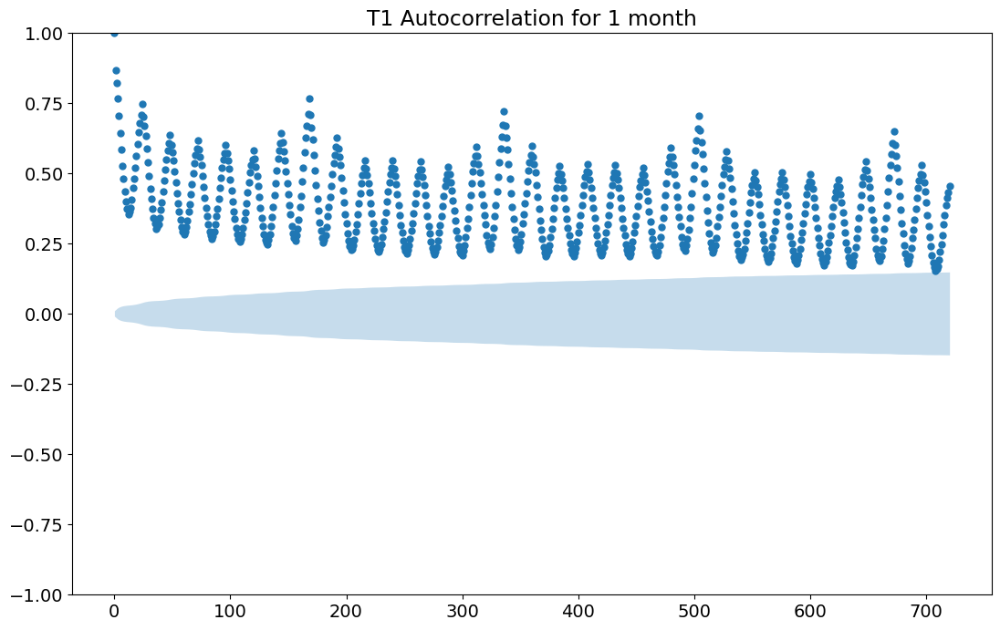

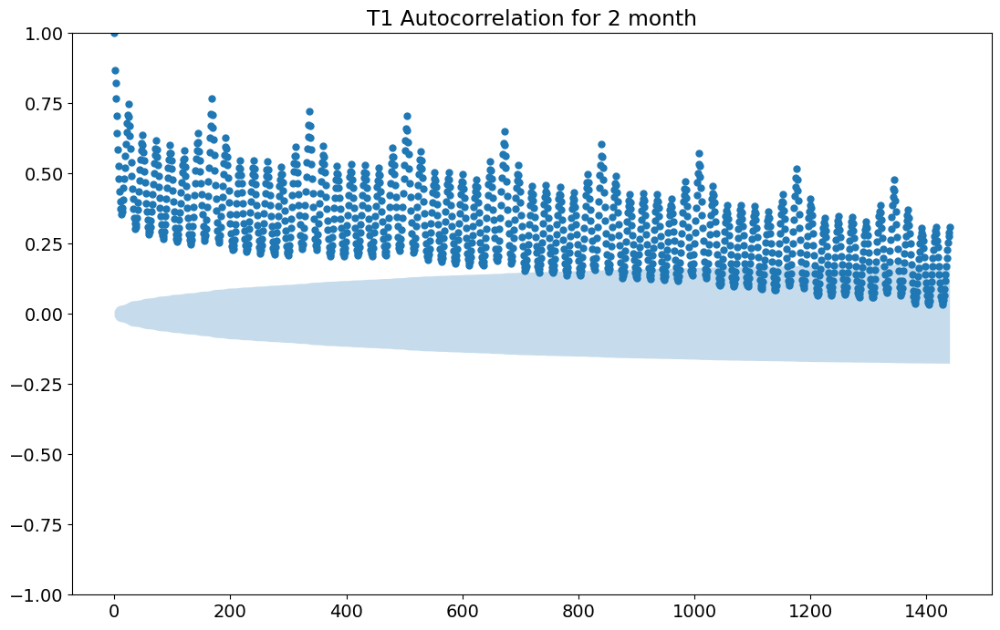

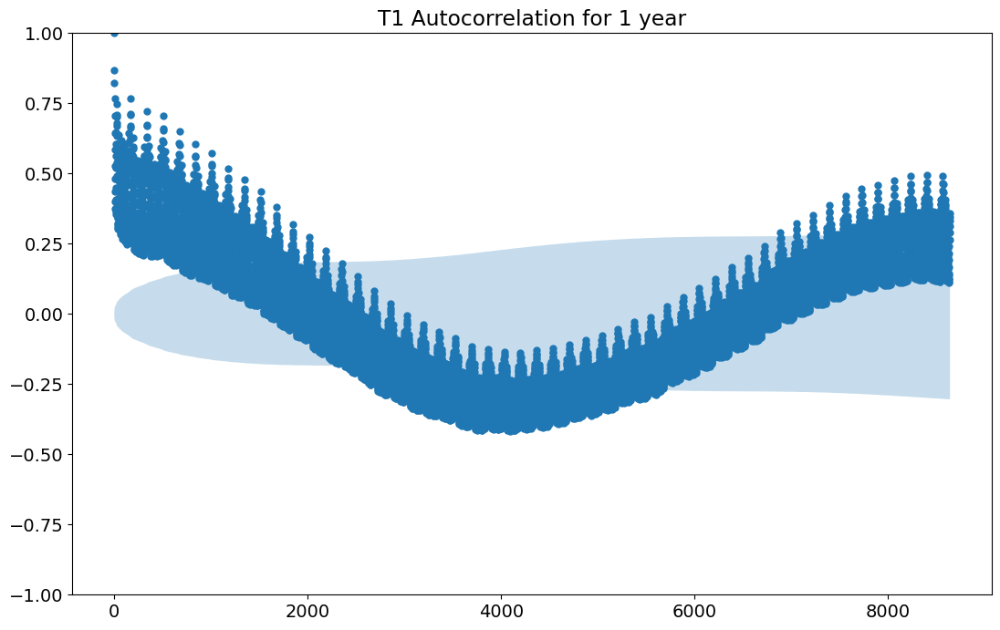

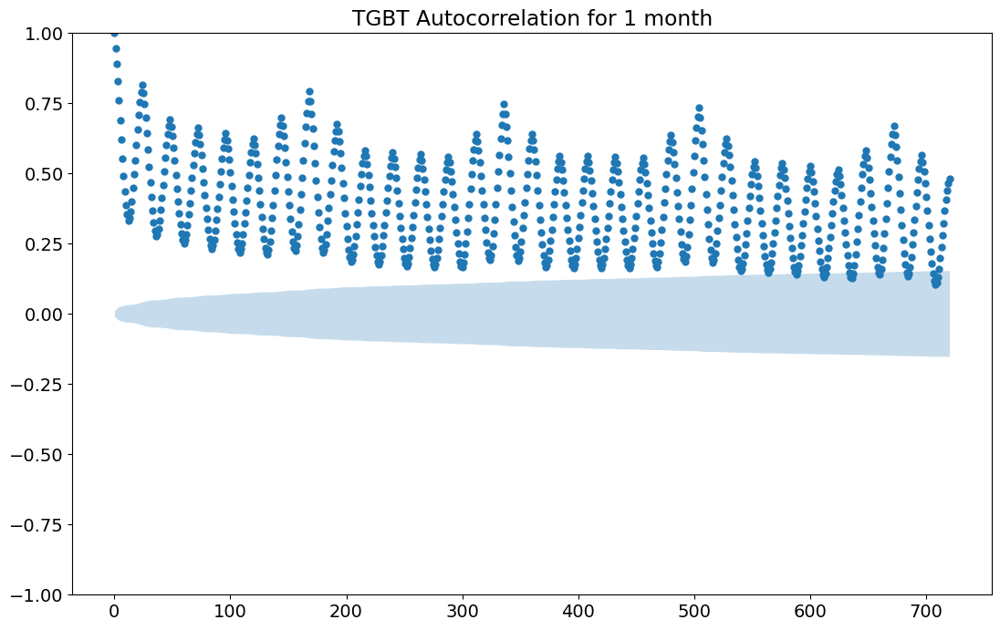

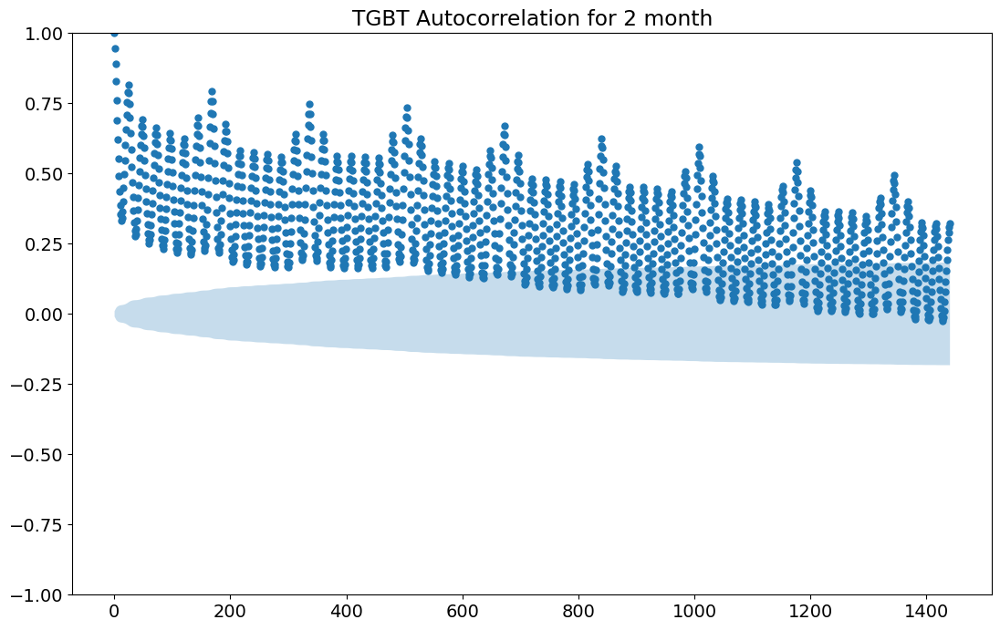

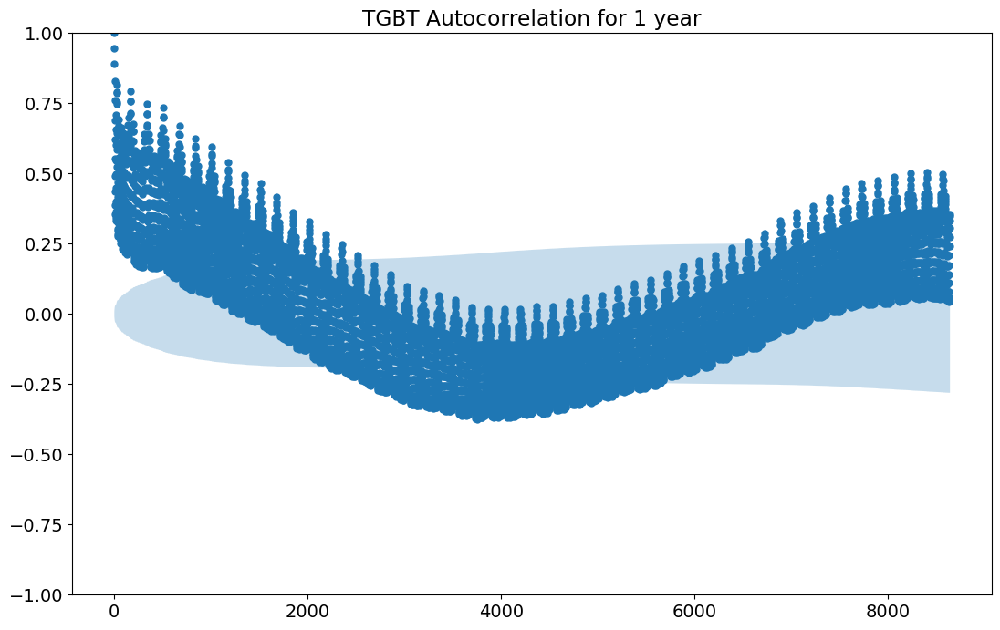

In [17]:
from matplotlib import rcParams
from statsmodels.graphics.tsaplots import plot_acf

rcParams["figure.figsize"] = 13, 8
# rcParams["figure.figsize"] = 10, 3

# ACF function up to 3024 lags
plot_acf(df["T"], lags=24*30,use_vlines =False,title='T1 Autocorrelation for 1 month')
plot_acf(df["T"], lags=24*30*2,use_vlines =False,title='T1 Autocorrelation for 2 month')
plot_acf(df["T"], lags=30*24*12,use_vlines =False,title='T1 Autocorrelation for 1 year')

plot_acf(df["TGBT"], lags=24*30,use_vlines =False,title='TGBT Autocorrelation for 1 month')
plot_acf(df["TGBT"], lags=24*30*2,use_vlines =False,title='TGBT Autocorrelation for 2 month')
plot_acf(df["TGBT"], lags=30*24*12,use_vlines =False,title='TGBT Autocorrelation for 1 year')

plt.show()

# Features extraction

we will use tsfresh **extract_features()**
https://tsfresh.readthedocs.io/en/latest/api/tsfresh.feature_extraction.html

then select the most relevant features
**select_features()**
https://tsfresh.readthedocs.io/en/latest/api/tsfresh.feature_selection.html

In [18]:
# from tsfresh import extract_features, select_features
# from tsfresh.utilities.dataframe_functions import impute

# # extract features using tsfresh
# extracted_features = extract_features(df.reset_index(), column_id="Datetime")

# # impute missing values (if any)
# impute(extracted_features)

# # select the most relevant features
# selected_features = select_features(extracted_features, y=df['T'], ml_task='regression',n_jobs =2)
# selected_features

In [19]:
# selected_features.corr()['T__sum_values']

don't get interesting rolling statistics
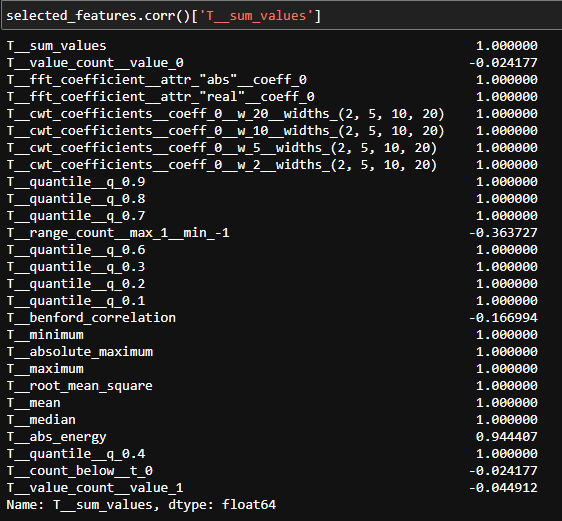

In [40]:
df.index.values.astype(float)

array([1.4685408e+18, 1.4685444e+18, 1.4685480e+18, ..., 1.6214616e+18,
       1.6214652e+18, 1.6214688e+18])

In [49]:
    
from sklearn.preprocessing import StandardScaler
from scipy.interpolate import BSpline


def create_features(df,Fourier_terms=True, B_spline_features=True):
    """
    Create time series features based on time series index, also can add :
    Fourier_terms
    B_spline_features
    """
    df = df.copy()

    # Extract time-based features
    df['year'] = df.index.year
    df['month'] = df.index.month
    df['day'] = df.index.day
    df['hour'] = df.index.hour
    df['dayofweek'] = df.index.dayofweek
    df['quarter'] = df.index.quarter
    df['dayofyear'] = df.index.dayofyear
    
    # Extract Fourier terms
    
    if Fourier_terms:
        """
        Fourier terms to capture seasonality patterns in the data.
        The Fourier terms are sinusoidal functions of the day/hour of year,
        with different frequencies (2, 4, 6, 8 cycles per year) and transformations
        """
        dayofyear = df.index.dayofyear
        hour = df.index.hour
        freq24 = 2 * np.pi / 24
        freq365 = 2 * np.pi / 365

        df['sin24_2'] = np.sin(freq24 * hour * 2)
        df['sin24_4'] = np.sin(freq24 * hour * 4)
        df['cos24_2'] = np.cos(freq24 * hour * 2)
        df['cos24_4'] = np.cos(freq24 * hour * 4)
        df['tanh24_2'] = np.tanh(freq24 * hour * 2)
        df['tanh24_4'] = np.tanh(freq24 * hour * 4)
        df['sin24_6'] = np.sin(freq24 * hour * 6)
        df['cos24_6'] = np.cos(freq24 * hour * 6)
        df['tanh24_6'] = np.tanh(freq24 * hour * 6)

        df['sin365_2'] = np.sin(freq365 * dayofyear * 2)
        df['cos365_2'] = np.cos(freq365 * dayofyear * 2)
        df['tanh365_2'] = np.tanh(freq365 * dayofyear * 2)
        df['sin365_4'] = np.sin(freq365 * dayofyear * 4)
        df['cos365_4'] = np.cos(freq365 * dayofyear * 4)
        df['tanh365_4'] = np.tanh(freq365 * dayofyear * 4)
        df['sin365_6'] = np.sin(freq365 * dayofyear * 6)
        df['cos365_6'] = np.cos(freq365 * dayofyear * 6)
        df['tanh365_6'] = np.tanh(freq365 * dayofyear * 6)

        # Fit scaler only once and transform Fourier terms
        fourier_cols = ['sin24_2', 'sin24_4', 'cos24_2', 'cos24_4',
                         'tanh24_2', 'tanh24_4',"sin24_6",
                        "cos24_6","tanh24_6","sin365_2","cos365_2",
                        "tanh365_2","sin365_4","cos365_4","tanh365_4",
                        "sin365_6","cos365_6","tanh365_6"]
    
        scaler = StandardScaler()
        df[fourier_cols] = scaler.fit_transform(df[fourier_cols])
        
#         for x in fourier_cols:
#             scaler = StandardScaler()
#             df[x] = scaler.fit_transform(df[x].values.reshape(-1,1))
        

    
    if B_spline_features:
        # Create B-spline features based on time series index
        """
        B-splines: B-splines are a family of piecewise polynomial functions that
        are commonly used in computer graphics, numerical analysis, and computational geometry
        to represent curves and surfaces. B-splines can be used to represent periodic signals by fitting a linear combination of
        basis functions to the signal. The basis functions are defined by a set of control points and a degree parameter,
        and they are non-zero only on a small interval of the signal. The B-spline representation can be more flexible
        than the Fourier or polynomial representations because it can capture both sharp transitions and smooth variations in 
        the signal.

        The function first creates a sequence of knot points t evenly spaced along the time series index.
        It then creates a B-spline object spl with n_knots basis functions of degree degree using the knot points as input.
        Finally, it evaluates the B-spline object at each time index x to obtain the B-spline basis functions
        and adds them as columns to the DataFrame with names 'b_spline_0', 'b_spline_1', etc.

        """
        x = df.index.values.astype(float)
        degree=5
        n_knots=8

        t = np.linspace(x.min(), x.max(), n_knots + degree - 1)
        spl = BSpline(t, np.eye(n_knots), k=degree)
        for i in range(n_knots-4):
            col_name = f'b_spline_{i}'
            df[col_name] = spl(x)[:, i]
    
    df.dropna(inplace=True)
    
    return df

     
    
df2 = create_features(df,Fourier_terms=True, B_spline_features=False)

df2.corr()

,AirTemp,TGBT,T,T2,T3,T4,T5,T6,T7,year,month,day,hour,dayofweek,quarter,dayofyear,sin24_2,sin24_4,cos24_2,cos24_4,tanh24_2,tanh24_4,sin24_6,cos24_6,tanh24_6,sin365_2,cos365_2,tanh365_2,sin365_4,cos365_4,tanh365_4,sin365_6,cos365_6,tanh365_6
AirTemp,1.000000,-0.524082,-0.589638,-0.542112,-0.457672,-0.342251,-0.520096,-0.195674,-0.441272,-9.114134e-02,1.704461e-01,5.129802e-02,1.485341e-01,-1.761054e-03,1.788251e-01,1.716908e-01,1.346212e-02,-2.536725e-04,4.402497e-02,-4.160990e-03,8.543853e-02,5.687765e-02,-1.505057e-04,-5.376687e-04,4.837590e-02,9.879086e-02,-2.273654e-02,3.502877e-01,-3.871671e-04,8.611292e-03,2.487245e-01,-2.442380e-02,-6.821890e-03,2.031347e-01
TGBT,-0.524082,1.000000,0.871551,0.810585,0.596056,0.590278,0.645329,0.500772,0.891565,6.209242e-02,-1.551435e-01,-2.068539e-02,-1.429488e-01,-2.196367e-01,-1.595656e-01,-1.551299e-01,-2.765810e-02,4.950430e-03,7.110038e-04,1.656605e-02,1.176370e-01,9.205594e-02,2.252895e-03,-4.936899e-03,8.140112e-02,-2.154043e-02,1.694693e-01,-2.860035e-01,-1.272434e-04,1.065025e-02,-2.010907e-01,2.312003e-02,-1.192650e-02,-1.619840e-01
T,-0.589638,0.871551,1.000000,0.789007,0.590007,0.557212,0.600507,0.218138,0.826240,2.198658e-02,-1.324432e-01,-2.116340e-02,-1.218136e-01,-2.116030e-01,-1.302625e-01,-1.320430e-01,-3.177607e-02,4.063034e-03,8.190950e-03,1.486008e-02,8.817097e-02,6.930263e-02,3.504846e-03,-1.101828e-02,6.147973e-02,-2.632942e-02,1.034015e-01,-2.974036e-01,3.015738e-02,1.311585e-03,-2.108377e-01,1.058757e-02,-7.851500e-03,-1.719722e-01
T2,-0.542112,0.810585,0.789007,1.000000,0.536923,0.744344,0.573210,0.141120,0.714949,-2.869784e-01,-1.399552e-01,-2.407270e-02,-1.206797e-01,-1.544746e-01,-1.450876e-01,-1.401304e-01,-2.164680e-02,6.588280e-03,1.744425e-02,-6.101137e-03,8.677317e-02,6.821985e-02,3.013932e-03,5.730823e-03,6.046987e-02,9.262857e-03,9.520994e-02,-2.659603e-01,-9.825507e-03,1.295182e-02,-1.840970e-01,3.572516e-04,-3.404764e-03,-1.488976e-01
T3,-0.457672,0.596056,0.590007,0.536923,1.000000,0.507518,0.524661,0.201268,0.455679,1.113601e-01,-2.396631e-01,-2.603695e-02,2.292887e-02,-1.967368e-01,-2.410322e-01,-2.397307e-01,9.306700e-03,-7.070348e-03,7.967465e-02,-4.981821e-02,1.219807e-01,9.263563e-02,-9.388665e-03,3.108633e-02,8.151751e-02,-3.405079e-02,5.983281e-02,-2.689469e-01,1.613180e-02,-7.306298e-03,-1.745314e-01,7.560619e-03,-3.520758e-03,-1.335986e-01
T4,-0.342251,0.590278,0.557212,0.744344,0.507518,1.000000,0.469886,0.131171,0.422692,-4.554299e-01,-3.272050e-02,-2.636334e-02,-5.356276e-02,-1.585427e-01,-3.910446e-02,-3.382275e-02,-3.799836e-02,3.727133e-02,6.223530e-02,-2.694059e-02,1.330799e-01,1.006610e-01,3.972262e-03,7.431808e-03,8.892673e-02,-1.773001e-02,2.382998e-02,-1.616202e-01,-4.341029e-02,1.657550e-02,-1.043728e-01,2.812997e-02,-3.389763e-02,-7.563598e-02
T5,-0.520096,0.645329,0.600507,0.573210,0.524661,0.469886,1.000000,0.140953,0.496020,4.276925e-02,-5.312612e-02,-1.241520e-02,-7.965931e-02,-8.205610e-02,-4.812024e-02,-5.164066e-02,-7.595249e-02,3.384922e-02,2.274916e-02,2.285192e-02,1.274146e-01,9.712028e-02,2.148891e-02,-1.782936e-02,8.586712e-02,-3.142564e-02,1.624919e-01,-3.311322e-01,2.121429e-02,2.422237e-02,-2.211123e-01,4.461335e-02,-3.917920e-02,-1.596391e-01
T6,-0.195674,0.500772,0.218138,0.141120,0.201268,0.131171,0.140953,1.000000,0.204491,2.678648e-01,-1.111590e-01,-2.290616e-02,-7.007814e-02,-6.414722e-02,-1.152482e-01,-1.131028e-01,-2.299960e-02,6.233140e-03,-1.041545e-02,1.078620e-02,3.831409e-02,3.132555e-02,1.124080e-02,-3.208259e-03,2.813152e-02,-1.261795e-01,2.432848e-02,-4.736857e-02,1.101233e-02,1.917525e-02,-3.106309e-02,7.237083e-03,-5.932771e-03,-2.306976e-02
T7,-0.441272,0.891565,0.826240,0.714949,0.455679,0.422692,0.496020,0.204491,1.000000,4.770519e-02,-1.453620e-01,-4.863481e-03,-1.586071e-01,-2.242564e-01,-1.509356e-01,-1.441002e-01,1.608836e-04,-1.332625e-02,-3.374221e-02,3.321259e-02,8.846838e-02,7.041289e-02,-9.144864e-03,-7.235316e-03,6.202157e-02,5.477557e-02,2.174954e-01,-2.711587e-01,-3.878364e-03,-4

<Axes: >

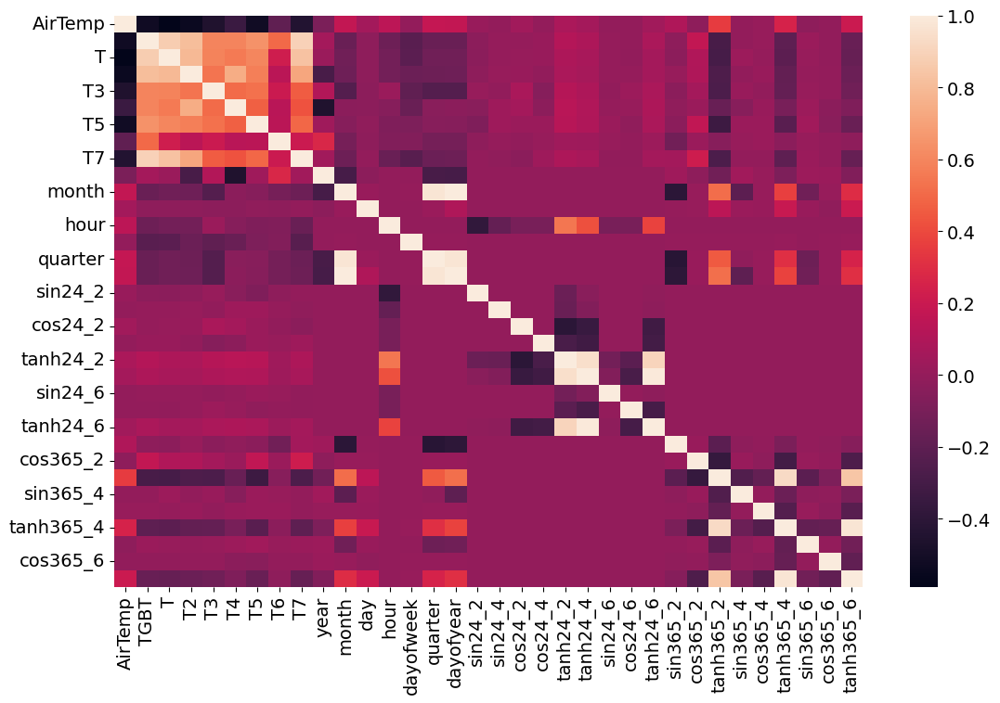

In [21]:
sns.heatmap(df2.corr())

# METRICS

In [50]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error

def RMSE(y_val,y_pred):
    return np.sqrt(mean_squared_error(y_val, y_pred))

def MAPE(y_true, y_pred):
    return mean_absolute_percentage_error(y_true, y_pred)

def SMAPE(y_true, y_pred):
    n = len(y_true)
    sum_error = 0.0
    for t in range(n):
        sum_error += abs(y_pred[t] - y_true[t]) / (abs(y_true[t]) + abs(y_pred[t]))
    return (100.0/n) * sum_error

def DTW(y_true, y_pred):
    """
     https://dtaidistance.readthedocs.io/en/latest/usage/dtw.html

    If you are interested in comparing only the shape,
    and not the absolute differences and offset, you need to transform the data first.
    Z-normalization
    T = (T-np.mean(T))/np.std(T)
    
    Differencing
    Z-normalization has the disadvantage that constant baselines are not necessarily at the same level.
    The causes a small error but it accumulates over a long distance.
    To avoid this, use differencing (see the clustering K-means documentation for a visual example).
    
    series = dtaidistance.preprocessing.differencing(series, smooth=0.1)
    """
    # Just-in-time Z-normalization
    y_true = (y_true - np.mean(y_true)) / np.std(y_true)
    y_pred = (y_pred - np.mean(y_pred)) / np.std(y_pred)
    
    return dtw.distance_fast(y_true, y_pred,use_pruning=True)

def Temporal_loss(y_true, y_pred, sigma=1):
    """
    Computes the temporal loss between two time series using a modified Time Distortion Index.
    
    Args:
        y_true (ndarray): Ground truth time series.
        y_pred (ndarray): Predicted time series.
        sigma (float): Width of the Gaussian kernel used for temporal weighting.
        
    Returns:
        float: Temporal loss value.
    """
    
    # Compute the time distortion index between y_true and y_pred
    tdi = np.sum(np.abs(y_true - y_pred)) / np.sum(np.abs(y_true))
    
    # Compute the temporal weighting function
    t = np.arange(len(y_true))
    weights = np.exp(-(t - t[:, np.newaxis]) ** 2 / (2 * sigma ** 2))
    
    # Compute the weighted TDI
    weighted_tdi = np.sum(weights * np.abs(y_true - y_pred)) / np.sum(weights * np.abs(y_true))
    
    return weighted_tdi


def PRINT_SCORE(y_val, y_pred):
    
    if isinstance(y_val, np.ndarray):y_val=y_val.ravel()
    if isinstance(y_val, pd.DataFrame):y_val=y_val.values.ravel()
    if isinstance(y_val, pd.Series):y_val=y_val.values.ravel()
   
    if isinstance(y_pred, np.ndarray):y_pred=y_pred.ravel()
    if isinstance(y_pred, pd.DataFrame):y_pred=y_pred.values.ravel()
    if isinstance(y_pred, pd.Series):y_pred=y_pred.values.ravel()
        
    print("RMSE : ",RMSE(y_pred,y_val))
    print("MAPE : ",MAPE(y_pred,y_val))
    print("SMAPE : ",SMAPE(y_pred,y_val))
    print("DTW : ",DTW(np.double(y_pred),np.double(y_val)))
    


RESULT=pd.DataFrame(columns=["model_name","RMSE","MAPE","SMAPE","DTW","RdR_score"])
RESULT_2=pd.DataFrame(columns=["model_name","RMSE","MAPE","SMAPE","DTW"])


# Multivariate and Multi-step Forecasting  

After extracting all the Fourier terms, we create a list of the Fourier column names (fourier_cols) and fit the scaler on them only once. Then we transform all the Fourier columns in one step. This ensures that the scaling is consistent across all the Fourier terms.

In [23]:
import datetime

vacances_scolaires = [
    # Vacances de Noël 2016
    (datetime.date(2016, 12, 22), datetime.date(2017, 1, 2)),
    # Vacances d'hiver 2017
    (datetime.date(2017, 2, 16), datetime.date(2017, 2, 26)),
    # Vacances de printemps 2017
    (datetime.date(2017, 4, 13), datetime.date(2017, 4, 23)),
    # Vacances d'été 2017
    (datetime.date(2017, 7, 6), datetime.date(2017, 9, 1)),
    # Vacances de Noël 2017
    (datetime.date(2017, 12, 21), datetime.date(2018, 1, 1)),
    # Vacances d'hiver 2018
    (datetime.date(2018, 2, 15), datetime.date(2018, 2, 25)),
    # Vacances de printemps 2018
    (datetime.date(2018, 4, 5), datetime.date(2018, 4, 15)),
    # Vacances d'été 2018
    (datetime.date(2018, 7, 6), datetime.date(2018, 8, 31)),
    # Vacances de Noël 2018
    (datetime.date(2018, 12, 20), datetime.date(2019, 1, 6)),
    # Vacances d'hiver 2019
    (datetime.date(2019, 2, 14), datetime.date(2019, 2, 24)),
    # Vacances de printemps 2019
    (datetime.date(2019, 4, 4), datetime.date(2019, 4, 14)),
    # Vacances d'été 2019
    (datetime.date(2019, 7, 5), datetime.date(2019, 8, 31)),
    # Vacances de Noël 2019
    (datetime.date(2019, 12, 20), datetime.date(2020, 1, 5)),
    # Vacances d'hiver 2020
    (datetime.date(2020, 2, 13), datetime.date(2020, 2, 23)),
    # Vacances de printemps 2020
    (datetime.date(2020, 4, 3), datetime.date(2020, 4, 12)),
    # Vacances d'été 2020
    (datetime.date(2020, 7, 3), datetime.date(2020, 8, 29)),
    # Vacances de Noël 2020
    (datetime.date(2020, 12, 18), datetime.date(2021, 1, 3)),
    # Vacances d'hiver 2021
    (datetime.date(2021, 2, 11), datetime.date(2021, 2, 21)),
    # Vacances de printemps 2021
    (datetime.date(2021, 4, 2), datetime.date(2021, 4, 11)),
    # Vacances d'été 2021
    (datetime.date(2021, 7, 2), datetime.date(2021, 8, 28))
]

def is_date_in_vacances_scolaires(date, vacances_scolaires):
    date = date.date()
    for start_date, end_date in vacances_scolaires:
        if start_date <= date <= end_date:
            return 1
    return 0
# Apply the is_date_in_vacances_scolaires function to each index value
df2['in_vacances_scolaires'] = df2.index.map(lambda x: is_date_in_vacances_scolaires(x, vacances_scolaires))

ferie = {
     2016: [datetime.date(2016, 1, 1), # Jour de l'an
         datetime.date(2016, 4, 25), # Lundi de Pâques
         datetime.date(2016, 5, 1), # Fête du travail
         datetime.date(2016, 5, 5), # Victoire des alliés
         datetime.date(2016, 5, 8), # Armistice de 1945
         datetime.date(2016, 5, 16), # Ascension
         datetime.date(2016, 5, 30), # Lundi de Pentecôte
         datetime.date(2016, 7, 14), # Fête nationale
         datetime.date(2016, 8, 15), # Assomption
         datetime.date(2016, 11, 1), # Toussaint
         datetime.date(2016, 11, 11), # Armistice de 1918
         datetime.date(2016, 12, 25) # Noël
         ],
    2017: [datetime.date(2017, 1, 1),  # Jour de l'an
           datetime.date(2017, 4, 17),  # Lundi de Pâques
           datetime.date(2017, 5, 1),  # Fête du travail
           datetime.date(2017, 5, 8),  # Victoire des alliés
           datetime.date(2017, 5, 25),  # Ascension
           datetime.date(2017, 6, 5),  # Lundi de Pentecôte
           datetime.date(2017, 7, 14),  # Fête nationale
           datetime.date(2017, 8, 15),  # Assomption
           datetime.date(2017, 11, 1),  # Toussaint
           datetime.date(2017, 11, 11),  # Armistice de 1918
           datetime.date(2017, 12, 25)  # Noël
           ],
    2018: [datetime.date(2018, 1, 1),  # Jour de l'an
           datetime.date(2018, 4, 2),  # Lundi de Pâques
           datetime.date(2018, 5, 1),  # Fête du travail
           datetime.date(2018, 5, 8),  # Victoire des alliés
           datetime.date(2018, 5, 10),  # Ascension
           datetime.date(2018, 5, 21),  # Lundi de Pentecôte
           datetime.date(2018, 7, 14),  # Fête nationale
           datetime.date(2018, 8, 15),  # Assomption
           datetime.date(2018, 11, 1),  # Toussaint
           datetime.date(2018, 11, 11),  # Armistice de 1918
           datetime.date(2018, 12, 25)  # Noël
           ],
    2019: [datetime.date(2019, 1, 1),  # Jour de l'an
           datetime.date(2019, 4, 22),  # Lundi de Pâques
           datetime.date(2019, 5, 1),  # Fête du travail
           datetime.date(2019, 5, 8),  # Victoire des alliés
           datetime.date(2019, 5, 30),  # Ascension
           datetime.date(2019, 6, 10),  # Lundi de Pentecôte
           datetime.date(2019, 7, 14),  # Fête nationale
           datetime.date(2019, 8, 15),  # Assomption
           datetime.date(2019, 11, 1),  # Toussaint
           datetime.date(2019, 11, 11),  # Armistice de 1918
           datetime.date(2019, 12, 25)  # Noël
           ],
     2020: [datetime.date(2020, 1, 1),  # Jour de l'an
           datetime.date(2020, 4, 13),  # Lundi de Pâques
           datetime.date(2020, 5, 1),  # Fête du travail
           datetime.date(2020, 5, 8),  # Victoire des alliés
           datetime.date(2020, 5, 21),  # Ascension
           datetime.date(2020, 6, 1),  # Lundi de Pentecôte
           datetime.date(2020, 7, 14),  # Fête nationale
           datetime.date(2020, 8, 15),  # Assomption
           datetime.date(2020, 11, 1),  # Toussaint
           datetime.date(2020, 11, 11),  # Armistice de 1918
           datetime.date(2020, 12, 25)  # Noël
           ],
    2021: [datetime.date(2021, 1, 1),  # Jour de l'an
           datetime.date(2021, 4, 5),  # Lundi de Pâques
           datetime.date(2021, 5, 1),  # Fête du travail
           datetime.date(2021, 5, 8),  # Victoire des alliés
           datetime.date(2021, 5, 13),  # Ascension
           datetime.date(2021, 5, 24),  # Lundi de Pentecôte
           datetime.date(2021, 7, 14),  # Fête nationale
           datetime.date(2021, 8, 15),  # Assomption
           datetime.date(2021, 11, 1),  # Toussaint
           datetime.date(2021, 11, 11),  # Armistice de 1918
           datetime.date(2021, 12, 25)  # Noël
           ]
}


def is_date_a_holiday(date, ferie):
    date = date.date()
    for year, holidays in ferie.items():
        if date.year == year:
            for holiday in holidays:
                if date == holiday:
                    return 1
    return 0
# Apply the is_date_a_holiday function to each index value
df2['is_ferie'] = df2.index.map(lambda x: is_date_a_holiday(x, ferie))


covid_confinement = [
#     du 17 mars au 11 mai 2020 non inclus
    (datetime.date(2020, 3, 17), datetime.date(2020, 5, 10)),
#     du 30 octobre au 15 décembre 2020 non inclus
    (datetime.date(2020, 10, 30), datetime.date(2020, 12, 14)),
#     du 3 avril au 3 mai 2021 non inclus
    (datetime.date(2021, 4, 3), datetime.date(2021, 5, 2)),
]

df2['in_covid_confinement'] = df2.index.map(lambda x: is_date_in_vacances_scolaires(x, covid_confinement))
df2

,AirTemp,TGBT,T,T2,T3,T4,T5,T6,T7,year,month,day,hour,dayofweek,quarter,dayofyear,sin24_2,sin24_4,cos24_2,cos24_4,tanh24_2,tanh24_4,sin24_6,cos24_6,tanh24_6,sin365_2,cos365_2,tanh365_2,sin365_4,cos365_4,tanh365_4,sin365_6,cos365_6,tanh365_6,in_vacances_scolaires,is_ferie,in_covid_confinement
Datetime,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-07-15 00:00:00+00:00,12.41,9.37,0.99,2.12,0.19,1.50,1.41,0.26,2.64,2016,7,15,0,4,3,197,-5.230623e-17,-1.242975e-16,1.414164,1.414164,-4.157095,-4.680574,-1.506798e-16,1.414164,-4.778061,0.656323,1.279119,0.336161,1.170135,0.776562,0.230709,1.406500,0.102067,0.186311,0,0,0
2016-07-15 01:00:00+00:00,12.12,9.78,0.99,2.17,0.17,1.69,1.57,0.54,2.36,2016,7,15,1,4,3,197,7.071151e-01,1.224759e+00,1.224697,0.707065,-1.991102,-0.824933,1.414230e+00,-0.000033,-0.187901,0.656323,1.279119,0.336161,1.170135,0.776562,0.230709,1.406500,0.102067,0.186311,0,0,0
2016-07-15 02:00:00+00:00,11.54,10.95,1.13,2.31,0.34,1.66,1.68,0.33,3.18,2016,7,15,2,4,3,197,1.224759e+00,1.224759e+00,0.707065,-0.707132,-0.637600,0.110485,2.251346e-17,-1.414230,0.208077,0.656323,1.279119,0.336161,1.170135,0.776562,0.230709,1.406500,0.102067,0.186311,0,0,0
2016-07-15 03:00:00+00:00,11.28,13.73,1.31,2.40,0.89,1.64,1.78,0.54,4.81,2016,7,15,3,4,3,197,1.414230e+00,4.889573e-17,-0.000033,-1.414230,-0.022531,0.239621,-1.414230e+00,-0.000033,0.225927,0.656323,1.279119,0.336161,1.170135,0.776562,0.230709,1.406500,0.102067,0.186311,0,0,0
2016-07-15 04:00:00+00:00,10.77,14.24,1.17,2.29,0.27,2.10,2.10,0.76,5.25,2016,7,15,4,4,3,197,1.224759e+00,-1.224759e+00,-0.707132,-0.707132,0.216266,0.255761,-4.970663e-16,1.414164,0.226700,0.656323,1.279119,0.336161,1.170135,0.776562,0.230709,1.406500,0.102067,0.186311,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-05-19 20:00:00+00:00,10.93,15.04,5.31,1.65,2.37,0.51,1.54,0.94,2.22,2021,5,19,20,2,2,139,-1.224759e+00,1.224759e+00,-0.707132,-0.707132,0.350949,0.258032,-6.906967e-15,1.414164,0.226735,-1.424109,0.136199,0.335331,-0.224225,-1.389985,0.230709,1.376372,-0.309419,0.186311,0,0,0
2021-05-19 21:00:00+00:00,10.10,11.11,2.06,1.02,2.29,0.50,1.50,0.94,2.34,2021,5,19,21,2,2,139,-1.414230e+00,1.088055e-15,-0.000033,-1.414230,0.350949,0.258032,1.414230e+00,-0.000033,0.226735,-1.424109,0.136199,0.335331,-0.224225,-1.389985,0.230709,1.376372,-0.309419,0.186311,0,0,0
2021-05-19 22:00:00+00:00,9.48,22.12,7.20,2.26,2.31,0.52,1.50,1.02,6.72,2021,5,19,22,2,2,139,-1.224759e+00,-1.224759e+00,0.707065,-0.707132,0.350949,0.258032,6.778801e-15,-1.414230,0.226735,-1.424109,0.136199,0.335331,-0.224225,-1.389985,0.230709,1.376372,-0.309419,0.186311,0,0,0


# Statistics enhancements, rolling statistics
## skewness and kurtosis
**preprocessing should be done on trained data (80%) and be extrapolated on validation (20%)**


In [29]:
# dir(df.rolling(window=12))
df2

,AirTemp,TGBT,T,T2,T3,T4,T5,T6,T7,year,month,day,hour,dayofweek,quarter,dayofyear,sin24_2,sin24_4,cos24_2,cos24_4,tanh24_2,tanh24_4,sin24_6,cos24_6,tanh24_6,sin365_2,cos365_2,tanh365_2,sin365_4,cos365_4,tanh365_4,sin365_6,cos365_6,tanh365_6,in_vacances_scolaires,is_ferie,in_covid_confinement
Datetime,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-07-15 00:00:00+00:00,12.41,9.37,0.99,2.12,0.19,1.50,1.41,0.26,2.64,2016,7,15,0,4,3,197,-5.230623e-17,-1.242975e-16,1.414164,1.414164,-4.157095,-4.680574,-1.506798e-16,1.414164,-4.778061,0.656323,1.279119,0.336161,1.170135,0.776562,0.230709,1.406500,0.102067,0.186311,0,0,0
2016-07-15 01:00:00+00:00,12.12,9.78,0.99,2.17,0.17,1.69,1.57,0.54,2.36,2016,7,15,1,4,3,197,7.071151e-01,1.224759e+00,1.224697,0.707065,-1.991102,-0.824933,1.414230e+00,-0.000033,-0.187901,0.656323,1.279119,0.336161,1.170135,0.776562,0.230709,1.406500,0.102067,0.186311,0,0,0
2016-07-15 02:00:00+00:00,11.54,10.95,1.13,2.31,0.34,1.66,1.68,0.33,3.18,2016,7,15,2,4,3,197,1.224759e+00,1.224759e+00,0.707065,-0.707132,-0.637600,0.110485,2.251346e-17,-1.414230,0.208077,0.656323,1.279119,0.336161,1.170135,0.776562,0.230709,1.406500,0.102067,0.186311,0,0,0
2016-07-15 03:00:00+00:00,11.28,13.73,1.31,2.40,0.89,1.64,1.78,0.54,4.81,2016,7,15,3,4,3,197,1.414230e+00,4.889573e-17,-0.000033,-1.414230,-0.022531,0.239621,-1.414230e+00,-0.000033,0.225927,0.656323,1.279119,0.336161,1.170135,0.776562,0.230709,1.406500,0.102067,0.186311,0,0,0
2016-07-15 04:00:00+00:00,10.77,14.24,1.17,2.29,0.27,2.10,2.10,0.76,5.25,2016,7,15,4,4,3,197,1.224759e+00,-1.224759e+00,-0.707132,-0.707132,0.216266,0.255761,-4.970663e-16,1.414164,0.226700,0.656323,1.279119,0.336161,1.170135,0.776562,0.230709,1.406500,0.102067,0.186311,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-05-19 20:00:00+00:00,10.93,15.04,5.31,1.65,2.37,0.51,1.54,0.94,2.22,2021,5,19,20,2,2,139,-1.224759e+00,1.224759e+00,-0.707132,-0.707132,0.350949,0.258032,-6.906967e-15,1.414164,0.226735,-1.424109,0.136199,0.335331,-0.224225,-1.389985,0.230709,1.376372,-0.309419,0.186311,0,0,0
2021-05-19 21:00:00+00:00,10.10,11.11,2.06,1.02,2.29,0.50,1.50,0.94,2.34,2021,5,19,21,2,2,139,-1.414230e+00,1.088055e-15,-0.000033,-1.414230,0.350949,0.258032,1.414230e+00,-0.000033,0.226735,-1.424109,0.136199,0.335331,-0.224225,-1.389985,0.230709,1.376372,-0.309419,0.186311,0,0,0
2021-05-19 22:00:00+00:00,9.48,22.12,7.20,2.26,2.31,0.52,1.50,1.02,6.72,2021,5,19,22,2,2,139,-1.224759e+00,-1.224759e+00,0.707065,-0.707132,0.350949,0.258032,6.778801e-15,-1.414230,0.226735,-1.424109,0.136199,0.335331,-0.224225,-1.389985,0.230709,1.376372,-0.309419,0.186311,0,0,0


In [56]:

def Rolling_statistics(data, window, target):
    # Parameter validation
    if not isinstance(data, pd.DataFrame):
        raise ValueError("data parameter must be a pandas DataFrame")
    if not isinstance(window, int) or window <= 0:
        raise ValueError("window parameter must be a positive integer")
    if target not in data.columns:
        raise ValueError("target parameter must be a valid column in the data DataFrame")

    # Error handling
    if len(data) < window:
        raise ValueError("window size cannot be larger than the length of the DataFrame")

    # Compute rolling statistics
    data['rolling_24_mean'] = data[target].rolling(window=24).mean()
    data['rolling_24_std'] = data[target].rolling(window=24).std()
    if window >= 7*24:
        data['rolling_7day_mean'] = data[target].rolling(window=7*24).mean()
        data['rolling_7day_std'] = data[target].rolling(window=7*24).std()
    if window >= 7*24*4:
        data['rolling_4week_mean'] = data[target].rolling(window=24*7*4).mean()
        data['rolling_4week_std'] = data[target].rolling(window=24*7*4).std()

    # # Compute rolling skewness and kurtosis over a window of size 24*7*4
    # rolling_skewness = []
    # rolling_kurtosis = []

    # for i in range(window, len(data)+1):
    #     vals = data.iloc[i-window:i, :][target].values[[0, 24, 48, 72]]
    #     rolling_skewness.append(pd.Series(vals).skew())
    #     rolling_kurtosis.append(pd.Series(vals).kurt())
    # data['rolling_4week_skew'] = pd.Series(rolling_skewness, index=data.index[window-1:])
    # data['rolling_4week_kurt'] = pd.Series(rolling_kurtosis, index=data.index[window-1:])
    data.dropna(inplace=True)

    return data


In [57]:
# df2_T = Rolling_statistics(data=df2, window=24*4*7, target='T',statistics = ['mean', 'std', 'median', 'skew', 'kurt'])
del(df2_T)
df2_T = Rolling_statistics(data=df2, window=24*4*7, target='T')

df2_T.corr()

,AirTemp,TGBT,T,T2,T3,T4,T5,T6,T7,year,month,day,hour,dayofweek,quarter,dayofyear,sin24_2,sin24_4,cos24_2,cos24_4,tanh24_2,tanh24_4,sin24_6,cos24_6,tanh24_6,sin365_2,cos365_2,tanh365_2,sin365_4,cos365_4,tanh365_4,sin365_6,cos365_6,tanh365_6,rolling_24_mean,rolling_24_std,rolling_7day_mean,rolling_7day_std,rolling_4week_mean,rolling_4week_std
AirTemp,1.000000,-0.518439,-0.587740,-0.537245,-0.453905,-0.343676,-0.513188,-0.187633,-0.439452,-0.064242,0.168868,4.895650e-02,1.477472e-01,-1.754580e-03,0.173808,0.169826,1.371695e-02,-3.030375e-04,4.453895e-02,-4.302855e-03,8.493026e-02,5.654297e-02,-1.428374e-04,-5.408676e-04,4.809300e-02,0.082547,-0.038776,3.490312e-01,-0.021237,1.324232e-02,2.478531e-01,-0.033072,0.008956,2.024299e-01,-7.511712e-01,-0.533362,-0.752388,-0.656800,-0.725181,-0.662233
TGBT,-0.518439,1.000000,0.870336,0.807040,0.588272,0.589867,0.637835,0.495502,0.891862,0.031600,-0.152551,-2.028646e-02,-1.455588e-01,-2.208891e-01,-0.153783,-0.152437,-2.883534e-02,5.263040e-03,1.117021e-03,1.648086e-02,1.179891e-01,9.236933e-02,1.843583e-03,-4.923334e-03,8.168346e-02,-0.000852,0.187960,-2.836487e-01,0.020870,2.370879e-03,-1.994467e-01,0.027114,-0.030328,-1.606269e-01,6.471946e-01,0.513243,0.556816,0.483313,0.514526,0.452369
T,-0.587740,0.870336,1.000000,0.786319,0.585066,0.556314,0.595144,0.210816,0.824707,-0.000234,-0.130196,-2.033026e-02,-1.235402e-01,-2.118156e-01,-0.125662,-0.129675,-3.295266e-02,4.491919e-03,8.614648e-03,1.460425e-02,8.794100e-02,6.916505e-02,3.039838e-03,-1.098304e-02,6.136607e-02,-0.012094,0.115508,-2.952188e-01,0.045480,-4.243868e-03,-2.092893e-01,0.013680,-0.020523,-1.707086e-01,7.404981e-01,0.586515,0.657435,0.588557,0.606620,0.567142
T2,-0.537245,0.807040,0.786319,1.000000,0.529966,0.745647,0.565654,0.131718,0.712124,-0.323373,-0.137445,-2.387025e-02,-1.215396e-01,-1.546330e-01,-0.139936,-0.137544,-2.279305e-02,7.092959e-03,1.814905e-02,-6.757767e-03,8.684757e-02,6.826470e-02,2.589529e-03,5.866474e-03,6.050483e-02,0.026741,0.109294,-2.633547e-01,0.007301,6.513450e-03,-1.822368e-01,0.003667,-0.018136,-1.473757e-01,6.405153e-01,0.588345,0.599802,0.622323,0.568537,0.595057
T3,-0.453905,0.588272,0.585066,0.529966,1.000000,0.504980,0.516442,0.192573,0.449750,0.089125,-0.238729,-2.523924e-02,2.290070e-02,-1.961342e-01,-0.237555,-0.238657,9.367997e-03,-7.442898e-03,7.975269e-02,-4.973406e-02,1.215480e-01,9.228040e-02,-8.961071e-03,3.127475e-02,8.120169e-02,-0.017931,0.073032,-2.670452e-01,0.033300,-1.404770e-02,-1.730242e-01,0.010716,-0.018067,-1.322783e-01,6.050902e-01,0.519110,0.596397,0.548730,0.593302,0.553945
T4,-0.343676,0.589867,0.556314,0.745647,0.504980,1.000000,0.467614,0.127401,0.419878,-0.477707,-0.031234,-2.854855e-02,-5.284683e-02,-1.575994e-01,-0.037021,-0.032478,-3.724002e-02,3.672178e-02,6.212259e-02,-2.750686e-02,1.325700e-01,1.002590e-01,3.930507e-03,7.411897e-03,8.856668e-02,-0.011581,0.027795,-1.606834e-01,-0.038803,1.311368e-02,-1.036441e-01,0.027494,-0.039491,-7.499299e-02,4.511731e-01,0.452947,0.427516,0.454982,0.387441,0.414022
T5,-0.513188,0.637835,0.595144,0.565654,0.516442,0.467614,1.000000,0.130646,0.490849,0.014619,-0.049779,-1.045347e-02,-7.986467e-02,-8.133202e-02,-0.041384,-0.048081,-7.684938e-02,3.421027e-02,2.311320e-02,2.306214e-02,1.279362e-01,9.750109e-02,2.120803e-02,-1.815027e-02,8.620331e-02,-0.013521,0.179890,-3.293527e-01,0.041323,1.874543e-02,-2.197113e-01,0.051100,-0.055683,-1.582649e-01,5.612874e-01,0.428774,0.559771,0.473035,0.528403,0.459295
T6,-0.187633,0.495502,0.210816,0.131718,0.192573,0.127401,0.130646,1.000000,0.198307,0.256725,-0.109050,-2.227116e-02,-7.107057e-02,-6.398569e-02,-0.111269,-0.110909,-2.330729e-02,6.272439e-03,-1.061071e-02,1.107360e-02,3.804443e-02,3.115966e-02,1.134136e-02,-3.330589e-03,2.799348e-02,-0.116073,0.033328,-4.398365e-02,0.023245,1.488358e-02,-2.871943e-02,0.009862,-0.016287,-2.116545e-02,1.653053e-01,0.029310,0.145260,0.004618,0.144012,0.017208
T7,-0.439452,0.891862,0.824707,0.712124,0.449750,0.419878,0.490849,0.198307

In [58]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 41810 entries, 2016-08-11 23:00:00+00:00 to 2021-05-20 00:00:00+00:00
Data columns (total 40 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   AirTemp             41810 non-null  float64
 1   TGBT                41810 non-null  float64
 2   T                   41810 non-null  float64
 3   T2                  41810 non-null  float64
 4   T3                  41810 non-null  float64
 5   T4                  41810 non-null  float64
 6   T5                  41810 non-null  float64
 7   T6                  41810 non-null  float64
 8   T7                  41810 non-null  float64
 9   year                41810 non-null  int32  
 10  month               41810 non-null  int32  
 11  day                 41810 non-null  int32  
 12  hour                41810 non-null  int32  
 13  dayofweek           41810 non-null  int32  
 14  quarter             41810 non-null  int32  
 15  dayofy

In [74]:
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.preprocessing import StandardScaler

# Separate the target variable from the features
X = df2.drop(columns=['TGBT','T','T2','T3','T4','T5','T6','T7'])
y = df2['T']

# # Scale the features using the StandardScaler
# scaler = StandardScaler()
# X_new = scaler.fit_transform(X)
# X = pd.DataFrame(X_new, columns=X.columns)
# X
# Select the top 10 features based on the F-test
selector = SelectKBest(score_func=f_regression, k=15)
X_new = selector.fit_transform(X, y)

# Get the names of the selected features
selected_features = X.columns[selector.get_support()]
print(selected_features)

df_new = pd.DataFrame(X_new, columns=selected_features, index= df2.index)
df_new['T'] = y
df_new

Index(['AirTemp', 'month', 'hour', 'dayofweek', 'quarter', 'dayofyear',
       'tanh365_2', 'tanh365_4', 'tanh365_6', 'rolling_24_mean',
       'rolling_24_std', 'rolling_7day_mean', 'rolling_7day_std',
       'rolling_4week_mean', 'rolling_4week_std'],
      dtype='object')


,AirTemp,month,hour,dayofweek,quarter,dayofyear,tanh365_2,tanh365_4,tanh365_6,rolling_24_mean,rolling_24_std,rolling_7day_mean,rolling_7day_std,rolling_4week_mean,rolling_4week_std,T
Datetime,,,,,,,,,,,,,,,,
2016-08-11 23:00:00+00:00,15.57,8.0,23.0,3.0,3.0,224.0,0.336174,0.230709,0.186311,1.630417,0.595735,1.637024,0.946600,1.786964,1.277211,0.92
2016-08-12 00:00:00+00:00,15.01,8.0,0.0,4.0,3.0,225.0,0.336174,0.230709,0.186311,1.630833,0.595256,1.637262,0.946428,1.786949,1.277221,0.98
2016-08-12 01:00:00+00:00,14.47,8.0,1.0,4.0,3.0,225.0,0.336174,0.230709,0.186311,1.633750,0.592040,1.637619,0.946190,1.787024,1.277176,1.04
2016-08-12 02:00:00+00:00,13.88,8.0,2.0,4.0,3.0,225.0,0.336174,0.230709,0.186311,1.633333,0.592494,1.637798,0.946068,1.786845,1.277276,1.01
2016-08-12 03:00:00+00:00,13.81,8.0,3.0,4.0,3.0,225.0,0.336174,0.230709,0.186311,1.630833,0.595139,1.637619,0.946186,1.786384,1.277505,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-05-19 20:00:00+00:00,10.93,5.0,20.0,2.0,2.0,139.0,0.335331,0.230709,0.186311,4.292083,1.654173,4.356548,1.851554,4.035685,2.056040,5.31
2021-05-19 21:00:00+00:00,10.10,5.0,21.0,2.0,2.0,139.0,0.335331,0.230709,0.186311,4.228333,1.710916,4.353095,1.855311,4.033333,2.057396,2.06
2021-05-19 22:00:00+00:00,9.48,5.0,22.0,2.0,2.0,139.0,0.335331,0.230709,0.186311,4.266250,1.767732,4.364464,1.866902,4.039211,2.060795,7.20


In [282]:
# long term memory statistics ?

n = len(df2)

train_df2 = df2[0:int(n*0.8)]
val_df2 = df2[int(n*0.8):]


from scipy.stats import skew
from scipy.stats import kurtosis

# calculate the skewness and kurtosis per hour
Skew_per_hour=[]
Kurtosis_per_hour=[]

for h in range(24):
    test=train_df2.loc[train_df2['hour']==h]
    
    x=round(skew(test['T'], bias=False),4)
    Skew_per_hour.append(x)
    
    y=round(kurtosis(test['T'],axis=0 ,bias=False),4)
    Kurtosis_per_hour.append(y)
#     print(f"hour : {h}  kurtosis : {y}   skweness : {x}")
del(test)
dict_skew_per_hour=dict(zip([k for k in range(24)], Skew_per_hour))
dict_kurtosis_per_hour=dict(zip([k for k in range(24)], Kurtosis_per_hour))


# calculate the skewness and kurtosis per month
Skew_per_month=[]
Kurtosis_per_month=[]

for m in range(1,13):
    test=train_df2.loc[train_df2['month']==m]
    
    x =round(skew(test['T'], bias=False),4)
    Skew_per_month.append(x)
    
    y=round(kurtosis(test['T'],axis=0 ,bias=False),4)
    Kurtosis_per_month.append(y)
#     print(f"month : {m}  kurtosis : {y}   skweness : {x}")
del(test) 
dict_skew_per_month=dict(zip([k for k in range(1,13)], Skew_per_month))
dict_kurtosis_per_month=dict(zip([k for k in range(1,13)], Kurtosis_per_month))


df2['skweness_per_hour']=df2.apply(lambda x:dict_skew_per_hour[x['hour']],axis=1)
df2['skweness_per_month']=df2.apply(lambda x:dict_skew_per_month[x['month']],axis=1)

df2['kurtosis_per_hour']=df2.apply(lambda x:dict_kurtosis_per_hour[x['hour']],axis=1)
df2['kurtosis_per_month']=df2.apply(lambda x:dict_kurtosis_per_month[x['month']],axis=1)

df2

,T,year,month,day,hour,dayofweek,quarter,dayofyear,sin24_2,sin24_4,cos24_2,cos24_4,tanh24_2,tanh24_4,sin24_6,cos24_6,tanh24_6,sin365_2,cos365_2,tanh365_2,sin365_4,cos365_4,tanh365_4,sin365_6,cos365_6,tanh365_6,b_spline_0,b_spline_1,b_spline_2,b_spline_3,b_spline_4,b_spline_5,b_spline_6,b_spline_7,b_spline_8,b_spline_9,in_vacances_scolaires,is_ferie,in_covid_confinement,skweness_per_hour,skweness_per_month,kurtosis_per_hour,kurtosis_per_month
Datetime,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-07-15 00:00:00+00:00,0.99,2016,7,15,0,4,3,197,-4.260785e-17,-1.177629e-16,1.414164,1.414164,-4.157095,-4.680574,-1.506798e-16,1.414164,-4.778061,0.656323,1.279119,0.336161,1.170135,0.776562,0.230709,1.406500,0.102067,0.186311,416.101587,-2379.810913,6042.957143,-8736.152579,7716.034921,-4146.397024,1251.668254,-163.401389,0.0,0.0,0,0,0,1.6127,1.5722,2.5910,2.8897
2016-07-15 01:00:00+00:00,0.99,2016,7,15,1,4,3,197,7.071151e-01,1.224759e+00,1.224697,0.707065,-1.991102,-0.824933,1.414230e+00,-0.000033,-0.187901,0.656323,1.279119,0.336161,1.170135,0.776562,0.230709,1.406500,0.102067,0.186311,415.973042,-2379.043151,6040.952314,-8733.196636,7713.385591,-4144.957075,1251.229615,-163.343699,0.0,0.0,0,0,0,1.2931,1.5722,1.3735,2.8897
2016-07-15 02:00:00+00:00,1.13,2016,7,15,2,4,3,197,1.224759e+00,1.224759e+00,0.707065,-0.707132,-0.637600,0.110485,2.251346e-17,-1.414230,0.208077,0.656323,1.279119,0.336161,1.170135,0.776562,0.230709,1.406500,0.102067,0.186311,415.844530,-2378.275601,6038.948051,-8730.241546,7710.737039,-4143.517554,1250.791108,-163.286027,0.0,0.0,0,0,0,1.1942,1.5722,0.7901,2.8897
2016-07-15 03:00:00+00:00,1.31,2016,7,15,3,4,3,197,1.414230e+00,5.543031e-17,-0.000033,-1.414230,-0.022531,0.239621,-1.414230e+00,-0.000033,0.225927,0.656323,1.279119,0.336161,1.170135,0.776562,0.230709,1.406500,0.102067,0.186311,415.716053,-2377.508262,6036.944354,-8727.287308,7708.089262,-4142.078460,1250.352733,-163.228373,0.0,0.0,0,0,0,1.1006,1.5722,0.6472,2.8897
2016-07-15 04:00:00+00:00,1.17,2016,7,15,4,4,3,197,1.224759e+00,-1.224759e+00,-0.707132,-0.707132,0.216266,0.255761,-4.970663e-16,1.414164,0.226700,0.656323,1.279119,0.336161,1.170135,0.776562,0.230709,1.406500,0.102067,0.186311,415.587610,-2376.741133,6034.941224,-8724.333921,7705.442262,-4140.639793,1249.914489,-163.170736,0.0,0.0,0,0,0,1.0312,1.5722,0.3221,2.8897
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-05-19 20:00:00+00:00,5.31,2021,5,19,20,2,2,139,-1.224759e+00,1.224759e+00,-0.707132,-0.707132,0.350949,0.258032,-6.906967e-15,1.414164,0.226735,-1.424109,0.136199,0.335331,-0.224225,-1.389985,0.230709,1.376372,-0.309419,0.186311,-163.170736,1249.914489,-4140.639793,7705.442262,-8724.333921,6034.941224,-2376.741133,415.587610,0.0,0.0,0,0,0,1.4086,1.0658,2.2687,1.1897
2021-05-19 21:00:00+00:00,2.06,2021,5,19,21,2,2,139,-1.414230e+00,1.094590e-15,-0.000033,-1.414230,0.350949,0.258032,1.414230e+00,-0.000033,0.226735,-1.424109,0.136199,0.335331,-0.224225,-1.389985,0.230709,1.376372,-0.309419,0.186311,-163.228373,1250.352733,-4142.078460,7708.089262,-8727.287308,6036.944354,-2377.508262,415.716053,0.0,0.0,0,0,0,1.3489,1.0658,1.6455,1.1897
2021-05-19 22:00:00+00:00,7.20,2021,5,19,22,2,2,139,-1.224759e+00,-1.224759e+00,0.707065,-0.707132,0.350949,0.258032,6.778801e-15,-1.414230,0.226735,-1.424109,0.136199,0.335331,-0.224225,-1.389985,0.230709,1.376372,-0.309419,0.186311,-163.286027,1250.791108,-4143.517554,7710.737039,-8730.241546,6038.948051,-2378.275601,415.844530,0.0,0.0,0,0,0,1.3674,1.0658,1.9029,1.1897


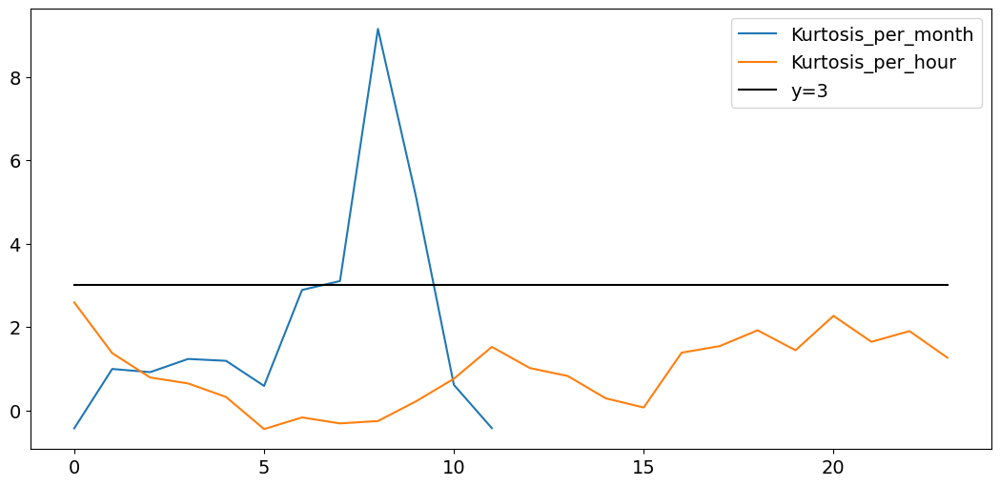

In [554]:
plt.plot(Kurtosis_per_month,label='Kurtosis_per_month')
plt.plot(Kurtosis_per_hour,label='Kurtosis_per_hour')

plt.plot([3 for _ in range(24)],'black',label='y=3')

plt.legend()
plt.show()

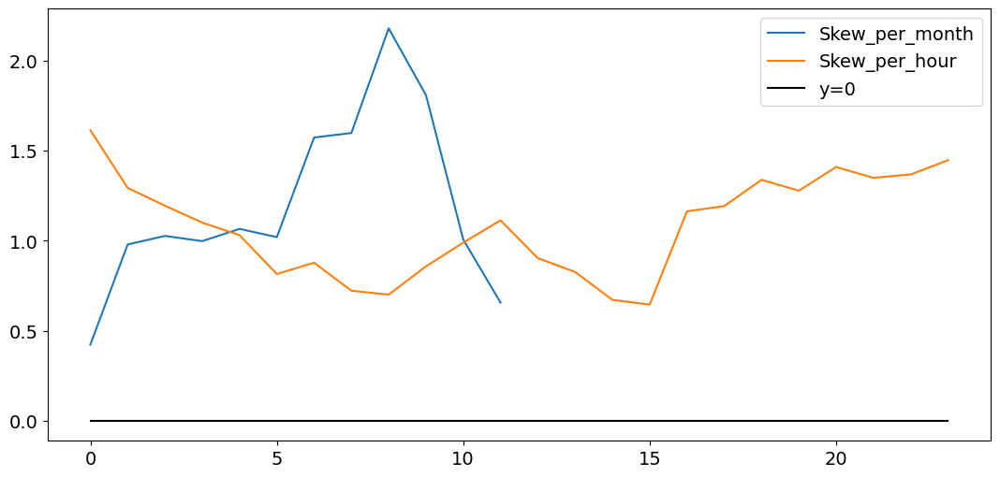

In [555]:
plt.plot(Skew_per_month,label='Skew_per_month')
plt.plot(Skew_per_hour,label='Skew_per_hour')

plt.plot([0 for _ in range(24)],'black',label='y=0')

plt.legend()
plt.show()

In [456]:
inp = Input(shape=(X_train_2.shape[1],
               X_train_2.shape[2]))
x = Time2Vec(120)(inp)
x = Bidirectional(LSTM(48, activation='tanh', return_sequences = True))(x)
x = Dense(output_dim)(x)

model = Model(inp, x)
opt = tf.keras.optimizers.Adam(learning_rate=0.0008, beta_1=0.9, beta_2=0.999, amsgrad=True)
model.compile(optimizer=opt, loss='mse')
model.summary()


# fit model
history=model.fit(X_train_2, y_train_2, epochs=100, batch_size=64, validation_data=(X_val_2, y_val_2) ,verbose=0)
y_pred = model.predict(X_val_2)

PRINT_SCORE_3D(y_val_2, y_pred)

RESULT=SCORE(model_name="Time2Vec-BiLSTM", y_pred=y_pred, y_val=y_val_2,RESULT=RESULT,walk=SARIMAX_RandomWalk['Y_PRED'])
RESULT

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 1, 24)]           0         
                                                                 
 time2_vec (Time2Vec)        (None, 1, 144)            3002      
                                                                 
 bidirectional_9 (Bidirectio  (None, 1, 96)            74112     
 nal)                                                            
                                                                 
 dense_33 (Dense)            (None, 1, 24)             2328      
                                                                 
Total params: 79,442
Trainable params: 79,442
Non-trainable params: 0
_________________________________________________________________
12/12 [==============================] - 2s 3ms/step
RMSE :  0.6418596
MAPE :  2.3615313
SMAPE :  34.15870502048954
DTW :

,model_name,RMSE,MAPE,SMAPE,DTW,RdR_score
0,SARIMAX_Randomwalk_baseline,0.996869,5.161215,43.094156,58.401070,1.000000
0,best_score,0.000000,0.000000,0.000000,0.000000,30.698969
0,LinearRegression,0.677248,2.884223,35.439724,39.060157,10.830267
0,Knn_1,0.634031,4.115064,37.031763,40.187168,10.288370
0,Best_Knn,0.631405,4.459558,36.897767,39.968075,10.399229
0,MLP,0.638252,3.900928,34.859799,38.061255,11.349216
0,XGB,0.669111,4.503739,36.264011,36.030773,12.349027
0,XGB,0.653240,2.826412,36.081918,36.242292,12.251204
0,Vanilla LSTM,1.199456,281.114532,96.303694,108.460316,-24.130916
0,Stacked 2 LSTM,1.196268,452.865997,96.344824,108.499267,-24.148798


In [306]:
df2.corr()['T']

T                        1.000000
year                     0.021987
month                   -0.132443
day                     -0.021163
hour                    -0.121814
dayofweek               -0.211603
quarter                 -0.130263
dayofyear               -0.132043
sin24_2                 -0.031776
sin24_4                  0.004063
cos24_2                  0.008191
cos24_4                  0.014860
tanh24_2                 0.088171
tanh24_4                 0.069303
sin24_6                  0.003505
cos24_6                 -0.011018
tanh24_6                 0.061480
sin365_2                -0.026329
cos365_2                 0.103401
tanh365_2               -0.297404
sin365_4                 0.030157
cos365_4                 0.001312
tanh365_4               -0.210838
sin365_6                 0.010588
cos365_6                -0.007852
tanh365_6               -0.171972
b_spline_0              -0.098689
b_spline_1               0.105491
b_spline_2              -0.109413
b_spline_3    

In [283]:
train_df2 = df2[0:int(n*0.8)]
val_df2 = df2[int(n*0.8):]

In [284]:
df2.columns[1:]

Index(['year', 'month', 'day', 'hour', 'dayofweek', 'quarter', 'dayofyear',
       'sin24_2', 'sin24_4', 'cos24_2', 'cos24_4', 'tanh24_2', 'tanh24_4',
       'sin24_6', 'cos24_6', 'tanh24_6', 'sin365_2', 'cos365_2', 'tanh365_2',
       'sin365_4', 'cos365_4', 'tanh365_4', 'sin365_6', 'cos365_6',
       'tanh365_6', 'b_spline_0', 'b_spline_1', 'b_spline_2', 'b_spline_3',
       'b_spline_4', 'b_spline_5', 'b_spline_6', 'b_spline_7', 'b_spline_8',
       'b_spline_9', 'in_vacances_scolaires', 'is_ferie',
       'in_covid_confinement', 'skweness_per_hour', 'skweness_per_month',
       'kurtosis_per_hour', 'kurtosis_per_month'],
      dtype='object')

In [285]:

# train_df2
# val_df2

TARGET=['T']
FEATURES=df2.columns[1:]
# df2.columns

X_train_df2=train_df2[FEATURES]
y_train_df2=train_df2[TARGET]

X_val_df2=val_df2[FEATURES]
y_val_df2=val_df2[TARGET]

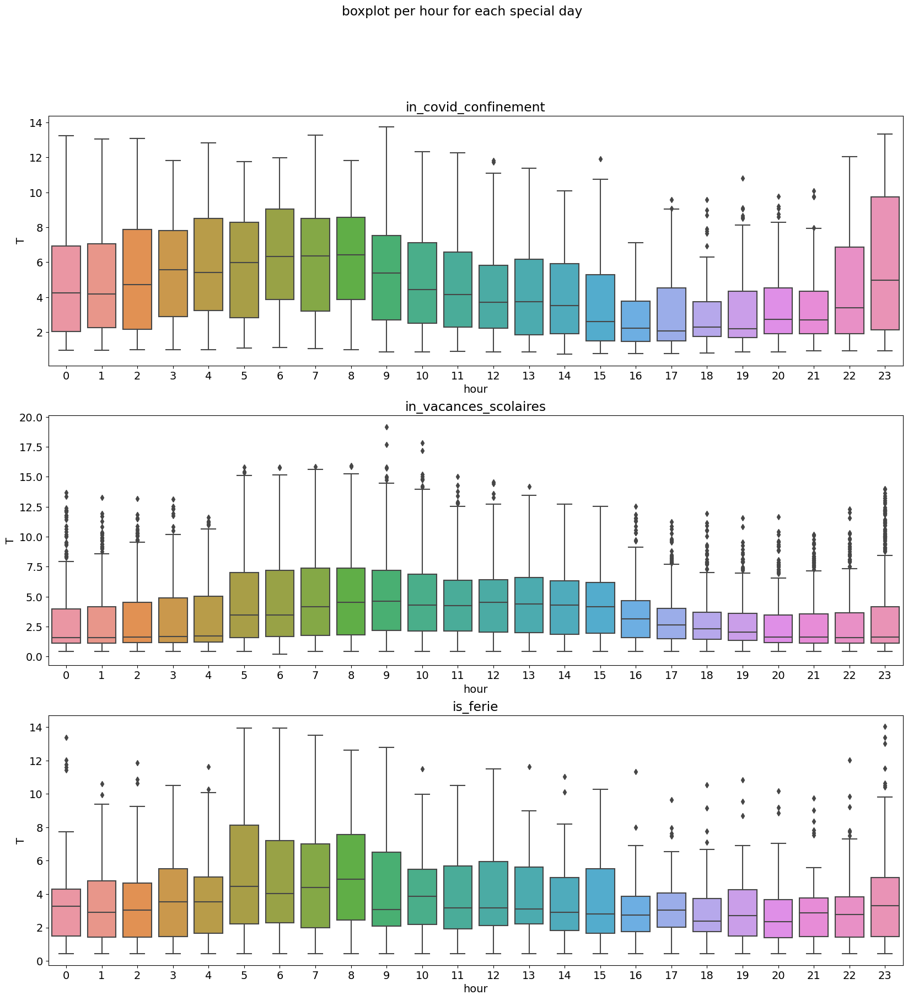

In [286]:
df2.loc[df2['in_covid_confinement']==1]['T'].mean()
df2.loc[df2['in_vacances_scolaires']==1]['T'].mean()
df2.loc[df2['is_ferie']==1]['T'].mean()

# plt.boxplot(df2.loc[df2['in_covid_confinement']==1]['T'])
# plt.boxplot(df2.loc[df2['in_vacances_scolaires']==1]['T'])
# plt.boxplot(df2.loc[df2['is_ferie']==1]['T'])

fig, axes = plt.subplots(nrows=3,ncols=1,figsize=(20,20))
fig.suptitle('boxplot per hour for each special day')

sns.boxplot(ax=axes[0],data=df2.loc[df2['in_covid_confinement']==1], x='hour', y='T')
axes[0].set_title('in_covid_confinement')
sns.boxplot(ax=axes[1],data=df2.loc[df2['in_vacances_scolaires']==1], x='hour', y='T')
axes[1].set_title('in_vacances_scolaires')
sns.boxplot(ax=axes[2],data=df2.loc[df2['is_ferie']==1], x='hour', y='T')
axes[2].set_title('is_ferie')


plt.show()

# sliding windowing

In [41]:
def Y_to_forecast(steps_ahead=24, df2=df2,Target_column='T'):

    data_df2,colname_df2=shiftting_data(df2[[Target_column]],n_in=0,n_out=steps_ahead,Target_column=Target_column)
    check_missing_dates(data_df2)

    data_df2=data_df2[data_df2.columns[1:]]

    Y_df2 = delete_every_nth_row(data_df2,steps_ahead)
    check_missing_dates(Y_df2,f'{steps_ahead}H')
    
    return Y_df2

In [288]:
steps_ahead=24


Y_24_df2 = Y_to_forecast(steps_ahead=24, df2=df2,Target_column='T')
Y_48_df2 = Y_to_forecast(steps_ahead=24*2, df2=df2,Target_column='T')
Y_72_df2 = Y_to_forecast(steps_ahead=24*3, df2=df2,Target_column='T')
Y_96_df2 = Y_to_forecast(steps_ahead=24*4, df2=df2,Target_column='T')
Y_120_df2 = Y_to_forecast(steps_ahead=24*5, df2=df2,Target_column='T')
Y_144_df2 = Y_to_forecast(steps_ahead=24*6, df2=df2,Target_column='T')
Y_168_df2 = Y_to_forecast(steps_ahead=24*7, df2=df2,Target_column='T')


Y_24_df2

No missing dates.
No missing dates.
No missing dates.
No missing dates.
No missing dates.
No missing dates.
No missing dates.
No missing dates.
No missing dates.
No missing dates.
No missing dates.
No missing dates.
No missing dates.
No missing dates.


,T +1h,T +2h,T +3h,T +4h,T +5h,T +6h,T +7h,T +8h,T +9h,T +10h,T +11h,T +12h,T +13h,T +14h,T +15h,T +16h,T +17h,T +18h,T +19h,T +20h,T +21h,T +22h,T +23h,T +24h
Datetime,,,,,,,,,,,,,,,,,,,,,,,,
2016-07-15 00:00:00+00:00,0.99,1.13,1.31,1.17,1.49,1.44,1.11,1.06,1.11,1.06,1.24,1.24,1.24,1.25,2.79,1.84,1.82,1.72,1.13,0.77,0.76,0.82,0.87,0.87
2016-07-16 00:00:00+00:00,0.93,0.93,0.98,0.94,1.16,1.16,1.05,0.94,0.89,0.89,0.90,0.90,0.89,0.71,0.71,0.72,0.71,0.71,0.69,0.70,0.86,0.70,0.71,0.71
2016-07-17 00:00:00+00:00,0.71,0.71,0.71,0.71,0.88,0.89,0.89,0.89,0.90,0.90,0.90,0.90,0.89,0.71,0.72,0.73,0.72,0.72,0.70,0.70,0.84,0.86,0.71,0.70
2016-07-18 00:00:00+00:00,0.70,0.71,1.02,1.41,5.76,3.73,3.22,3.91,4.86,3.43,5.12,3.59,4.69,4.77,5.11,5.28,4.97,3.09,1.78,0.85,0.84,0.82,0.83,0.82
2016-07-19 00:00:00+00:00,0.86,0.86,0.98,1.02,4.37,2.39,3.67,3.86,4.45,3.51,3.46,6.16,8.09,7.63,8.35,7.69,6.20,3.81,2.02,0.90,0.89,0.89,0.88,0.88
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-05-15 00:00:00+00:00,2.72,6.64,2.98,4.22,5.04,2.64,7.18,2.59,5.29,2.77,4.65,4.02,5.29,2.73,2.68,2.57,2.61,2.64,2.64,2.63,2.56,2.64,2.69,2.63
2021-05-16 00:00:00+00:00,2.59,2.70,2.62,2.63,2.53,5.47,7.93,4.60,5.41,3.46,4.18,4.80,2.61,4.84,2.63,2.64,2.60,2.66,2.62,2.63,2.65,11.59,7.88,5.56
2021-05-17 00:00:00+00:00,5.12,6.75,6.71,6.70,7.78,4.98,6.10,6.11,5.64,5.59,3.99,7.10,5.61,6.07,3.46,2.83,2.10,4.73,2.01,4.34,2.00,6.65,4.76,4.01


In [289]:
# window_size=24

# X=[]

# s=df2.iloc[0:0+window_size].values.shape

# for i in range(0,len(df2),window_size):
#     window=df2.iloc[i:i+window_size].values
#     if window.shape != s:
#         break
#     X.append(window)
    
# X=np.asarray(X)
# X.shape      # (1770, 24, 14)

In [291]:

# from keras.layers import Conv1D

# from keras.callbacks import ModelCheckpoint
# from keras.callbacks import EarlyStopping  
# from keras.models import load_model

es = EarlyStopping(monitor='val_loss', mode='auto', verbose=0,patience=15)

**SHAPE : 1D convolutions and recurrent layers use(batch_size, sequence_length, features)**

In [365]:
def Multivariate_X_Y(df2,window_size=24*7,steps_ahead=24):
     
    ####### for the X --> window_size
    
    X=[]

    s=df2.iloc[0:0+window_size].values.shape  # for the break

    for i in range(0,len(df2),steps_ahead):
        window=df2.iloc[i:i+window_size].values
        if window.shape != s:
            break
        X.append(window)
    X=np.asarray(X)
    
    
    
     ####### for the Y --> steps_ahead
    
    # create the predicted values T, T+1 etc... into a dataframe data_df2
    data_df2,colname_df2=shiftting_data(df2[['T']],n_in=0,n_out=steps_ahead,Target_column='T')
    check_missing_dates(data_df2)
    data_df2=data_df2[data_df2.columns[1:]]
    
    # delete every steps_ahead rows to delete the shifted values...
    Y_df2 = delete_every_nth_row(data_df2,steps_ahead)
    #check if there is missing dates
    check_missing_dates(Y_df2,f'{steps_ahead}H')
    
    # we may need to reshape ?
    Y=Y_df2.values.reshape(Y_df2.shape[0],1,Y_df2.shape[1])
    
    
    # we should make sure that X and Y have the same length !!
    a=window_size//24-1
    
    Y=Y[a:,:,:]
    
    print("X.shape ",X.shape)
    print("Y.shape ",Y.shape)
    
    return X,Y

# to test :

# Multivariate_X_Y(df2,window_size=24,steps_ahead=24)
# X.shape  #(1770, 24, 14)
# Y.shape  #(1770, 1, 24)

In [331]:
#########################################################   ML  #########################################################

# from sklearn.linear_model import LinearRegression
# from sklearn.neighbors import KNeighborsRegressor
# from sklearn.model_selection import GridSearchCV
# from sklearn.neural_network import MLPRegressor
# from xgboost import XGBRegressor


# # fit a linear regression model to the window data
# List_model = [LinearRegression(),KNeighborsRegressor(),MLPRegressor(),XGBRegressor()]

# for model in List_model:
    
#     # window
    
    
    
#     model.fit(X_train_4,y_train_4)
    
#     y_pred=model.predict(X_val_4)
#     y_pred=pd.DataFrame(y_pred)
#     y_pred.columns=TARGET
#     y_pred.index=y_val.index
    
#     print(f'{model}')
#     PRINT_SCORE(y_val_4, y_pred)
    
    
# #     RESULT=SCORE(model_name=f"{model}", y_pred=y_pred, y_val=y_val,RESULT=RESULT,walk=SARIMAX_RandomWalk['Y_PRED'])
# # RESULT


In [382]:
X2,Y2 = Multivariate_X_Y(df2,window_size=24*7,steps_ahead=24)

print(X2[:,:,0].ravel()[:24*7])
print(Y2.ravel()[:24])

No missing dates.
No missing dates.
X.shape  (1764, 168, 43)
Y.shape  (1764, 1, 24)
[0.99 0.99 1.13 1.31 1.17 1.49 1.44 1.11 1.06 1.11 1.06 1.24 1.24 1.24
 1.25 2.79 1.84 1.82 1.72 1.13 0.77 0.76 0.82 0.87 0.87 0.93 0.93 0.98
 0.94 1.16 1.16 1.05 0.94 0.89 0.89 0.9  0.9  0.89 0.71 0.71 0.72 0.71
 0.71 0.69 0.7  0.86 0.7  0.71 0.71 0.71 0.71 0.71 0.71 0.88 0.89 0.89
 0.89 0.9  0.9  0.9  0.9  0.89 0.71 0.72 0.73 0.72 0.72 0.7  0.7  0.84
 0.86 0.71 0.7  0.7  0.71 1.02 1.41 5.76 3.73 3.22 3.91 4.86 3.43 5.12
 3.59 4.69 4.77 5.11 5.28 4.97 3.09 1.78 0.85 0.84 0.82 0.83 0.82 0.86
 0.86 0.98 1.02 4.37 2.39 3.67 3.86 4.45 3.51 3.46 6.16 8.09 7.63 8.35
 7.69 6.2  3.81 2.02 0.9  0.89 0.89 0.88 0.88 0.86 0.88 1.11 1.03 6.7
 2.65 3.76 2.78 3.51 2.78 2.58 4.   2.76 2.96 2.87 2.87 2.71 2.17 1.43
 0.98 0.98 0.97 0.94 0.93 0.76 0.77 0.98 0.91 4.17 2.23 1.93 2.35 3.06
 3.22 3.26 2.72 3.58 2.44 3.14 2.31 2.25 2.64 1.45 0.99 0.99 1.01 0.8 ]
[0.76 0.77 0.98 0.91 4.17 2.23 1.93 2.35 3.06 3.22 3.26 2.72 3.5

array([0.99, 0.99, 1.13, 1.31, 1.17, 1.49, 1.44, 1.11, 1.06, 1.11, 1.06,
       1.24, 1.24, 1.24, 1.25, 2.79, 1.84, 1.82, 1.72, 1.13, 0.77, 0.76,
       0.82, 0.87, 0.87, 0.93, 0.93, 0.98, 0.94, 1.16, 1.16, 1.05, 0.94,
       0.89, 0.89, 0.9 , 0.9 , 0.89, 0.71, 0.71, 0.72, 0.71, 0.71, 0.69,
       0.7 , 0.86, 0.7 , 0.71, 0.71, 0.71, 0.71, 0.71, 0.71, 0.88, 0.89,
       0.89, 0.89, 0.9 , 0.9 , 0.9 , 0.9 , 0.89, 0.71, 0.72, 0.73, 0.72,
       0.72, 0.7 , 0.7 , 0.84, 0.86, 0.71, 0.7 , 0.7 , 0.71, 1.02, 1.41,
       5.76, 3.73, 3.22, 3.91, 4.86, 3.43, 5.12, 3.59, 4.69, 4.77, 5.11,
       5.28, 4.97, 3.09, 1.78, 0.85, 0.84, 0.82, 0.83, 0.82, 0.86, 0.86,
       0.98, 1.02, 4.37, 2.39, 3.67, 3.86, 4.45, 3.51, 3.46, 6.16, 8.09,
       7.63, 8.35, 7.69, 6.2 , 3.81, 2.02, 0.9 , 0.89, 0.89, 0.88, 0.88,
       0.86, 0.88, 1.11, 1.03, 6.7 , 2.65, 3.76, 2.78, 3.51, 2.78, 2.58,
       4.  , 2.76, 2.96, 2.87, 2.87, 2.71, 2.17, 1.43, 0.98, 0.98, 0.97,
       0.94, 0.93, 0.76, 0.77, 0.98, 0.91, 4.17, 2.

array([0.76, 0.77, 0.98, 0.91, 4.17, 2.23, 1.93, 2.35, 3.06, 3.22, 3.26,
       2.72, 3.58, 2.44, 3.14, 2.31, 2.25, 2.64, 1.45, 0.99, 0.99, 1.01,
       0.8 , 0.8 ])

In [379]:
X2,Y2 = Multivariate_X_Y(df2,window_size=24*7,steps_ahead=24)
n=int(X2.shape[0]*0.8)

# split train and test 
X_train_5 , y_train_5= X2[:n] , Y2[:n]
X_val_5 ,  y_val_5 = X2[n:] , Y2[n:]

No missing dates.
No missing dates.
X.shape  (1764, 168, 43)
Y.shape  (1764, 1, 24)


In [333]:
# make the X and Y with : window_size=24,steps_ahead=24

X,Y = Multivariate_X_Y(df2,window_size=24,steps_ahead=24)
n=int(X.shape[0]*0.8)

# split train and test 
X_train_4 , y_train_4 = X[:n] , Y[:n]
X_val_4 ,  y_val_4 = X[n:] , Y[n:]


No missing dates.
No missing dates.
X.shape  (1770, 24, 43)
Y.shape  (1770, 1, 24)


**Seq2Seq**

In [334]:
def run_Seq2Seq(X_train_4, y_train_4, X_val_4,  y_val_4):
    
    input_dim = X_train_4.shape[2] # n_features # 24
    output_dim = Y.shape[2] # n_targets # 24

    model = Sequential()
    # Encoder
    model.add(LSTM(units=50, return_sequences=False, activation = 'tanh',input_shape=(X_train_4.shape[1], X_train_4.shape[2])))
    model.add(Dense(150, activation="relu") )
    #Use "RepeatVector" to copy N copies of Encoder's output (last time step) as Decoder's N inputs
    model.add(RepeatVector(output_dim))
    # Decoder (second LSTM) 
    model.add(LSTM(units=input_dim, activation = 'tanh', return_sequences=True) )
    # TimeDistributed is to ensure consistency between Dense and Decoder
    model.add(TimeDistributed(Dense(output_dim, activation="linear")) )

    # Compile the model
    opt = tf.keras.optimizers.Adam(learning_rate=0.0001)
    model.compile(optimizer=opt, loss='mean_squared_error')

    history=model.fit(X_train_4, y_train_4, epochs=200, batch_size=64,
                      validation_data=(X_val_4, y_val_4) ,verbose=0, callbacks=[es])

    y_pred = model.predict(X_val_4)
    y_pred=y_pred[:,-1,:]
    
    PRINT_SCORE(y_val_4, y_pred)
    
    return y_pred,history

In [335]:
y_pred, history = run_Seq2Seq(X_train_4, y_train_4, X_val_4,  y_val_4)

12/12 [==============================] - 1s 14ms/step
RMSE :  3.5011589931625435
MAPE :  0.7980049967282078
SMAPE :  40.0106144157079
DTW :  50.96156718396178


max epoch : 50


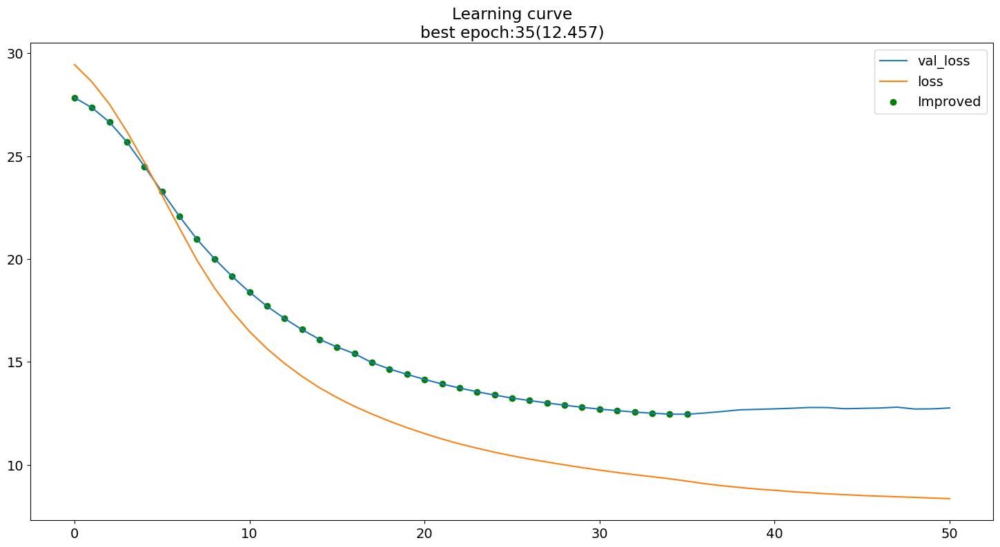

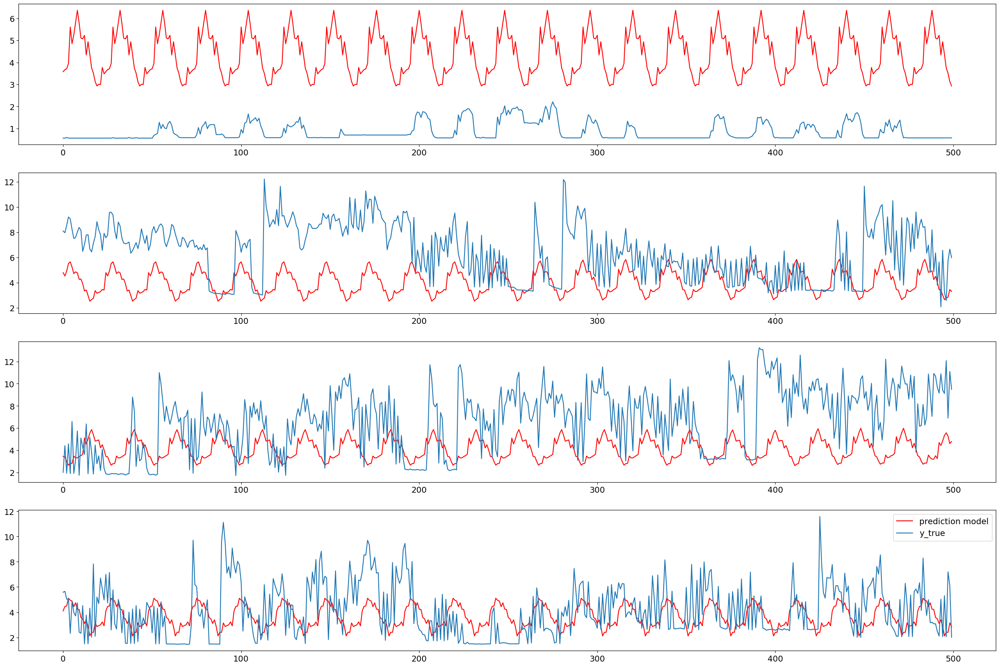

In [337]:
Plot_History_val_loss(history)
PLOT_RESULT_3D(y_pred,y_val_4)

In [380]:
y_pred, history = run_Seq2Seq(X_train_5, y_train_5, X_val_5,  y_val_5)


12/12 [==============================] - 2s 37ms/step
RMSE :  3.6205550800980837
MAPE :  1.0929121866325477
SMAPE :  42.03731205966018
DTW :  50.85196005433199


max epoch : 55


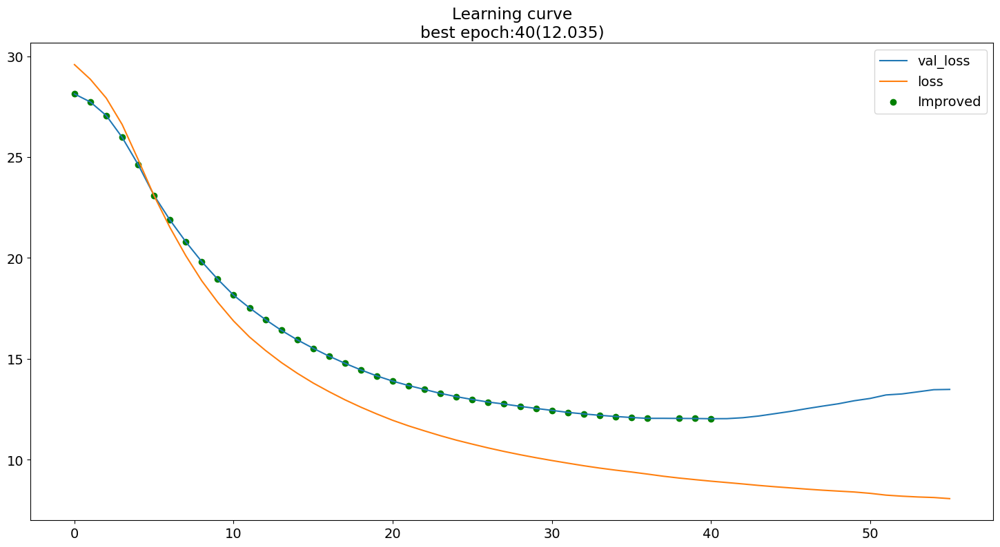

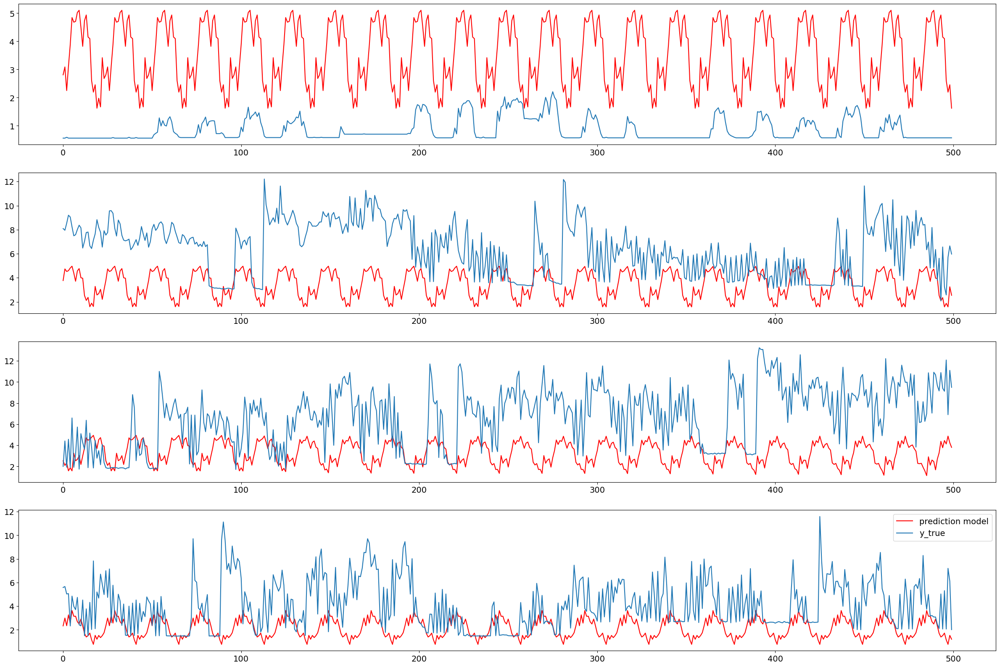

In [383]:
Plot_History_val_loss(history)
PLOT_RESULT_3D(y_pred,y_val_4)

**TCN-BiLSTM**

In [307]:
i = Input(shape=(X_train_4.shape[1], X_train_4.shape[2]))
m = TCN(nb_filters=32,
                 kernel_size=16,
                 nb_stacks=4,
                 dilations=(2, 4, 8, 16, 32, 64),
                 padding='causal',
                 use_skip_connections=True,
                 dropout_rate=0.0,
                 activation='tanh',
                 kernel_initializer='glorot_uniform',
                 use_batch_norm=False,
                 use_layer_norm=False,
                 use_weight_norm=False,
        return_sequences = True)(i)
m = Bidirectional(LSTM(input_dim, return_sequences=False, activation = 'tanh'))(m)
#m = TimeDistributed(Dense(output_dim, activation = 'linear'))(m)
m = Dense(steps_ahead, activation='linear')(m)

model = Model(inputs=[i], outputs=[m])


opt = tf.keras.optimizers.Adam(learning_rate=0.0001)
model.compile(loss='mse', optimizer=opt)

history=model.fit(X_train_4, y_train_4, epochs=200, batch_size=64,
                  validation_data=(X_val_4, y_val_4) ,verbose=0, callbacks=[es])

y_pred = model.predict(X_val_4)
PRINT_SCORE(y_val_4, y_pred)

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 24, 43)]          0         
                                                                 
 tcn_2 (TCN)                 (None, 24, 32)            795008    
                                                                 
 bidirectional_10 (Bidirecti  (None, 86)               26144     
 onal)                                                           
                                                                 
 dense_97 (Dense)            (None, 24)                2088      
                                                                 
Total params: 823,240
Trainable params: 823,240
Non-trainable params: 0
_________________________________________________________________
12/12 [==============================] - 6s 140ms/step
RMSE :  4.071910780742792
MAPE :  19.48051984236643
SMAPE :  54.

max epoch : 39


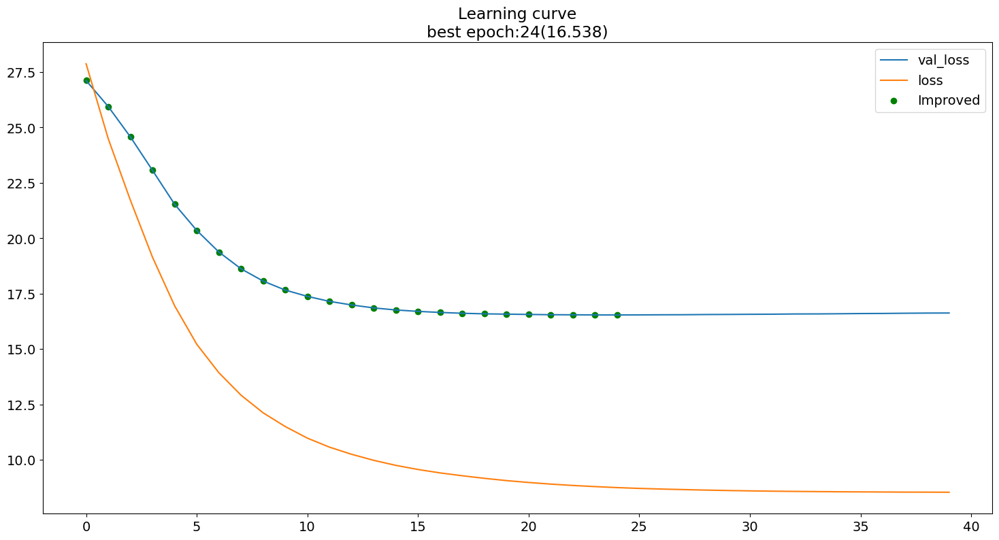

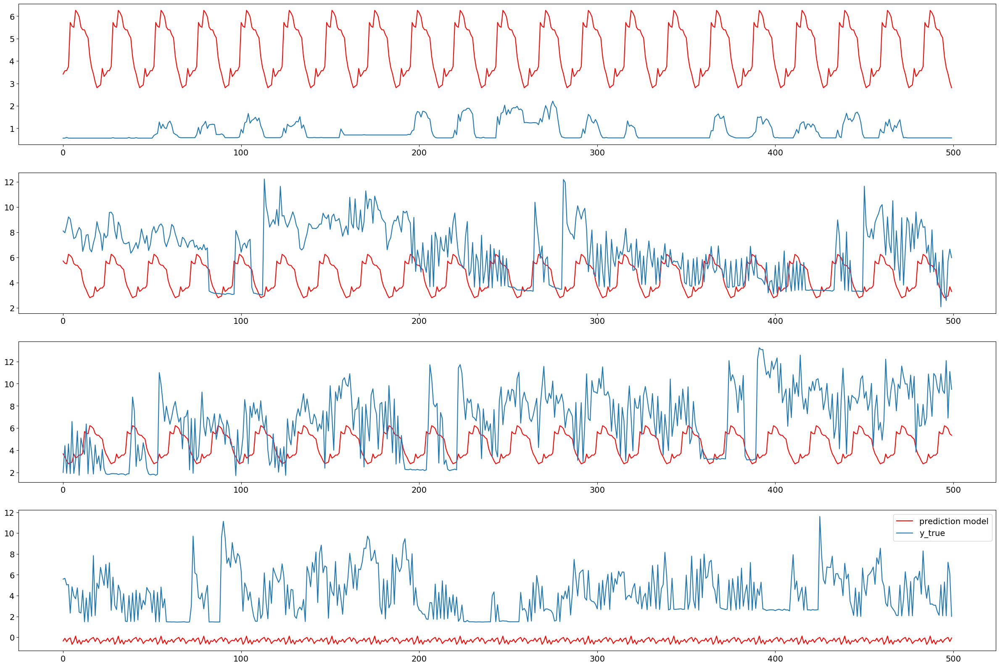

In [308]:
Plot_History_val_loss(history)
PLOT_RESULT_3D(y_pred,y_val_4)

**Attention-BiLTSM**

In [228]:
model = Sequential()
model.add(Bidirectional(LSTM(units=input_dim, 
                             return_sequences=True, 
                             kernel_initializer = 'uniform',
                             activation = 'tanh'
                             )))
model.add(SeqSelfAttention(attention_activation = 'linear'))
model.add(TimeDistributed(Dense(units=output_dim, activation = None)))

opt = tf.keras.optimizers.Adam(learning_rate=0.0005)#, beta_1=0.9, beta_2=0.999, amsgrad=True)
model.compile(loss='mse', optimizer=opt)

history=model.fit(X_train_4, y_train_4, epochs=200, batch_size=64,
                  validation_data=(X_val_4, y_val_4) ,verbose=0, callbacks=[es])

# y_pred = model.predict(X_val_4)
# PRINT_SCORE(y_val_4, y_pred)

In [231]:
y_pred = model.predict(X_val_4)
print(y_pred.shape)
y_pred=y_pred[:,-1,:]
print(y_pred.shape)

PRINT_SCORE(y_val_4, y_pred)

12/12 [==============================] - 0s 12ms/step
(354, 24, 24)
(354, 24)
RMSE :  3.2807123811204173
MAPE :  0.6674834330700077
SMAPE :  38.02090396775939
DTW :  51.0673367052147


max epoch : 51


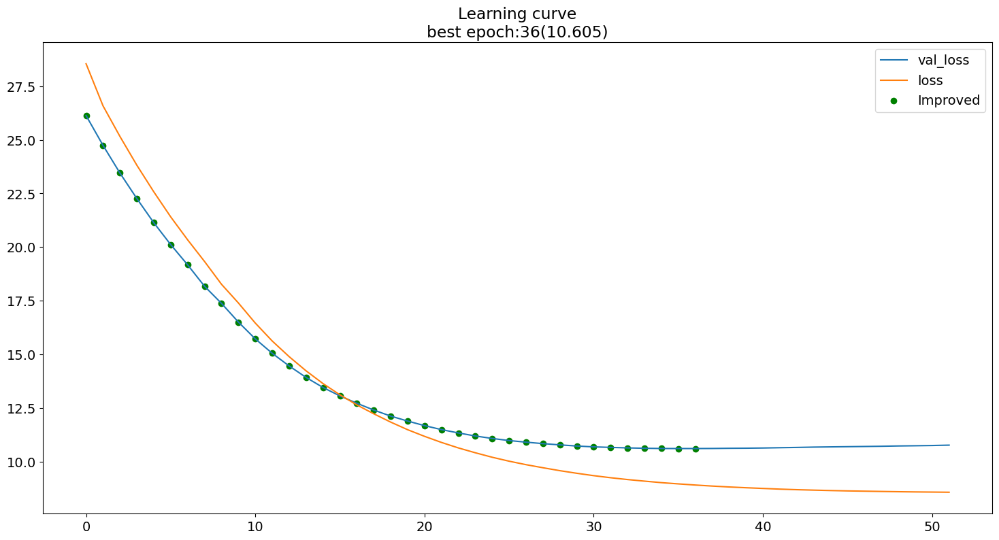

In [232]:
Plot_History_val_loss(history)
PLOT_RESULT_3D(y_pred,y_val_4)

**Seq2Seq-Attention**

In [223]:
input_train = Input(shape=(X_train_4.shape[1], X_train_4.shape[2]))
output_train = Input(shape=(y_train_4.shape[1], y_train_4.shape[2]))    

encoder_stack_h, encoder_last_h, encoder_last_c = LSTM(48, activation='tanh', 
                                                       dropout=0.2, 
                                                       recurrent_dropout=0.2, 
                                                       return_state=True, 
                                                       return_sequences=True)(input_train)

decoder_input = RepeatVector(output_train.shape[1])(encoder_last_h)

decoder_stack_h = LSTM(48, activation='tanh', 
                       dropout=0.2, 
                       recurrent_dropout=0.2,
                       return_state=False, 
                       return_sequences=True)(decoder_input, initial_state=[encoder_last_h, encoder_last_c])

attention = dot([decoder_stack_h, encoder_stack_h], axes=[2, 2])
attention = Activation('softmax')(attention)

context = dot([attention, encoder_stack_h], axes=[2,1])

decoder_combined_context = concatenate([context, decoder_stack_h])

out = TimeDistributed(Dense(y_train_4.shape[2]))(decoder_combined_context)
model = Model(inputs=input_train, outputs=out)



opt = tf.keras.optimizers.Adam(learning_rate=0.0008, beta_1=0.9, beta_2=0.999, amsgrad=True)
model.compile(optimizer=opt, loss='mse')


history=model.fit(X_train_4, y_train_4, epochs=200, batch_size=64,
                  validation_data=(X_val_4, y_val_4) ,verbose=0, callbacks=[es])

y_pred = model.predict(X_val_4)
PRINT_SCORE(y_val_4, y_pred)

12/12 [==============================] - 1s 6ms/step
RMSE :  3.4711592518050804
MAPE :  0.5817807188931041
SMAPE :  37.963363614029234
DTW :  51.96637474284815


max epoch : 27


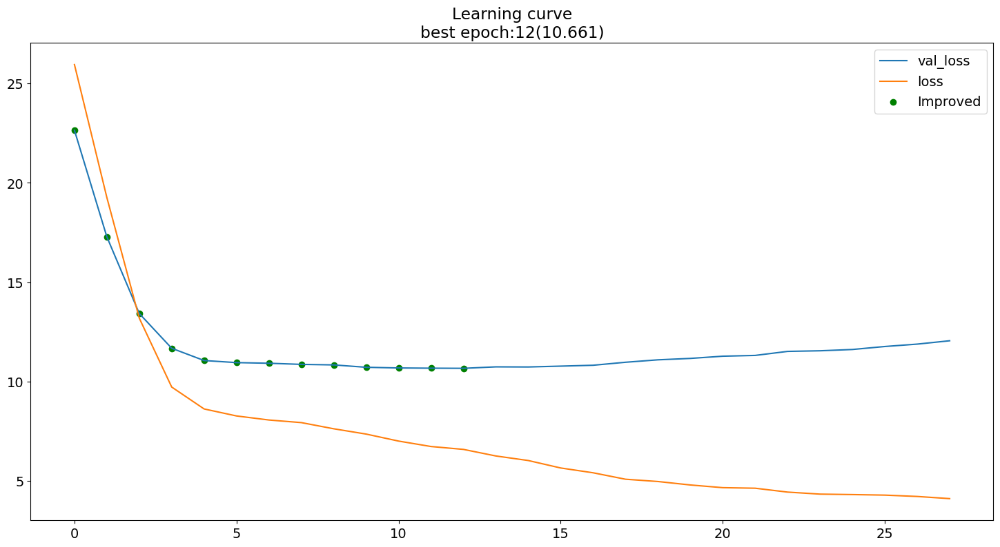

In [224]:
Plot_History_val_loss(history)
PLOT_RESULT_3D(y_pred,y_val_4)

# MultiHead Attention-BiLSTM

In [309]:
model = Sequential()
model.add(Bidirectional(LSTM(units=input_dim*3, 
                             return_sequences=True, 
                             kernel_initializer = 'uniform',
                             activation = 'tanh'
                             )))
model.add(MultiHeadAttention(head_num = X_val_4.shape[2]))
model.add(Bidirectional(LSTM(input_dim, return_sequences=True, activation = 'tanh')))#,return_sequences=False))
model.add(TimeDistributed(Dense(units=output_dim, activation = 'linear')))


opt = tf.keras.optimizers.Adam(learning_rate=0.0001)
model.compile(loss='mse', optimizer=opt)

history=model.fit(X_train_4, y_train_4, epochs=200, batch_size=64,
                  validation_data=(X_val_4, y_val_4) ,verbose=0, callbacks=[es])

y_pred = model.predict(X_val_4)

y_pred=y_pred[:,-1,:]

PRINT_SCORE(y_val_4, y_pred)

12/12 [==============================] - 3s 39ms/step
RMSE :  4.170608326571618
MAPE :  2.45533435453097
SMAPE :  46.571173993528824
DTW :  60.62377013436085


max epoch : 33


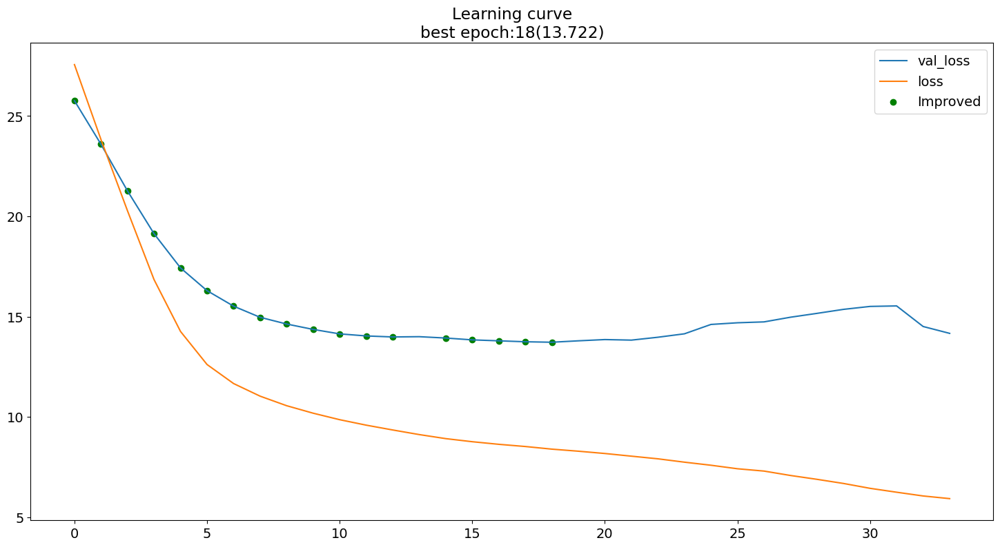

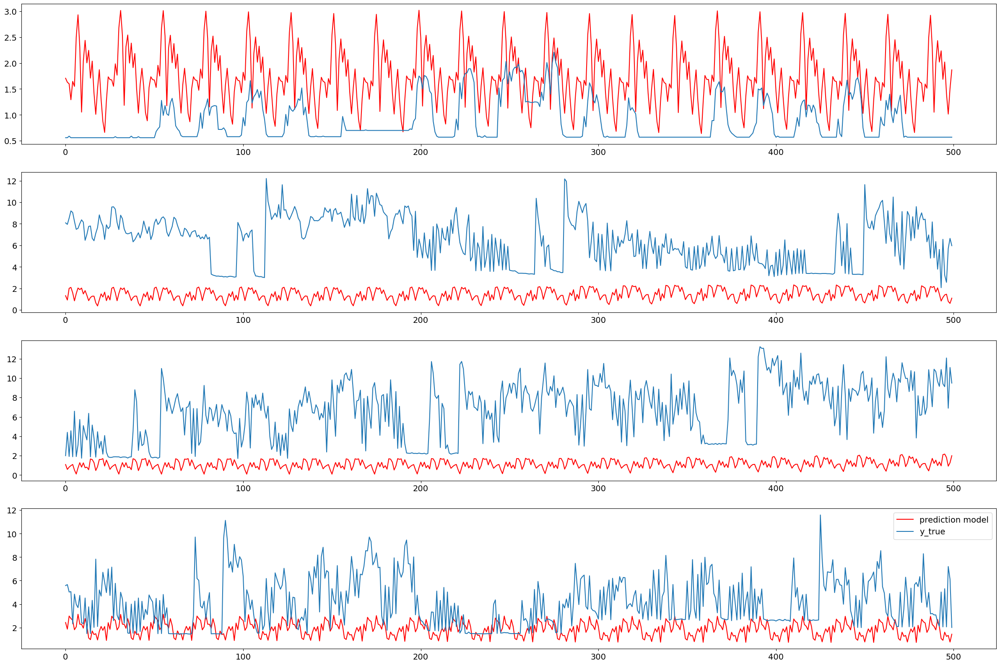

In [310]:
Plot_History_val_loss(history)
PLOT_RESULT_3D(y_pred,y_val_4)


# Univariate forecasting

In [424]:
df

,T
Datetime,
2016-07-15 00:00:00+00:00,0.99
2016-07-15 01:00:00+00:00,0.99
2016-07-15 02:00:00+00:00,1.13
2016-07-15 03:00:00+00:00,1.31
2016-07-15 04:00:00+00:00,1.17
...,...
2021-05-19 20:00:00+00:00,5.31
2021-05-19 21:00:00+00:00,2.06
2021-05-19 22:00:00+00:00,7.20


In [461]:
######### scale the dataset

# convert to float 32
df[df.select_dtypes(np.float64).columns] = df.select_dtypes(np.float64).astype(np.float32)

# Scale the data
n = int(len(df)*0.8)    
train= df[:n]
test=df[n:]

#     scaler = StandardScaler() 
scaler = MinMaxScaler() 

# # Fit the scaler to the dataset
train=pd.DataFrame(scaler.fit_transform(train),index=train.index)
train.rename(columns={0: "T"},inplace=True)

# # Transform the data using the fitted scaler
test=pd.DataFrame(scaler.transform(test),index=test.index)
test.rename(columns={0: "T"},inplace=True)

# now concat
df=pd.concat([train,test])

df

,T
Datetime,
2016-07-15 00:00:00+00:00,0.046004
2016-07-15 01:00:00+00:00,0.046004
2016-07-15 02:00:00+00:00,0.052509
2016-07-15 03:00:00+00:00,0.060874
2016-07-15 04:00:00+00:00,0.054368
...,...
2021-05-19 20:00:00+00:00,0.246747
2021-05-19 21:00:00+00:00,0.095725
2021-05-19 22:00:00+00:00,0.334572


In [500]:
def Univariate_X_Y(df,window_size=24,target=24):
        
    # create shifted dataset
    dataT,colname=shiftting_data(df,n_in=window_size-1,n_out=target,Target_column='T')
#     check_missing_dates(dataT,'H')

    # delete repeting row based on target
    dataT = delete_every_nth_row(dataT,target)
#     check_missing_dates(dataT,f'{target}H')
    
    # split train and validation
    n = len(dataT)
    train_T = dataT[0:int(n*0.8)]
    val_T = dataT[int(n*0.8):]
    

    # FEATURES and TARGET
    FEATURES=colname[:target]
    TARGET=colname[target:]
    
    X_train_T=train_T[FEATURES]
    y_train_T=train_T[TARGET]

    X_val_T=val_T[FEATURES]
    y_val_T=val_T[TARGET]
    
    return X_train_T, y_train_T , X_val_T , y_val_T
 
    
X_train, y_train , X_val , y_val = Univariate_X_Y(df,window_size=24,target=24)

In [464]:
print(X_train.shape)
print(y_train.shape)
print(X_val.shape)
print(y_val.shape)

(1415, 24)
(1415, 24)
(354, 24)
(354, 24)


**in each rows we have 24 hours and we will predict the next day so 24 hours**

# Random Walk for RdR score

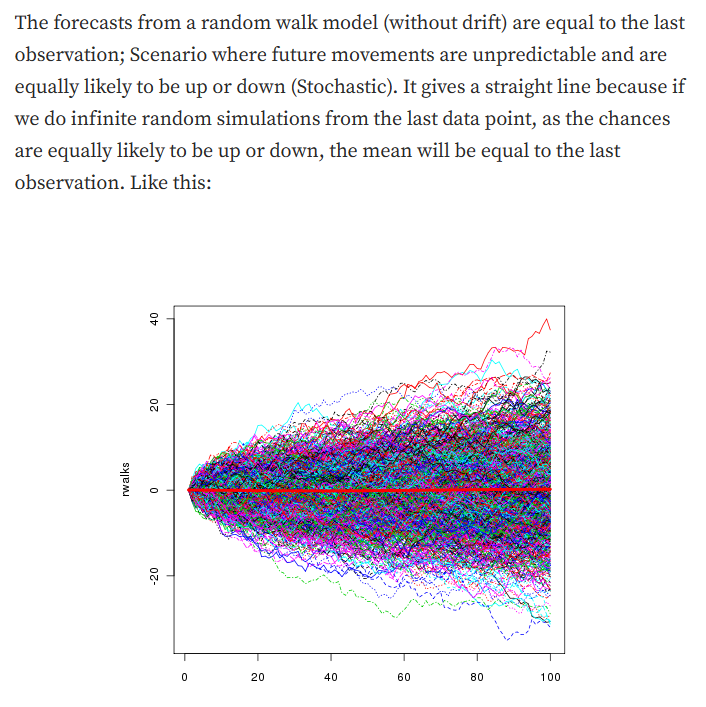

In [481]:
test=df[int(len(df)*0.8-window_size):]
test

,T
Datetime,
2020-05-30 00:00:00+00:00,0.026022
2020-05-30 01:00:00+00:00,0.029275
2020-05-30 02:00:00+00:00,0.026487
2020-05-30 03:00:00+00:00,0.026022
2020-05-30 04:00:00+00:00,0.026022
...,...
2021-05-19 20:00:00+00:00,0.246747
2021-05-19 21:00:00+00:00,0.095725
2021-05-19 22:00:00+00:00,0.334572


In [480]:

def random_walk_forecast(series, n, freq='H'):
    # Generate a forecast by randomly walking n steps ahead in the series
    scale = np.std(series)
    mean = np.mean(series)
    forecast = []
    for i in range(n):
        # for more constant result we can just add the standard variation for Upper values
        # then RdR score will be based between the comparaison of the upper value of the forecast that will diverge in time
        # and our prediction ???
#         forecast.append(series.iloc[-1] + np.random.normal(0, scale))  # we got a strait line not good..
        
        forecast.append(series.iloc[-1] + np.random.normal(0, scale))
        date=max(series.index) +  timedelta(hours=1)
        series = series.append(pd.Series(data=[forecast[-1]],index=[date]))

    return series[n:]

# test[400:400+24]['T'].plot()
# random_walk_forecast(test[400:400+24]['T'],24).plot()
# test[400+24:400+24+24]['T'].plot()
# plt.show()

################################## SLIDING WINDOW  SCRATCH RANDOM WALK ##############################################
window_size=24
steps_ahead=24

# data=test[7:]         # little adjustement for the sliding window ... need to have 354 * 24 #8496 values...
data=df[int(len(df)*0.8-window_size):]

RandomWalkPred=pd.Series()

# loop through the time series data, using each window to make a prediction
for i in range(0,len(data) - window_size - steps_ahead,steps_ahead):
    
    # create the window of data
    window = data[i : i + window_size]
    
    RandomWalkPred=RandomWalkPred.append(random_walk_forecast(window['T'],steps_ahead))
    
############ verify the size of the prediction .........

# predictions_RandomWalk
first_date=min(y_val.index)  #  '2020-05-30 23:00:00+00:00' 
last_date=max(y_val.index) +  timedelta(hours=24) #   '2021-05-19 15:00:00+00:00' # il faut ajouter 24h ...


RandomWalkPred=RandomWalkPred.loc[first_date:last_date]
RandomWalkPred



2020-05-31 00:00:00+00:00    0.025029
2020-05-31 01:00:00+00:00    0.025840
2020-05-31 02:00:00+00:00    0.026276
2020-05-31 03:00:00+00:00    0.025822
2020-05-31 04:00:00+00:00    0.026247
                               ...   
2021-05-19 19:00:00+00:00    0.147186
2021-05-19 20:00:00+00:00    0.263041
2021-05-19 21:00:00+00:00    0.238180
2021-05-19 22:00:00+00:00    0.298722
2021-05-19 23:00:00+00:00    0.381752
Length: 8496, dtype: float64

In [482]:
################################   RANDOM WALK WITH SARIMAX

import statsmodels.api as sm

freq=365
window_size=24
steps_ahead=24

data=df[int(len(df)*0.8-window_size):]

# create an empty list to hold the predictions
SARIMAX_RandomWalk = pd.DataFrame(columns=['Y_PRED', 'Y_PRED_LOWER', 'Y_PRED_UPPER'])


# break condition for the loop
s = data[0 : 0 + window_size]
# loop through the time series data, using each window to make a prediction
for i in range(0,len(data) - window_size - steps_ahead,steps_ahead):

    # create the window of data
    window = data[i : i + window_size]
    
    #break condition
    if s.shape != window.shape:
        break
    
    # get the date
    start_date = min(window.index)
    end_date = max(window.index)

    start2=window.iloc[1].name # we should start with the second value if not we get a 0

    # fit an SARIMAX model to the window

    model1 = sm.tsa.SARIMAX(window['T'],
                                   order=(0,1,0),
                                   seasonal_order=(0, 0, 0, 0),
                                   enforce_stationarity=False,
                                   enforce_invertibility=False,
                                    transformed = True)

    model1 = model1.fit(method = 'lbfgs') 
#     RandomWalkPred_2 = model1.get_prediction(start=start2,end=end_date,dynamic=False)
    RandomWalkPred_2=model1.get_forecast(steps=24)


    pred_ci2 = RandomWalkPred_2.conf_int()
    y_forecasted = pd.DataFrame(RandomWalkPred_2.predicted_mean).astype(float)
    RandomWalkPred_2 = pd.concat([y_forecasted, pred_ci2.astype(float)], axis = 1)
    RandomWalkPred_2.columns = ['Y_PRED', 'Y_PRED_LOWER', 'Y_PRED_UPPER']
    RandomWalkPred_2.index = pd.to_datetime(RandomWalkPred_2.index)

#     first_value=window.iloc[0]['T']
#     first=pd.DataFrame({'Y_PRED':[first_value], 'Y_PRED_LOWER':[first_value], 'Y_PRED_UPPER':[first_value]},index=[start_date])

#     SARIMAX_RandomWalk=SARIMAX_RandomWalk.append(first)
    SARIMAX_RandomWalk=SARIMAX_RandomWalk.append(RandomWalkPred_2)


first_date=min(y_val.index)  #  '2020-05-30 23:00:00+00:00' 
last_date=max(y_val.index) +  timedelta(hours=steps_ahead) #   '2021-05-19 15:00:00+00:00' # il faut ajouter 24h ...

SARIMAX_RandomWalk = SARIMAX_RandomWalk.loc[first_date:last_date]
check_missing_dates(SARIMAX_RandomWalk)
SARIMAX_RandomWalk    



No missing dates.


,Y_PRED,Y_PRED_LOWER,Y_PRED_UPPER
2020-05-31 00:00:00+00:00,0.026022,0.024583,0.027461
2020-05-31 01:00:00+00:00,0.026022,0.023987,0.028058
2020-05-31 02:00:00+00:00,0.026022,0.023530,0.028515
2020-05-31 03:00:00+00:00,0.026022,0.023144,0.028901
2020-05-31 04:00:00+00:00,0.026022,0.022804,0.029240
...,...,...,...
2021-05-19 19:00:00+00:00,0.212825,-0.472510,0.898161
2021-05-19 20:00:00+00:00,0.212825,-0.489434,0.915085
2021-05-19 21:00:00+00:00,0.212825,-0.505960,0.931611
2021-05-19 22:00:00+00:00,0.212825,-0.522115,0.947766


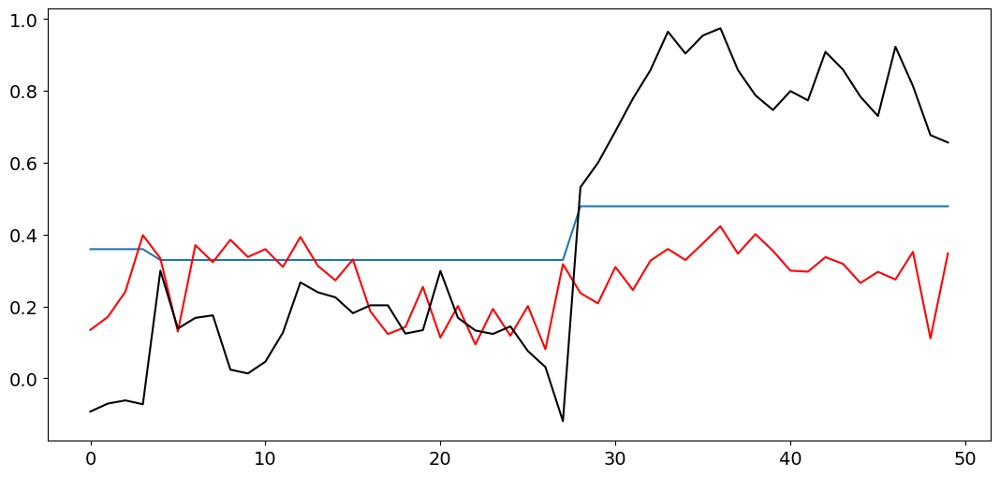

In [449]:
plt.plot(SARIMAX_RandomWalk['Y_PRED'][4100:4150].values)
plt.plot(y_val.values.ravel()[4100:4150],'r')
plt.plot(RandomWalkPred[4100:4150].values,'black')

In [450]:
def RDR(walk,y_val,y_pred):
    
        
    ##### then RMSE and DTW between ****RandomWalk_prediction**** and true values
    rmse_rw = RMSE(y_val, walk)
    dtw_distance_rw = DTW(np.double(y_val), np.double(walk))

    # ##### then RMSE and DTW between the model_prediction and true values
    rmse_model = RMSE(y_pred,y_val)
    dtw_distance_model = DTW(np.double(y_pred),np.double(y_val))

    ##### MinMaxScaler
    from sklearn.preprocessing import MinMaxScaler
    rmse_scaler = MinMaxScaler(feature_range = (0,1))
    dtw_scaler = MinMaxScaler(feature_range = (0,1))


    print(1 - rmse_scaler.fit_transform(np.array(rmse_rw).reshape(1, -1)))
    a=1 - rmse_scaler.transform(np.array(rmse_model).reshape(1,-1))
    print(a)


    print(1 - dtw_scaler.fit_transform(np.array(dtw_distance_rw).reshape(1, -1)))
    b=1 - dtw_scaler.transform(np.array(dtw_distance_model).reshape(1,-1))
    print(b)

    RdR_Score=(a+b)/2
    print(RdR_Score)
    return float(RdR_Score)

In [492]:

def SCORE(model_name, y_pred, y_val,RESULT=RESULT, walk= SARIMAX_RandomWalk['Y_PRED']):
    if isinstance(y_val, np.ndarray):y_val=y_val.ravel()
    if isinstance(y_val, pd.DataFrame):y_val=y_val.values.ravel()
    if isinstance(y_val, pd.Series):y_val=y_val.values.ravel()
   
    if isinstance(y_pred, np.ndarray):y_pred=y_pred.ravel()
    if isinstance(y_pred, pd.DataFrame):y_pred=y_pred.values.ravel()
        
    if isinstance(walk, pd.Series):walk=walk.values.ravel()
    if isinstance(walk, pd.DataFrame):walk=walk.values.ravel()
        
#     y_val=y_val[:len(walk)]
#     y_pred=y_pred[:len(walk)]
    
    df2 = pd.DataFrame({"model_name": str(model_name),
                    "RMSE": [RMSE(y_pred, y_val)],
                    "MAPE": [MAPE(y_pred, y_val)],
                    "SMAPE": [SMAPE(y_pred, y_val)],
                    "DTW": [DTW(np.double(y_pred), np.double(y_val))],
                    "RdR_score": [RDR(walk=walk,y_val=y_val,y_pred=y_pred)]})

    RESULT = pd.concat([RESULT, df2])
    return RESULT

def SCORE_2(model_name, y_pred, y_val,RESULT_2=RESULT_2 ):
    
    if isinstance(y_val, np.ndarray):y_val=y_val.ravel()
    if isinstance(y_val, pd.DataFrame):y_val=y_val.values.ravel()
    if isinstance(y_val, pd.Series):y_val=y_val.values.ravel()
   
    if isinstance(y_pred, np.ndarray):y_pred=y_pred.ravel()
    if isinstance(y_pred, pd.DataFrame):y_pred=y_pred.values.ravel()
    
    df2 = pd.DataFrame({"model_name": str(model_name),
                    "RMSE": [RMSE(y_pred, y_val)],
                    "MAPE": [MAPE(y_pred, y_val)],
                    "SMAPE": [SMAPE(y_pred, y_val)],
                    "DTW": [DTW(np.double(y_pred), np.double(y_val))]})

    RESULT_2 = pd.concat([RESULT_2, df2])
    return RESULT_2


In [385]:
# SCORE(model_name="randomwalk", y_pred=SARIMAX_RandomWalk['Y_PRED'], y_val=y_val,RESULT=RESULT,walk=SARIMAX_RandomWalk['Y_PRED'])
# SCORE(model_name="randomwalk_rd", y_pred=RandomWalkPred, y_val=y_val,RESULT=RESULT,walk=SARIMAX_RandomWalk['Y_PRED'])

RESULT=SCORE(model_name="SARIMAX_Randomwalk_baseline", y_pred=SARIMAX_RandomWalk['Y_PRED'], y_val=y_val,RESULT=RESULT,walk=SARIMAX_RandomWalk['Y_PRED'])
RESULT


[[1.]]
[[1.]]
[[1.]]
[[1.]]
[[1.]]


,model_name,RMSE,MAPE,SMAPE,DTW,RdR_score
0,SARIMAX_Randomwalk_baseline,0.996869,5.161215,43.094156,48.109527,1.0
0,SARIMAX_Randomwalk_baseline,0.996869,5.161215,43.094156,48.109527,1.0


In [485]:
RESULT=SCORE(model_name="best_score", y_pred=y_val, y_val=y_val,RESULT=RESULT,walk=SARIMAX_RandomWalk['Y_PRED'])
RESULT

[[1.]]
[[1.1318024]]
[[1.]]
[[45.44905332]]
[[23.29042788]]


,model_name,RMSE,MAPE,SMAPE,DTW,RdR_score
0,SARIMAX_Randomwalk_baseline,0.996869,5.161215,43.094156,48.109527,1.000000
0,SARIMAX_Randomwalk_baseline,0.996869,5.161215,43.094156,48.109527,1.000000
0,best_score,0.000000,0.000000,0.000000,0.000000,25.553198
0,LinearRegression,0.677248,2.884223,35.439724,31.337030,9.546059
0,Knn_1,0.634031,4.115064,37.031763,30.890154,9.791106
0,Best_Knn,0.631405,4.459558,36.897767,30.734057,9.870467
0,MLP,0.638252,3.900928,34.859799,30.102252,10.182946
0,XGB,0.669111,4.503739,36.264011,28.938602,10.749342
0,XGB,0.653240,2.826412,36.081918,28.613899,10.919628
0,LinearRegression,0.085944,0.350515,18.935803,30.121844,8.186533


In [533]:
# ################################   PREDICTION SARIMAX SLIDING WINDOW


# freq=365
# window_size=24
# steps_ahead=24

# data=df[int(len(df)*0.8-window_size):]

# # create an empty list to hold the predictions
# SARIMAX_sliding = pd.DataFrame(columns=['Y_PRED', 'Y_PRED_LOWER', 'Y_PRED_UPPER'])


# # break condition for the loop
# s = data[0 : 0 + window_size]
# # loop through the time series data, using each window to make a prediction
# for i in range(0,len(data) - window_size - steps_ahead,steps_ahead):

#     # create the window of data
#     window = data[i : i + window_size]
    
#     #break condition
#     if s.shape != window.shape:
#         break
    
#     # get the date
#     start_date = min(window.index)
#     end_date = max(window.index)

#     start2=window.iloc[1].name # we should start with the second value if not we get a 0

#     # fit an SARIMAX model to the window

#     model1 = sm.tsa.SARIMAX(window['T'],
#                                    order=(1,1,1),
#                                    seasonal_order=(1, 1, 1, freq),
#                                    enforce_stationarity=False,
#                                    enforce_invertibility=False,
#                                     transformed = True)

#     model1 = model1.fit(method = 'lbfgs') 
#     SARIMAX_Pred=model1.get_forecast(steps=steps_ahead)


#     pred_ci2 = SARIMAX_Pred.conf_int()
#     y_forecasted = pd.DataFrame(SARIMAX_Pred.predicted_mean).astype(float)
#     SARIMAX_Pred = pd.concat([y_forecasted, pred_ci2.astype(float)], axis = 1)
#     SARIMAX_Pred.columns = ['Y_PRED', 'Y_PRED_LOWER', 'Y_PRED_UPPER']
#     SARIMAX_Pred.index = pd.to_datetime(SARIMAX_Pred.index)

# #     first_value=window.iloc[0]['T']
# #     first=pd.DataFrame({'Y_PRED':[first_value], 'Y_PRED_LOWER':[first_value], 'Y_PRED_UPPER':[first_value]},index=[start_date])

# #     SARIMAX_sliding=SARIMAX_sliding.append(first)
#     SARIMAX_sliding=SARIMAX_sliding.append(SARIMAX_Pred)


# first_date=min(y_val.index)  #  '2020-05-30 23:00:00+00:00' 
# last_date=max(y_val.index) +  timedelta(hours=steps_ahead) #   '2021-05-19 15:00:00+00:00' # il faut ajouter 24h ...

# SARIMAX_sliding = SARIMAX_sliding.loc[first_date:last_date]
# check_missing_dates(SARIMAX_sliding)
# SARIMAX_sliding    



KeyboardInterrupt: 

In [ ]:
# PRINT_SCORE(y_val, SARIMAX_sliding['Y_PRED'])

# # save the dataframe to a CSV file
# SARIMAX_sliding['Y_PRED'].to_csv('SARIMAX_sliding.csv', index=True)

In [534]:
int(len(df)*0.8-window_size)

33960

In [ ]:
# ################################   PREDICTION SARIMAX ENLARGING


# freq=365
# # window_size=24
# steps_ahead=24

# data=df[int(len(df)*0.8-window_size):]

# # create an empty list to hold the predictions
# SARIMAX_sliding = pd.DataFrame(columns=['Y_PRED', 'Y_PRED_LOWER', 'Y_PRED_UPPER'])


# # break condition for the loop
# s = data[0 : 0 + window_size]
# # loop through the time series data, using each window to make a prediction
# for i in range(0,len(data) - steps_ahead,steps_ahead):

#     # create the window of data
#     window = data[0 : i + steps_ahead]
    
# #     #break condition
# #     if s.shape != window.shape:
# #         break
    
#     # get the date
#     start_date = min(window.index)
#     end_date = max(window.index)

#     start2=window.iloc[1].name # we should start with the second value if not we get a 0

#     # fit an SARIMAX model to the window

#     model1 = sm.tsa.SARIMAX(window['T'],
#                                    order=(2,1,2),
#                                    seasonal_order=(1, 1, 1, freq),
#                                    enforce_stationarity=False,
#                                    enforce_invertibility=False,
#                                     transformed = True)

#     model1 = model1.fit(method = 'lbfgs') 
# #     SARIMAX_Pred = model1.get_prediction(start=start2,end=end_date,dynamic=False)
#     SARIMAX_Pred=model1.get_forecast(steps=steps_ahead)


#     pred_ci2 = SARIMAX_Pred.conf_int()
#     y_forecasted = pd.DataFrame(SARIMAX_Pred.predicted_mean).astype(float)
#     SARIMAX_Pred = pd.concat([y_forecasted, pred_ci2.astype(float)], axis = 1)
#     SARIMAX_Pred.columns = ['Y_PRED', 'Y_PRED_LOWER', 'Y_PRED_UPPER']
#     SARIMAX_Pred.index = pd.to_datetime(SARIMAX_Pred.index)

# #     first_value=window.iloc[0]['T']
# #     first=pd.DataFrame({'Y_PRED':[first_value], 'Y_PRED_LOWER':[first_value], 'Y_PRED_UPPER':[first_value]},index=[start_date])

# #     SARIMAX_sliding=SARIMAX_sliding.append(first)
#     SARIMAX_sliding=SARIMAX_sliding.append(SARIMAX_Pred)


# first_date=min(y_val.index)  #  '2020-05-30 23:00:00+00:00' 
# last_date=max(y_val.index) +  timedelta(hours=steps_ahead) #   '2021-05-19 15:00:00+00:00' # il faut ajouter 24h ...

# SARIMAX_sliding = SARIMAX_sliding.loc[first_date:last_date]
# check_missing_dates(SARIMAX_sliding)
# SARIMAX_sliding    



# Baseline ML model for the comparaison

### LR

In [390]:
f'{model}'[:-2]

'LinearRegression'

In [387]:
from sklearn.linear_model import LinearRegression

# fit a linear regression model to the window data
model = LinearRegression()
model.fit(X_train,y_train)
y_pred=model.predict(X_val)
y_pred=pd.DataFrame(y_pred)
y_pred.columns=TARGET
y_pred.index=y_val.index

PRINT_SCORE(y_val, y_pred)
RESULT=SCORE(model_name="LinearRegression", y_pred=y_pred, y_val=y_val,RESULT=RESULT,walk=SARIMAX_RandomWalk['Y_PRED'])
RESULT

RMSE :  0.6772479
MAPE :  2.884223
SMAPE :  35.43972376209357
DTW :  31.3370303306006
[[1.]]
[[1.3196207]]
[[1.]]
[[17.77249715]]
[[9.54605894]]


,model_name,RMSE,MAPE,SMAPE,DTW,RdR_score
0,SARIMAX_Randomwalk_baseline,0.996869,5.161215,43.094156,48.109527,1.000000
0,SARIMAX_Randomwalk_baseline,0.996869,5.161215,43.094156,48.109527,1.000000
0,best_score,0.000000,0.000000,0.000000,0.000000,25.553198
0,LinearRegression,0.677248,2.884223,35.439724,31.337030,9.546059


In [460]:
print(len(y_val.values.ravel()))
print(len(y_pred.values.ravel()))


8496
8496


In [503]:
w=[24*k for k in range(1,7+1)]
t=[24*k for k in range(1,4+1)]

for i in w:
    for j in t:
        X_train, y_train , X_val , y_val = Univariate_X_Y(df,window_size=i,target=j)

        model = LinearRegression()
        model.fit(X_train,y_train)
        y_pred=model.predict(X_val)
        PRINT_SCORE(y_val, y_pred)
        RESULT_2=SCORE_2(model_name=f"LinearRegression_{i}in_{j}out", y_pred=y_pred, y_val=y_val,RESULT_2=RESULT_2)

RESULT_2

RMSE :  0.085944414
MAPE :  0.3505147
SMAPE :  18.93580270494313
DTW :  30.121844453592416
RMSE :  0.087962955
MAPE :  0.67012215
SMAPE :  18.952007971133384
DTW :  23.182651434222567
RMSE :  0.099689044
MAPE :  0.6129587
SMAPE :  19.928848102985896
DTW :  19.08896998899602
RMSE :  0.10456055
MAPE :  1.1822941
SMAPE :  21.626499675556158
DTW :  17.058984979559003
RMSE :  0.085291445
MAPE :  0.36579514
SMAPE :  19.94001274286221
DTW :  46.79904672349408
RMSE :  0.10062203
MAPE :  0.64267206
SMAPE :  22.994141060949286
DTW :  32.52776619712087
RMSE :  0.11434263
MAPE :  0.61242443
SMAPE :  23.50851080108858
DTW :  28.14002233833321
RMSE :  0.12122297
MAPE :  1.4171872
SMAPE :  26.833608496861803
DTW :  26.950740577696493
RMSE :  0.093101285
MAPE :  0.40319073
SMAPE :  22.48618781766287
DTW :  59.8722953734405
RMSE :  0.094708495
MAPE :  0.4320997
SMAPE :  22.476222614102458
DTW :  41.07570822497683
RMSE :  0.11984084
MAPE :  0.6913027
SMAPE :  25.524754491489034
DTW :  34.571714331894114

,model_name,RMSE,MAPE,SMAPE,DTW
0,LinearRegression_24in_24out,0.085944,0.350515,18.935803,30.121844
0,LinearRegression_24in_48out,0.087963,0.670122,18.952008,23.182651
0,LinearRegression_24in_72out,0.099689,0.612959,19.928848,19.088970
0,LinearRegression_24in_96out,0.104561,1.182294,21.626500,17.058985
0,LinearRegression_48in_24out,0.085291,0.365795,19.940013,46.799047
0,LinearRegression_48in_48out,0.100622,0.642672,22.994141,32.527766
0,LinearRegression_48in_72out,0.114343,0.612424,23.508511,28.140022
0,LinearRegression_48in_96out,0.121223,1.417187,26.833608,26.950741
0,LinearRegression_72in_24out,0.093101,0.403191,22.486188,59.872295
0,LinearRegression_72in_48out,0.094708,0.432100,22.476223,41.075708


In [511]:
RESULT_2.iloc[1].values
RESULT_2.iloc[i].values[1]

0.085944414

In [528]:
pd.DataFrame(MinMaxScaler().fit_transform(RESULT_2[["RMSE","MAPE","SMAPE","DTW"]]))

,0,1,2,3
0,0.016252,0.000000,0.000000,0.168058
1,0.066494,0.196893,0.001632,0.078783
2,0.358357,0.161678,0.100014,0.026116
3,0.479608,0.512415,0.270993,0.000000
4,0.000000,0.009413,0.101139,0.382615
5,0.381579,0.179983,0.408735,0.199011
6,0.723085,0.161349,0.460540,0.142561
7,0.894337,0.657120,0.795427,0.127261
8,0.194387,0.032451,0.357577,0.550807
9,0.234391,0.050260,0.356573,0.308983


In [531]:
import plotly.graph_objects as go

categories = RESULT_2.columns[1:]

fig = go.Figure()

temp=pd.DataFrame(MinMaxScaler().fit_transform(RESULT_2[["RMSE","MAPE","SMAPE","DTW"]]))

for i in range(len(RESULT_2)):
    fig.add_trace(go.Scatterpolar(
      r=temp.iloc[i].values[:],
      theta=categories,
#       fill='toself',
      name =RESULT_2.iloc[i].values[0]
))


# fig.add_trace(go.Scatterpolar(
#       r=[1, 5, 2, 2, 3],
#       theta=categories,
#       fill='toself',
#       name='Product A'
# ))


fig.update_layout(
  polar=dict(
    radialaxis=dict(
      visible=True,
      range=[0, 1]
    )),
  showlegend=False
)

fig.show()

### KNN

In [391]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import GridSearchCV

# # Define the hyperparameter grid to search over
# param_grid = {'n_neighbors': np.arange(10,50)}

# # Create the KNN regressor model
# knn = KNeighborsRegressor()

# # Create the grid search object
# grid_search = GridSearchCV(knn, param_grid, cv=5, scoring='neg_mean_squared_error')
# # scoring='neg_mean_squared_error'

# # Fit the grid search object to the training data
# grid_search.fit(X_train,y_train)

# # Get the best hyperparameters from the grid search
# best_params = grid_search.best_params_

# # Get the best score
# best_score = grid_search.best_score_

# print(best_params,best_score)



In [392]:
best_params={'n_neighbors': 18}

In [393]:
# Use the best hyperparameters to create a KNN model
best_knn = KNeighborsRegressor(**best_params)

# Fit the model to the training data
best_knn.fit(X_train,y_train)

y_pred=best_knn.predict(X_val)
y_pred=pd.DataFrame(y_pred)
y_pred.columns=TARGET
y_pred.index=y_val.index

PRINT_SCORE(y_val, y_pred)
RESULT=SCORE(model_name="Knn_1", y_pred=y_pred, y_val=y_val,RESULT=RESULT)
RESULT

RMSE :  0.63403124
MAPE :  4.115064
SMAPE :  37.031763422606694
DTW :  30.890153763669378
[[1.]]
[[1.3628373]]
[[1.]]
[[18.21937372]]
[[9.79110552]]


,model_name,RMSE,MAPE,SMAPE,DTW,RdR_score
0,SARIMAX_Randomwalk_baseline,0.996869,5.161215,43.094156,48.109527,1.000000
0,SARIMAX_Randomwalk_baseline,0.996869,5.161215,43.094156,48.109527,1.000000
0,best_score,0.000000,0.000000,0.000000,0.000000,25.553198
0,LinearRegression,0.677248,2.884223,35.439724,31.337030,9.546059
0,Knn_1,0.634031,4.115064,37.031763,30.890154,9.791106


In [394]:
# # Define the hyperparameter grid to search over
# param_grid = {'n_neighbors': np.arange(10,50),
#              'weights':['uniform', 'distance'],
#              "metric":["cityblock","cosine","euclidean","l1","l2","manhattan","nan_euclidean"]}

# # Create the KNN regressor model
# knn = KNeighborsRegressor()

# # Create the grid search object
# grid_search = GridSearchCV(knn, param_grid, cv=5, scoring='neg_mean_squared_error')
# # scoring='neg_mean_squared_error'

# # Fit the grid search object to the training data
# grid_search.fit(X_train,y_train)

# # Get the best hyperparameters from the grid search
# best_params = grid_search.best_params_

# # Get the best score
# best_score = grid_search.best_score_

# print(best_params,best_score)


In [395]:
best_params={'metric': 'euclidean', 'n_neighbors': 18, 'weights': 'distance'}

In [396]:
# Use the best hyperparameters to create a KNN model
best_knn = KNeighborsRegressor(**best_params)

# Fit the model to the training data
best_knn.fit(X_train,y_train)

y_pred=best_knn.predict(X_val)
y_pred=pd.DataFrame(y_pred)
y_pred.columns=TARGET
y_pred.index=y_val.index


PRINT_SCORE(y_val, y_pred)
RESULT=SCORE(model_name="Best_Knn", y_pred=y_pred, y_val=y_val,RESULT=RESULT)
RESULT

RMSE :  0.6314051905645753
MAPE :  4.459558305502414
SMAPE :  36.89776661344427
DTW :  30.73405669465793
[[1.]]
[[1.3654634]]
[[1.]]
[[18.37547079]]
[[9.87046709]]


,model_name,RMSE,MAPE,SMAPE,DTW,RdR_score
0,SARIMAX_Randomwalk_baseline,0.996869,5.161215,43.094156,48.109527,1.000000
0,SARIMAX_Randomwalk_baseline,0.996869,5.161215,43.094156,48.109527,1.000000
0,best_score,0.000000,0.000000,0.000000,0.000000,25.553198
0,LinearRegression,0.677248,2.884223,35.439724,31.337030,9.546059
0,Knn_1,0.634031,4.115064,37.031763,30.890154,9.791106
0,Best_Knn,0.631405,4.459558,36.897767,30.734057,9.870467


### MLP

In [397]:
from sklearn.neural_network import MLPRegressor

# # Create an MLP regressor
# mlp = MLPRegressor(hidden_layer_sizes=(100,), max_iter=1000, alpha=0.001, solver='adam', verbose=True)

# # Define the parameter grid for grid search
# param_grid = {'hidden_layer_sizes': [(50,), (25,)],
#               'alpha': [0.1, 0.001, 0.01]}

# # Create a grid search object
# grid = GridSearchCV(mlp, param_grid, cv=5, verbose=2)

# # Fit the grid search object to the training data
# grid.fit(X_train,y_train)

# # Get the best parameters from the grid search
# best_params = grid.best_params_
# # Get the best score
# best_score = grid_search.best_score_

# print(best_params,best_score)



In [398]:
best_params={'alpha': 0.1, 'hidden_layer_sizes': (25,)}

In [399]:
# Use the best parameters to train a new MLP regressor
best_mlp = MLPRegressor(**best_params)
best_mlp.fit(X_train,y_train)

y_pred=best_mlp.predict(X_val)
y_pred=pd.DataFrame(y_pred)
y_pred.columns=TARGET
y_pred.index=y_val.index


PRINT_SCORE(y_val, y_pred)
RESULT=SCORE(model_name="MLP", y_pred=y_pred, y_val=y_val,RESULT=RESULT)
RESULT

RMSE :  0.6382517
MAPE :  3.900928
SMAPE :  34.85979904966649
DTW :  30.1022515825535
[[1.]]
[[1.3586168]]
[[1.]]
[[19.0072759]]
[[10.18294637]]


,model_name,RMSE,MAPE,SMAPE,DTW,RdR_score
0,SARIMAX_Randomwalk_baseline,0.996869,5.161215,43.094156,48.109527,1.000000
0,SARIMAX_Randomwalk_baseline,0.996869,5.161215,43.094156,48.109527,1.000000
0,best_score,0.000000,0.000000,0.000000,0.000000,25.553198
0,LinearRegression,0.677248,2.884223,35.439724,31.337030,9.546059
0,Knn_1,0.634031,4.115064,37.031763,30.890154,9.791106
0,Best_Knn,0.631405,4.459558,36.897767,30.734057,9.870467
0,MLP,0.638252,3.900928,34.859799,30.102252,10.182946


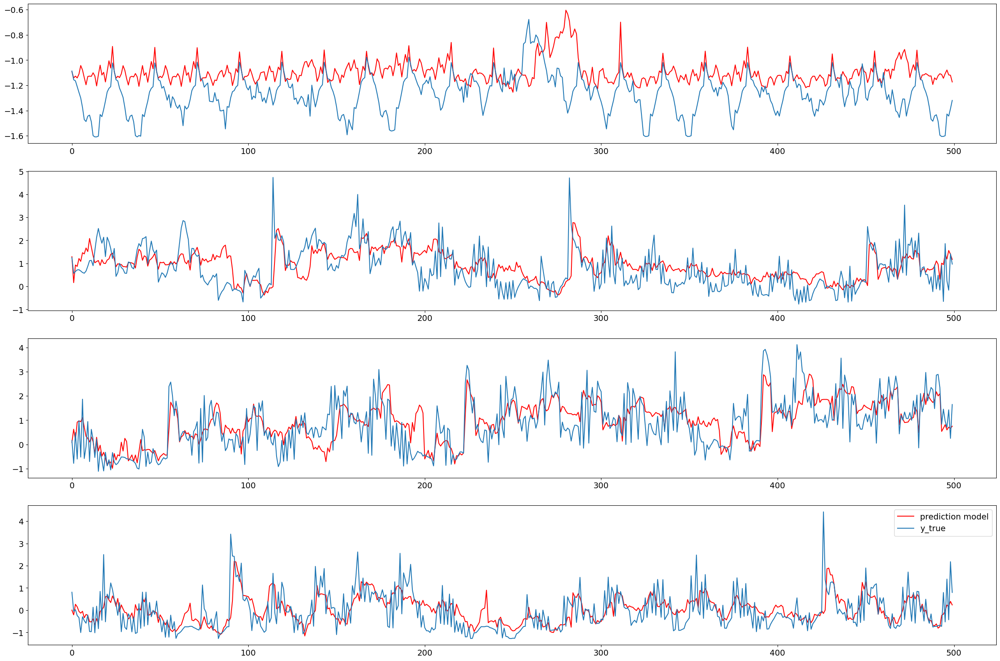

In [402]:
PLOT_RESULT_3D(y_pred,y_val)

### xgboost

In [403]:
import xgboost as xgb

reg_xgb = xgb.XGBRegressor(n_estimators=2000,early_stopping_rounds=50)

reg_xgb.fit(X_train,y_train,
        eval_set=[(X_val, y_val)],
        verbose=50)

# Make predictions on the testing data
y_pred = reg_xgb.predict(X_val)
y_pred=pd.DataFrame(y_pred)
y_pred.columns=TARGET
y_pred.index=y_val.index


PRINT_SCORE(y_val, y_pred)
RESULT=SCORE(model_name="XGB", y_pred=y_pred, y_val=y_val,RESULT=RESULT)
RESULT

[0]	validation_0-rmse:1.08461
[50]	validation_0-rmse:0.67954
[65]	validation_0-rmse:0.68089
RMSE :  0.66911083
MAPE :  4.503739
SMAPE :  36.264010895370475
DTW :  28.938601591712082
[[1.]]
[[1.3277577]]
[[1.]]
[[20.17092589]]
[[10.7493418]]


,model_name,RMSE,MAPE,SMAPE,DTW,RdR_score
0,SARIMAX_Randomwalk_baseline,0.996869,5.161215,43.094156,48.109527,1.000000
0,SARIMAX_Randomwalk_baseline,0.996869,5.161215,43.094156,48.109527,1.000000
0,best_score,0.000000,0.000000,0.000000,0.000000,25.553198
0,LinearRegression,0.677248,2.884223,35.439724,31.337030,9.546059
0,Knn_1,0.634031,4.115064,37.031763,30.890154,9.791106
0,Best_Knn,0.631405,4.459558,36.897767,30.734057,9.870467
0,MLP,0.638252,3.900928,34.859799,30.102252,10.182946
0,XGB,0.669111,4.503739,36.264011,28.938602,10.749342


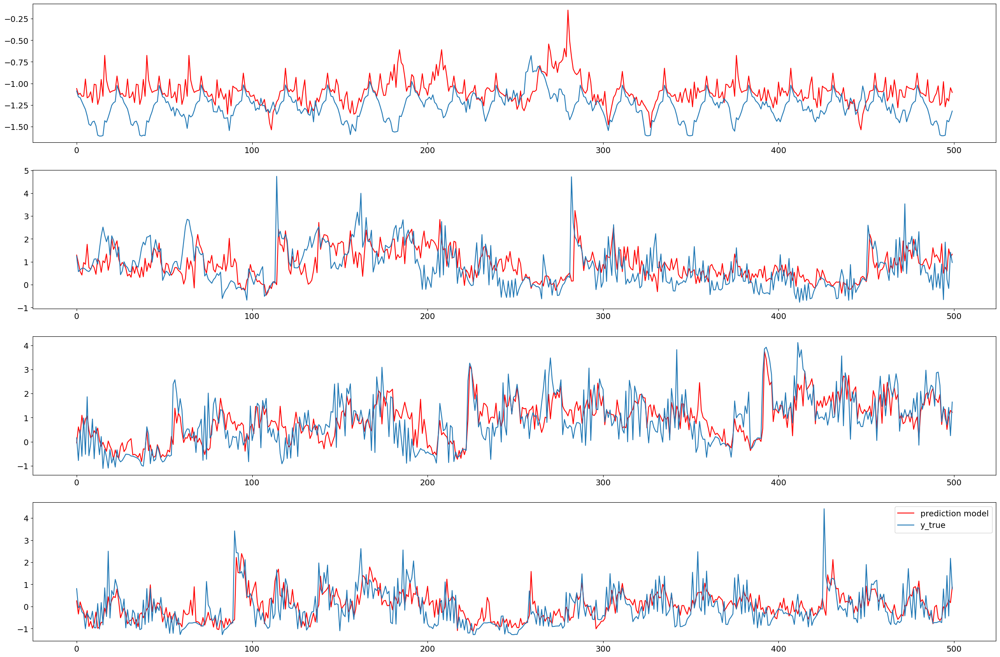

In [405]:
PLOT_RESULT_3D(y_pred,y_val)

In [406]:
# # Create the XGBoost regressor
# reg_xgb = xgb.XGBRegressor()

# # Create the XGBoost regressor parameters
# params = {
#     'n_estimators': [75,100,200],
#     'learning_rate': [0.01,0.05, 0.1]
# }

# # Create the grid search object
# gs = GridSearchCV(reg_xgb, params,n_jobs=-1 ,cv=5,verbose=1)

# # Fit the grid search object to the training data
# gs.fit(X_train, y_train)

# # Get the best hyperparameters
# best_params = gs.best_params_

# # Get the best score
# best_score = gs.best_score_

# print(best_params,best_score)

# # n_estimators=1000,early_stopping_rounds=50,learning_rate=0.05

In [407]:
best_params={'learning_rate': 0.05, 'n_estimators': 100}

In [408]:
reg_xgb = xgb.XGBRegressor(**best_params)

reg_xgb.fit(X_train,y_train,
        eval_set=[(X_val, y_val)],
        verbose=50)

# Make predictions on the testing data
y_pred = reg_xgb.predict(X_val)
y_pred=pd.DataFrame(y_pred)
y_pred.columns=TARGET
y_pred.index=y_val.index


PRINT_SCORE(y_val, y_pred)
RESULT=SCORE(model_name="XGB", y_pred=y_pred, y_val=y_val,RESULT=RESULT)
RESULT

[0]	validation_0-rmse:1.28719
[50]	validation_0-rmse:0.67373
[99]	validation_0-rmse:0.65324
RMSE :  0.65324014
MAPE :  2.8264124
SMAPE :  36.08191840791258
DTW :  28.61389913967274
[[1.]]
[[1.3436284]]
[[1.]]
[[20.49562834]]
[[10.91962838]]


,model_name,RMSE,MAPE,SMAPE,DTW,RdR_score
0,SARIMAX_Randomwalk_baseline,0.996869,5.161215,43.094156,48.109527,1.000000
0,SARIMAX_Randomwalk_baseline,0.996869,5.161215,43.094156,48.109527,1.000000
0,best_score,0.000000,0.000000,0.000000,0.000000,25.553198
0,LinearRegression,0.677248,2.884223,35.439724,31.337030,9.546059
0,Knn_1,0.634031,4.115064,37.031763,30.890154,9.791106
0,Best_Knn,0.631405,4.459558,36.897767,30.734057,9.870467
0,MLP,0.638252,3.900928,34.859799,30.102252,10.182946
0,XGB,0.669111,4.503739,36.264011,28.938602,10.749342
0,XGB,0.653240,2.826412,36.081918,28.613899,10.919628


In [587]:
# reg_xgb.feature_importances_

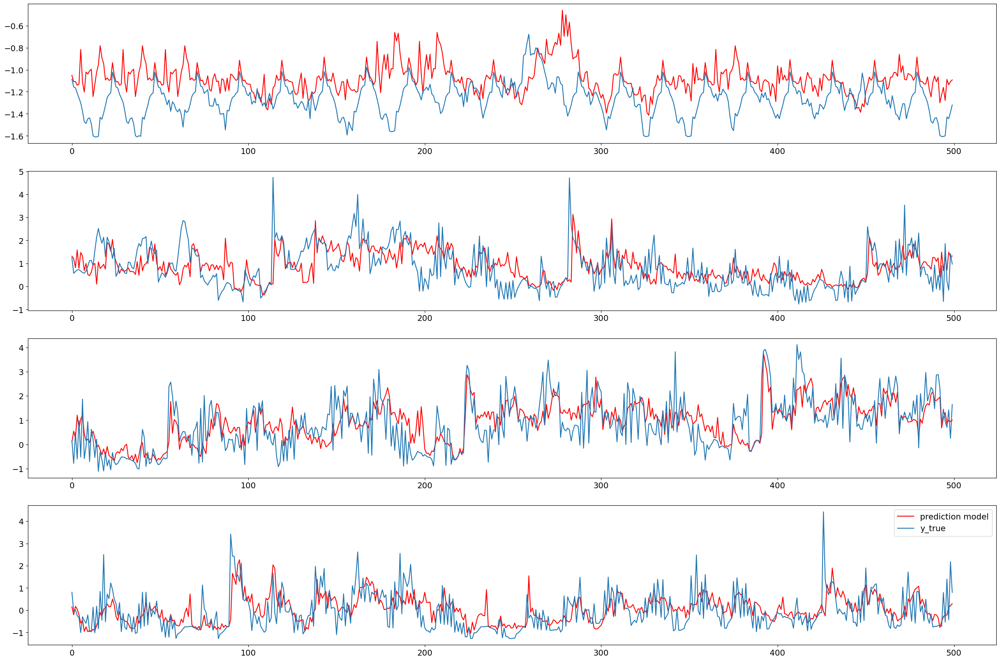

In [409]:
PLOT_RESULT_3D(y_pred,y_val)

In [410]:
s1=y_pred.iloc[40]
s2=y_val.iloc[40]
path = dtw.warping_path(s1, s2)
dtwvis.plot_warping(s1, s2, path, filename="warp.png")

(None, None)

(<Figure size 1300x600 with 2 Axes>,
 array([<AxesSubplot:>, <AxesSubplot:>], dtype=object))

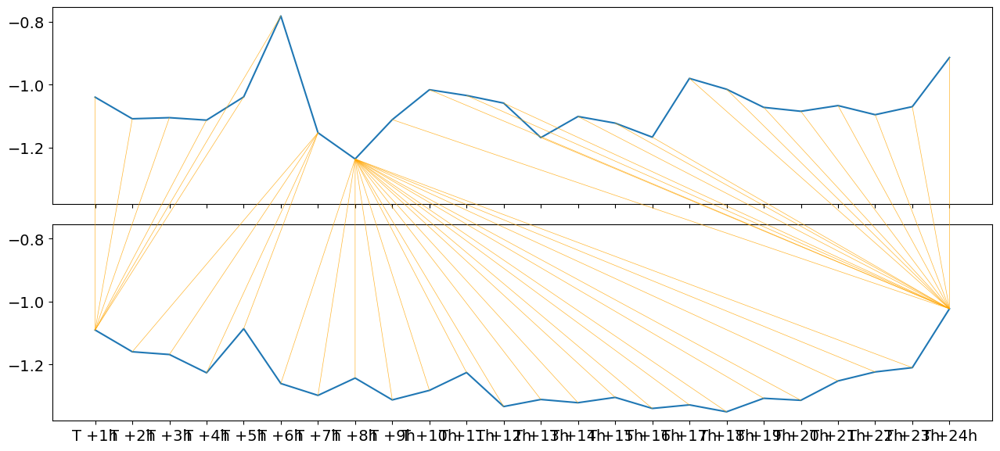

In [411]:
dtwvis.plot_warping(s1, s2,path)

# Resulting benchmark

In [412]:
RESULT

,model_name,RMSE,MAPE,SMAPE,DTW,RdR_score
0,SARIMAX_Randomwalk_baseline,0.996869,5.161215,43.094156,48.109527,1.000000
0,SARIMAX_Randomwalk_baseline,0.996869,5.161215,43.094156,48.109527,1.000000
0,best_score,0.000000,0.000000,0.000000,0.000000,25.553198
0,LinearRegression,0.677248,2.884223,35.439724,31.337030,9.546059
0,Knn_1,0.634031,4.115064,37.031763,30.890154,9.791106
0,Best_Knn,0.631405,4.459558,36.897767,30.734057,9.870467
0,MLP,0.638252,3.900928,34.859799,30.102252,10.182946
0,XGB,0.669111,4.503739,36.264011,28.938602,10.749342
0,XGB,0.653240,2.826412,36.081918,28.613899,10.919628


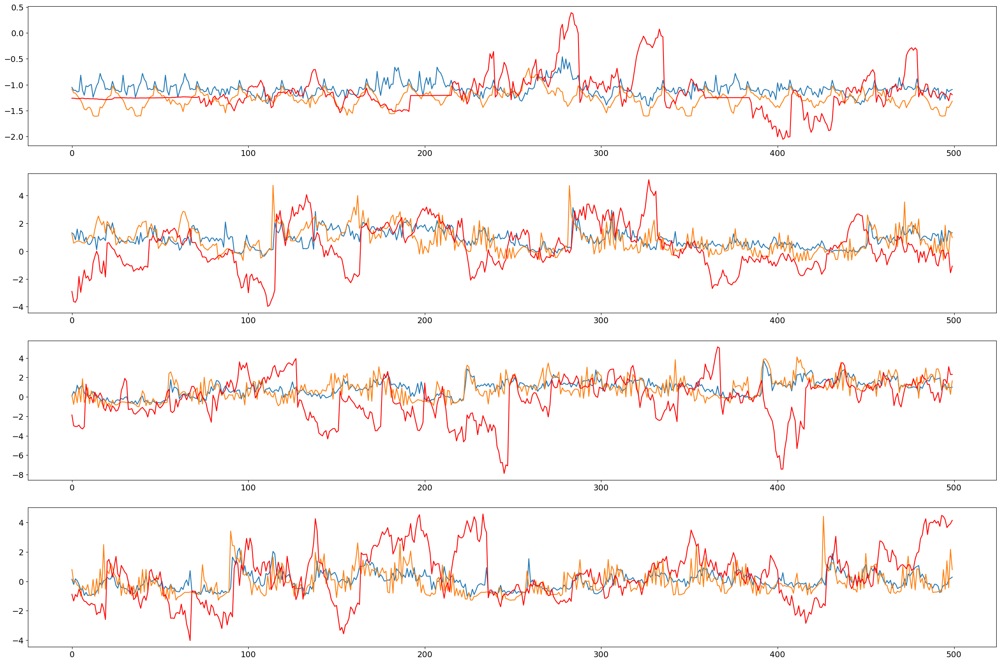

In [410]:
fig, axes = plt.subplots(nrows=4,ncols=1,figsize=(30,20))

axes[0].plot(y_pred.values.ravel()[:500])
axes[0].plot(y_val.values.ravel()[:500])
axes[0].plot(RandomWalkPred.values[:500],'r')

axes[1].plot(y_pred.values.ravel()[3100:3600])
axes[1].plot(y_val.values.ravel()[3100:3600])
axes[1].plot(RandomWalkPred.values[3100:3600],'r')


axes[2].plot(y_pred.values.ravel()[4000:4500])
axes[2].plot(y_val.values.ravel()[4000:4500])
axes[2].plot(RandomWalkPred.values[4000:4500],'r')


axes[3].plot(y_pred.values.ravel()[-500:])
axes[3].plot(y_val.values.ravel()[-500:])
axes[3].plot(RandomWalkPred.values[-500:],'r')


plt.show()

# Deep learning models

In [411]:
print(X_train.shape)
print(y_train.shape)
print(X_val.shape)
print(y_val.shape)

(1415, 24)
(1415, 24)
(354, 24)
(354, 24)


#### reshape the data
For your training data, you'll need to reshape X_train to have the shape **(samples, n_steps, n_features)** and y_train to have the shape **(samples, n_steps, n_targets)**

In [412]:
n_steps = 1
n_features=X_train.shape[1]  # here 24
n_targets=y_train.shape[1]   # here 24


X_train_2 = np.array(X_train).reshape(X_train.shape[0], n_steps, X_train.shape[1])
y_train_2 = np.array(y_train).reshape(y_train.shape[0], n_steps, y_train.shape[1])

X_val_2 = np.array(X_val).reshape(X_val.shape[0], n_steps, X_val.shape[1])
y_val_2 = np.array(y_val).reshape(y_val.shape[0], n_steps, y_val.shape[1])

print(X_train_2.shape)
print(y_train_2.shape)
print(X_val_2.shape)
print(y_val_2.shape)

(1415, 1, 24)
(1415, 1, 24)
(354, 1, 24)
(354, 1, 24)


## Vanilla LSTM

A Vanilla LSTM is an LSTM model that has a single hidden layer of LSTM units, and an output layer used to make a prediction.

In [413]:
from keras.models import Sequential
from keras.layers import LSTM, Dense
# define model
model = Sequential()
model.add(LSTM(50, activation='relu', input_shape=(n_steps, n_features)))
model.add(Dense(n_targets))
model.compile(optimizer='adam', loss='mse')

# fit model
model.fit(X_train_2, y_train_2, epochs=100, batch_size=64, validation_data=(X_val_2, y_val_2) ,verbose=1)

Epoch 1/100
23/23 [==============================] - 5s 37ms/step - loss: 1.0042 - val_loss: 1.4567
Epoch 2/100
23/23 [==============================] - 0s 9ms/step - loss: 1.0012 - val_loss: 1.4561
Epoch 3/100
23/23 [==============================] - 0s 10ms/step - loss: 1.0008 - val_loss: 1.4596
Epoch 4/100
23/23 [==============================] - 0s 10ms/step - loss: 1.0006 - val_loss: 1.4503
Epoch 5/100
23/23 [==============================] - 0s 11ms/step - loss: 1.0007 - val_loss: 1.4338
Epoch 6/100
23/23 [==============================] - 0s 11ms/step - loss: 1.0004 - val_loss: 1.4468
Epoch 7/100
23/23 [==============================] - 0s 15ms/step - loss: 1.0006 - val_loss: 1.4532
Epoch 8/100
23/23 [==============================] - 0s 10ms/step - loss: 1.0005 - val_loss: 1.4464
Epoch 9/100
23/23 [==============================] - 0s 13ms/step - loss: 1.0004 - val_loss: 1.4474
Epoch 10/100
23/23 [==============================] - 0s 13ms/step - loss: 1.0006 - val_loss: 1.4509


In [414]:
y_pred = model.predict(X_val_2)


12/12 [==============================] - 0s 3ms/step


In [415]:
# print(y_pred.shape)
# print(y_val_2.shape)
# RESULT

In [416]:
PRINT_SCORE_3D(y_val_2, y_pred)

RESULT=SCORE(model_name="Vanilla LSTM", y_pred=y_pred, y_val=y_val_2,RESULT=RESULT,walk=SARIMAX_RandomWalk['Y_PRED'])

RESULT

RMSE :  1.1994559
MAPE :  281.11453
SMAPE :  96.30369380137948
DTW :  108.46031587298222
[[1.]]
[[0.79741275]]
[[1.]]
[[-49.05924568]]
[[-24.13091646]]


,model_name,RMSE,MAPE,SMAPE,DTW,RdR_score
0,SARIMAX_Randomwalk_baseline,0.996869,5.161215,43.094156,58.401070,1.000000
0,best_score,0.000000,0.000000,0.000000,0.000000,30.698969
0,LinearRegression,0.677248,2.884223,35.439724,39.060157,10.830267
0,Knn_1,0.634031,4.115064,37.031763,40.187168,10.288370
0,Best_Knn,0.631405,4.459558,36.897767,39.968075,10.399229
0,MLP,0.638252,3.900928,34.859799,38.061255,11.349216
0,XGB,0.669111,4.503739,36.264011,36.030773,12.349027
0,XGB,0.653240,2.826412,36.081918,36.242292,12.251204
0,Vanilla LSTM,1.199456,281.114532,96.303694,108.460316,-24.130916


## Stacked LSTM

Multiple hidden LSTM layers can be stacked one on top of another in what is referred to as a Stacked LSTM model.

An LSTM layer requires a three-dimensional input and LSTMs by default will produce a two-dimensional output as an interpretation from the end of the sequence.

We can address this by having the LSTM output a value for each time step in the input data by setting the return_sequences=True argument on the layer. This allows us to have 3D output from hidden LSTM layer as input to the next.

In [417]:
# define model
model = Sequential()
model.add(LSTM(50, activation='relu', return_sequences=True, input_shape=(n_steps, n_features)))
model.add(LSTM(50, activation='relu'))
model.add(Dense(n_targets))
model.compile(optimizer='adam', loss='mse')

# fit model
model.fit(X_train_2, y_train_2, epochs=100, batch_size=64, validation_data=(X_val_2, y_val_2) ,verbose=0)
y_pred = model.predict(X_val_2)

PRINT_SCORE_3D(y_val_2, y_pred)

RESULT=SCORE(model_name="Stacked 2 LSTM", y_pred=y_pred, y_val=y_val_2,RESULT=RESULT,walk=SARIMAX_RandomWalk['Y_PRED'])

RESULT

12/12 [==============================] - 1s 4ms/step
RMSE :  1.196268
MAPE :  452.866
SMAPE :  96.3448243134562
DTW :  108.4992673428871
[[1.]]
[[0.80060065]]
[[1.]]
[[-49.09819715]]
[[-24.14879825]]


,model_name,RMSE,MAPE,SMAPE,DTW,RdR_score
0,SARIMAX_Randomwalk_baseline,0.996869,5.161215,43.094156,58.401070,1.000000
0,best_score,0.000000,0.000000,0.000000,0.000000,30.698969
0,LinearRegression,0.677248,2.884223,35.439724,39.060157,10.830267
0,Knn_1,0.634031,4.115064,37.031763,40.187168,10.288370
0,Best_Knn,0.631405,4.459558,36.897767,39.968075,10.399229
0,MLP,0.638252,3.900928,34.859799,38.061255,11.349216
0,XGB,0.669111,4.503739,36.264011,36.030773,12.349027
0,XGB,0.653240,2.826412,36.081918,36.242292,12.251204
0,Vanilla LSTM,1.199456,281.114532,96.303694,108.460316,-24.130916
0,Stacked 2 LSTM,1.196268,452.865997,96.344824,108.499267,-24.148798


In [418]:
# import tensorflow as tf
# from hyperopt import fmin, tpe, hp

# def objective(params):
#     # Build the model using the hyperparameters from the search space
#     model = tf.keras.Sequential()
#     model.add(LSTM(int(params['lstm_units_1']), activation='relu', return_sequences=True, input_shape=(n_steps, n_features)))
#     model.add(LSTM(int(params['lstm_units_2']), activation='relu'))
#     model.add(tf.keras.layers.Dense(n_targets))

#     # Compile the model
#     model.compile(loss='mse', optimizer='adam')

#     # Train the model and get the validation loss
#     history = model.fit(X_val_2, y_val_2, epochs=int(params['epochs']), batch_size=int(params['batch_size']), validation_data=(X_val_2, y_val_2), verbose=0)
#     val_loss = history.history['val_loss'][-1]
    
#     return val_loss

# # Define the hyperparameter search space
# space = {
#     'lstm_units_1': hp.quniform('lstm_units_1', 64, 256, 16),
#     'lstm_units_2': hp.quniform('lstm_units_2', 64, 256, 16),
#     'batch_size': hp.quniform('batch_size', 32, 256, 32),
#     'epochs': hp.quniform('epochs', 10, 30, 10)
# }

# # Perform the hyperparameter tuning using the Tree-structured Parzen Estimator (TPE) algorithm
# best = fmin(fn=objective, space=space, algo=tpe.suggest, max_evals=50, verbose=1)
# print("Best hyperparameters:", best)


## Bidirectional LSTM

On some sequence prediction problems, it can be beneficial to allow the LSTM model to learn the input sequence both forward and backwards and concatenate both interpretations.

This is called a Bidirectional LSTM.

We can implement a Bidirectional LSTM for univariate time series forecasting by wrapping the first hidden layer in a wrapper layer called Bidirectional.
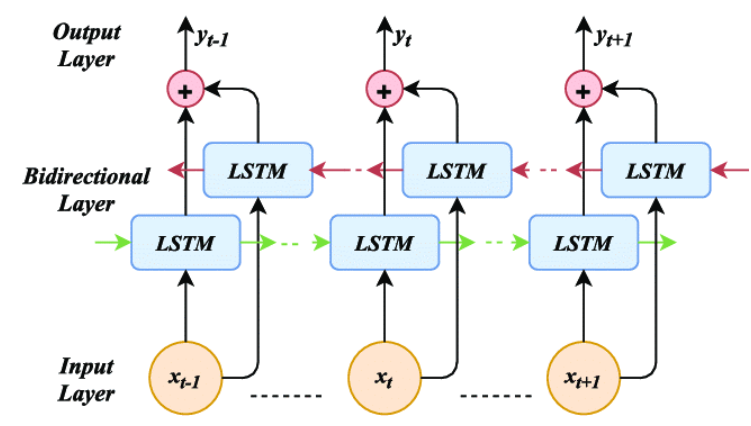

In [419]:
from keras.layers import Bidirectional
# define model
model = Sequential()
model.add(Bidirectional(LSTM(50, activation='relu'), input_shape=(n_steps, n_features)))
model.add(Dense(n_targets))
model.compile(optimizer='adam', loss='mse')

# fit model
model.fit(X_train_2, y_train_2, epochs=100, batch_size=64, validation_data=(X_val_2, y_val_2) ,verbose=0)
y_pred = model.predict(X_val_2)

PRINT_SCORE_3D(y_val_2, y_pred)

RESULT=SCORE(model_name="Bidirectional LSTM", y_pred=y_pred, y_val=y_val_2,RESULT=RESULT,walk=SARIMAX_RandomWalk['Y_PRED'])
RESULT

12/12 [==============================] - 1s 3ms/step
RMSE :  1.1985499
MAPE :  293.02502
SMAPE :  95.9330058356277
DTW :  108.16736861222176
[[1.]]
[[0.79831874]]
[[1.]]
[[-48.76629842]]
[[-23.98398984]]


,model_name,RMSE,MAPE,SMAPE,DTW,RdR_score
0,SARIMAX_Randomwalk_baseline,0.996869,5.161215,43.094156,58.401070,1.000000
0,best_score,0.000000,0.000000,0.000000,0.000000,30.698969
0,LinearRegression,0.677248,2.884223,35.439724,39.060157,10.830267
0,Knn_1,0.634031,4.115064,37.031763,40.187168,10.288370
0,Best_Knn,0.631405,4.459558,36.897767,39.968075,10.399229
0,MLP,0.638252,3.900928,34.859799,38.061255,11.349216
0,XGB,0.669111,4.503739,36.264011,36.030773,12.349027
0,XGB,0.653240,2.826412,36.081918,36.242292,12.251204
0,Vanilla LSTM,1.199456,281.114532,96.303694,108.460316,-24.130916
0,Stacked 2 LSTM,1.196268,452.865997,96.344824,108.499267,-24.148798


In [566]:
model = Sequential()
model.add(Bidirectional(LSTM(units=n_features,return_sequences=False,kernel_initializer = 'glorot_uniform',activation = 'tanh')))
model.add(Dense(50, activation = 'tanh'))
model.add(Dense(50, activation = 'tanh'))
model.add(Dense(n_targets, activation = 'linear'))

model.compile(optimizer='adam', loss='mse')

# fit model
history=model.fit(X_train_2, y_train_2, epochs=100, batch_size=64, validation_data=(X_val_2, y_val_2) ,verbose=0)
y_pred = model.predict(X_val_2)

PRINT_SCORE_3D(y_val_2, y_pred)

RESULT=SCORE(model_name="Bidirectional LSTM 2", y_pred=y_pred, y_val=y_val_2,RESULT=RESULT,walk=SARIMAX_RandomWalk['Y_PRED'])
RESULT

12/12 [==============================] - 1s 3ms/step
RMSE :  1.2001349
MAPE :  446.27554
SMAPE :  96.83248078274731
DTW :  108.99381536655802
[[1.]]
[[0.79673374]]
[[1.]]
[[-49.59274517]]
[[-24.39800572]]


,model_name,RMSE,MAPE,SMAPE,DTW,RdR_score
0,SARIMAX_Randomwalk_baseline,0.996869,5.161215,43.094156,58.401070,1.000000
0,best_score,0.000000,0.000000,0.000000,0.000000,30.698969
0,LinearRegression,0.677248,2.884223,35.439724,39.060157,10.830267
0,Knn_1,0.634031,4.115064,37.031763,40.187168,10.288370
0,Best_Knn,0.631405,4.459558,36.897767,39.968075,10.399229
0,MLP,0.638252,3.900928,34.859799,38.061255,11.349216
0,XGB,0.669111,4.503739,36.264011,36.030773,12.349027
0,XGB,0.653240,2.826412,36.081918,36.242292,12.251204
0,Vanilla LSTM,1.199456,281.114532,96.303694,108.460316,-24.130916
0,Stacked 2 LSTM,1.196268,452.865997,96.344824,108.499267,-24.148798


max epoch : 99


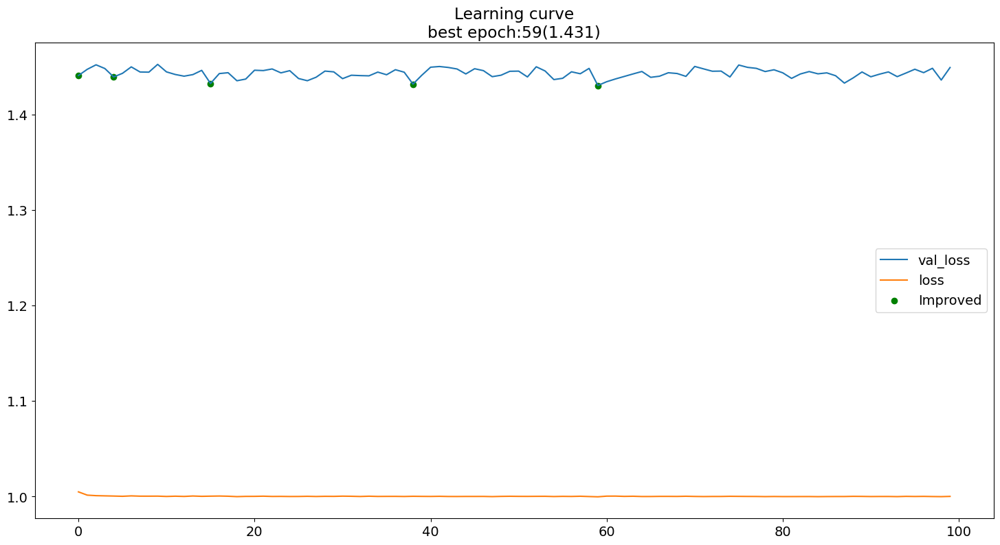

In [567]:
monitor_label = 'val_loss'

plot_learning_curve(history)
max_epoch = np.max(history.epoch)
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
best_epoch = hist[hist[monitor_label] == np.min(hist[monitor_label])]['epoch'].values[0]
print('max epoch :', max_epoch)

## CNN LSTM

In [422]:
from keras.layers import Conv1D

# define model
model = Sequential()
model.add(Conv1D(filters=64, kernel_size=1, activation='relu', input_shape=(n_steps, n_features)))
# model.add(tf.keras.layers.MaxPooling1D(pool_size=2))
model.add(LSTM(50, activation='relu'))
model.add(Dense(n_targets))
model.compile(optimizer='adam', loss='mse')

# fit model
model.fit(X_train_2, y_train_2, epochs=100, batch_size=64, validation_data=(X_val_2, y_val_2) ,verbose=0)
y_pred = model.predict(X_val_2)

PRINT_SCORE_3D(y_val_2, y_pred)

RESULT=SCORE(model_name="CNN LSTM", y_pred=y_pred, y_val=y_val_2,RESULT=RESULT,walk=SARIMAX_RandomWalk['Y_PRED'])
RESULT

12/12 [==============================] - 0s 3ms/step
RMSE :  1.1994303
MAPE :  340.82388
SMAPE :  96.61122632615019
DTW :  108.6260896156493
[[1.]]
[[0.79743826]]
[[1.]]
[[-49.22501942]]
[[-24.21379058]]


,model_name,RMSE,MAPE,SMAPE,DTW,RdR_score
0,SARIMAX_Randomwalk_baseline,0.996869,5.161215,43.094156,58.401070,1.000000
0,best_score,0.000000,0.000000,0.000000,0.000000,30.698969
0,LinearRegression,0.677248,2.884223,35.439724,39.060157,10.830267
0,Knn_1,0.634031,4.115064,37.031763,40.187168,10.288370
0,Best_Knn,0.631405,4.459558,36.897767,39.968075,10.399229
0,MLP,0.638252,3.900928,34.859799,38.061255,11.349216
0,XGB,0.669111,4.503739,36.264011,36.030773,12.349027
0,XGB,0.653240,2.826412,36.081918,36.242292,12.251204
0,Vanilla LSTM,1.199456,281.114532,96.303694,108.460316,-24.130916
0,Stacked 2 LSTM,1.196268,452.865997,96.344824,108.499267,-24.148798


In [423]:
# define model
model = Sequential()
model.add(Conv1D(filters=64, kernel_size=1, activation='relu', input_shape=(n_steps, n_features)))
model.add(tf.keras.layers.MaxPooling1D(pool_size=1))
model.add(LSTM(50, activation='relu'))
model.add(Dense(n_targets))
model.compile(optimizer='adam', loss='mse')

# fit model
model.fit(X_train_2, y_train_2, epochs=100, batch_size=64, validation_data=(X_val_2, y_val_2) ,verbose=0)
y_pred = model.predict(X_val_2)

PRINT_SCORE_3D(y_val_2, y_pred)

RESULT=SCORE(model_name="CNN LSTM 2", y_pred=y_pred, y_val=y_val_2,RESULT=RESULT,walk=SARIMAX_RandomWalk['Y_PRED'])
RESULT

12/12 [==============================] - 0s 3ms/step
RMSE :  1.1983495
MAPE :  457.59552
SMAPE :  96.3274005588349
DTW :  108.72153271675012
[[1.]]
[[0.79851913]]
[[1.]]
[[-49.32046252]]
[[-24.26097169]]


,model_name,RMSE,MAPE,SMAPE,DTW,RdR_score
0,SARIMAX_Randomwalk_baseline,0.996869,5.161215,43.094156,58.401070,1.000000
0,best_score,0.000000,0.000000,0.000000,0.000000,30.698969
0,LinearRegression,0.677248,2.884223,35.439724,39.060157,10.830267
0,Knn_1,0.634031,4.115064,37.031763,40.187168,10.288370
0,Best_Knn,0.631405,4.459558,36.897767,39.968075,10.399229
0,MLP,0.638252,3.900928,34.859799,38.061255,11.349216
0,XGB,0.669111,4.503739,36.264011,36.030773,12.349027
0,XGB,0.653240,2.826412,36.081918,36.242292,12.251204
0,Vanilla LSTM,1.199456,281.114532,96.303694,108.460316,-24.130916
0,Stacked 2 LSTM,1.196268,452.865997,96.344824,108.499267,-24.148798


In this code, we first import the tensorflow and keras libraries. We then define the input layer of the model, which has the shape (timesteps, input_dim), where timesteps is the number of time steps in each input sequence, and input_dim is the number of features in each time step.

Next, we define the CNN layer, which consists of a Conv1D layer with 32 filters and a kernel size of 3, followed by a MaxPooling1D layer with a pool size of 2. We then define the LSTM layer, which has 64 units.

After that, we define the output layer, which is a Dense layer with a single unit. Finally, we create a Model instance and compile it with the adam optimizer and the mean squared error (MSE) loss function. We then fit the model to the data using the fit() method.

In [424]:
# X_train.values

In [425]:
# # Reshape x_train to have 3 dimensions
X_train_3 = np.reshape(X_train.values, (X_train.shape[0], X_train.shape[1], 1))
y_train_3 = np.reshape(y_train.values, (y_train.shape[0], y_train.shape[1], 1))

X_val_3 = np.reshape(X_val.values, (X_val.shape[0], X_val.shape[1], 1))
y_val_3 = np.reshape(y_val.values, (y_val.shape[0], y_val.shape[1], 1))

print(X_train_3.shape)
print(y_train_3.shape)

print(X_val_3.shape)
print(y_val_3.shape)

(1415, 24, 1)
(1415, 24, 1)
(354, 24, 1)
(354, 24, 1)


In [426]:
# Define the model
model = tf.keras.Sequential()
model.add(tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(X_train_3.shape[1], X_train_3.shape[2])))
model.add(tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu'))
model.add(tf.keras.layers.Dropout(0.5))
model.add(tf.keras.layers.MaxPooling1D(pool_size=2))
model.add(tf.keras.layers.LSTM(100))

model.add(tf.keras.layers.Dense(n_targets))

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# fit model
history=model.fit(X_train_3, y_train_3, epochs=100, batch_size=64, validation_data=(X_val_3, y_val_3) ,verbose=0)

y_pred = model.predict(X_val_3)
PRINT_SCORE_3D(y_val_3, y_pred)

RESULT=SCORE(model_name="CNN LSTM 3", y_pred=y_pred, y_val=y_val_2,RESULT=RESULT,walk=SARIMAX_RandomWalk['Y_PRED'])
RESULT

12/12 [==============================] - 1s 6ms/step
RMSE :  0.6850687
MAPE :  2.8901618
SMAPE :  37.09967693879175
DTW :  38.4640812597328
[[1.]]
[[1.3117999]]
[[1.]]
[[20.93698893]]
[[11.12439441]]


,model_name,RMSE,MAPE,SMAPE,DTW,RdR_score
0,SARIMAX_Randomwalk_baseline,0.996869,5.161215,43.094156,58.401070,1.000000
0,best_score,0.000000,0.000000,0.000000,0.000000,30.698969
0,LinearRegression,0.677248,2.884223,35.439724,39.060157,10.830267
0,Knn_1,0.634031,4.115064,37.031763,40.187168,10.288370
0,Best_Knn,0.631405,4.459558,36.897767,39.968075,10.399229
0,MLP,0.638252,3.900928,34.859799,38.061255,11.349216
0,XGB,0.669111,4.503739,36.264011,36.030773,12.349027
0,XGB,0.653240,2.826412,36.081918,36.242292,12.251204
0,Vanilla LSTM,1.199456,281.114532,96.303694,108.460316,-24.130916
0,Stacked 2 LSTM,1.196268,452.865997,96.344824,108.499267,-24.148798


max epoch : 99


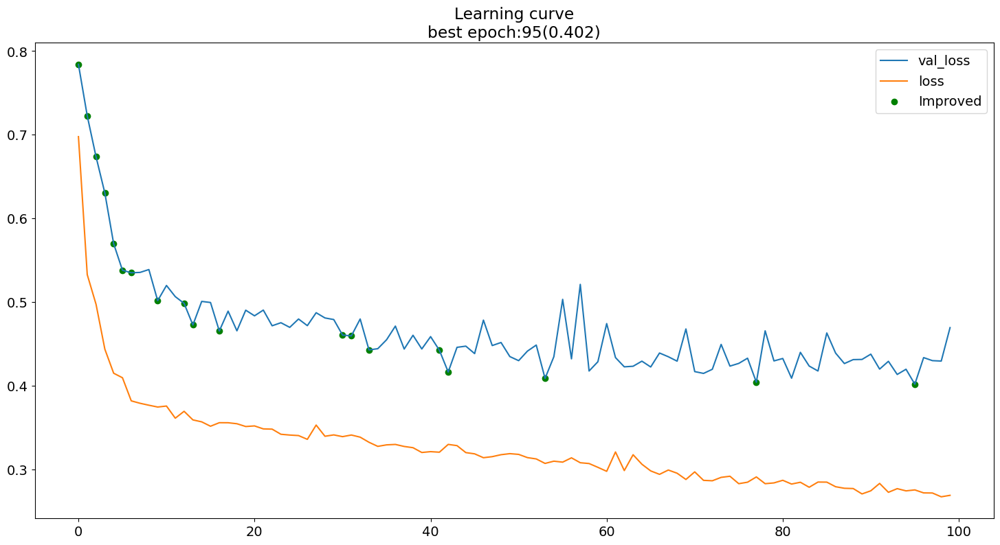

In [427]:
monitor_label = 'val_loss'

plot_learning_curve(history)
max_epoch = np.max(history.epoch)
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
best_epoch = hist[hist[monitor_label] == np.min(hist[monitor_label])]['epoch'].values[0]
print('max epoch :', max_epoch)

**hyperoptimisation**

In [428]:
# !pip install hyperopt

In [429]:
# import tensorflow as tf
# from hyperopt import fmin, tpe, hp

# def objective(params):
#     # Build the model using the hyperparameters from the search space
#     model = tf.keras.Sequential()
#     model.add(tf.keras.layers.Conv1D(filters=int(params['filters_1']), 
#                                      kernel_size=int(params['kernel_size_1']), 
#                                      activation='relu', 
#                                      input_shape=(X_train_3.shape[1], X_train_3.shape[2])))
#     model.add(tf.keras.layers.Conv1D(filters=int(params['filters_2']), 
#                                      kernel_size=int(params['kernel_size_2']), 
#                                      activation='relu'))
#     model.add(tf.keras.layers.Dropout(params['dropout_rate']))
#     model.add(tf.keras.layers.MaxPooling1D(pool_size=2))
#     model.add(tf.keras.layers.LSTM(int(params['lstm_units'])))
#     model.add(tf.keras.layers.Dense(n_targets))

#     # Compile the model
#     model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['mean_squared_error'])

#     # Train the model and get the validation loss
#     history = model.fit(X_train_3, y_train_3, epochs=int(params['epochs']), batch_size=int(params['batch_size']), validation_data=(X_val_3, y_val_3), verbose=0)
#     val_loss = history.history['val_loss'][-1]
    
#     return val_loss

# # Define the hyperparameter search space
# space = {
#     'filters_1': hp.quniform('filters_1', 32, 128, 16),
#     'kernel_size_1': hp.quniform('kernel_size_1', 2, 5, 1),
#     'filters_2': hp.quniform('filters_2', 32, 128, 16),
#     'kernel_size_2': hp.quniform('kernel_size_2', 2, 5, 1),
#     'dropout_rate': hp.uniform('dropout_rate', 0.1, 0.5),
#     'lstm_units': hp.quniform('lstm_units', 64, 256, 16),
#     'batch_size': hp.quniform('batch_size', 32, 256, 32),
#     'epochs': hp.quniform('epochs', 10, 30, 10)
# }

# # Perform the hyperparameter tuning using the Tree-structured Parzen Estimator (TPE) algorithm
# best = fmin(fn=objective, space=space, algo=tpe.suggest, max_evals=50, verbose=1)
# print("Best hyperparameters:", best)


In [430]:
# Define the model
model = tf.keras.Sequential()
model.add(tf.keras.layers.Conv1D(filters=96, kernel_size=2, activation='relu', input_shape=(X_train_3.shape[1], X_train_3.shape[2])))
model.add(tf.keras.layers.Conv1D(filters=128, kernel_size=2, activation='relu'))
model.add(tf.keras.layers.Dropout(0.41453552453644843))
model.add(tf.keras.layers.MaxPooling1D(pool_size=2))
model.add(tf.keras.layers.LSTM(256))
model.add(tf.keras.layers.Dense(n_targets))

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# fit model
history=model.fit(X_train_3, y_train_3, epochs=30, batch_size=32, validation_data=(X_val_3, y_val_3) ,verbose=0)

y_pred = model.predict(X_val_3)
PRINT_SCORE_3D(y_val_3, y_pred)

RESULT=SCORE(model_name="CNN LSTM optimise", y_pred=y_pred, y_val=y_val_2,RESULT=RESULT,walk=SARIMAX_RandomWalk['Y_PRED'])
RESULT

12/12 [==============================] - 1s 19ms/step
RMSE :  0.65285563
MAPE :  3.14725
SMAPE :  37.094840491064474
DTW :  39.915165258155845
[[1.]]
[[1.344013]]
[[1.]]
[[19.48590494]]
[[10.41495896]]


,model_name,RMSE,MAPE,SMAPE,DTW,RdR_score
0,SARIMAX_Randomwalk_baseline,0.996869,5.161215,43.094156,58.401070,1.000000
0,best_score,0.000000,0.000000,0.000000,0.000000,30.698969
0,LinearRegression,0.677248,2.884223,35.439724,39.060157,10.830267
0,Knn_1,0.634031,4.115064,37.031763,40.187168,10.288370
0,Best_Knn,0.631405,4.459558,36.897767,39.968075,10.399229
0,MLP,0.638252,3.900928,34.859799,38.061255,11.349216
0,XGB,0.669111,4.503739,36.264011,36.030773,12.349027
0,XGB,0.653240,2.826412,36.081918,36.242292,12.251204
0,Vanilla LSTM,1.199456,281.114532,96.303694,108.460316,-24.130916
0,Stacked 2 LSTM,1.196268,452.865997,96.344824,108.499267,-24.148798


max epoch : 29


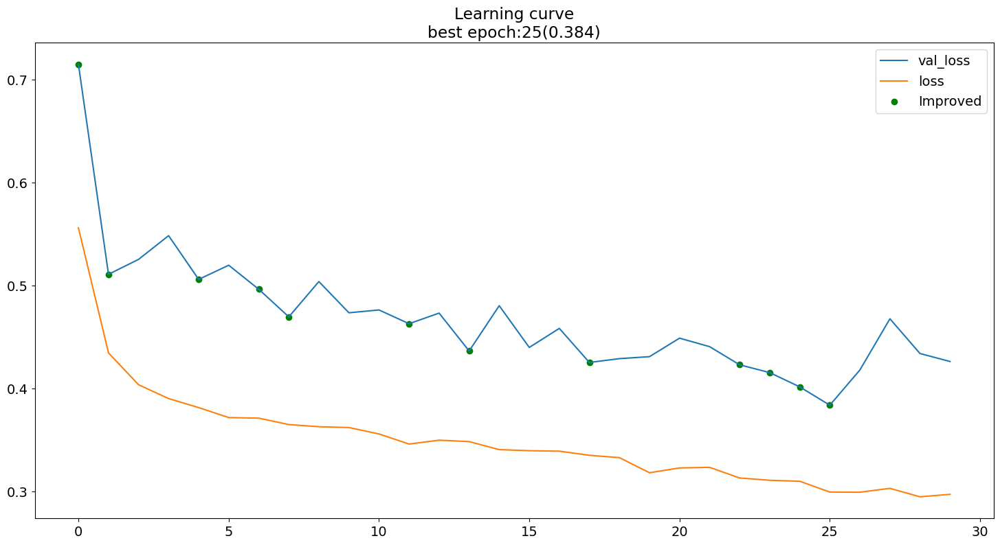

In [431]:
monitor_label = 'val_loss'

plot_learning_curve(history)
max_epoch = np.max(history.epoch)
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
best_epoch = hist[hist[monitor_label] == np.min(hist[monitor_label])]['epoch'].values[0]
print('max epoch :', max_epoch)

#  Seq2Seq
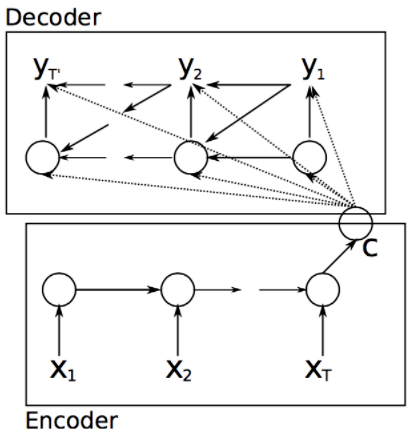

In [432]:
input_dim = n_features # 24
output_dim = n_targets # 24

model = Sequential()
# Encoder
model.add(LSTM(units=50, return_sequences=False, activation = 'tanh',input_shape=(n_steps, n_features)))
model.add(Dense(150, activation="relu") )
#Use "RepeatVector" to copy N copies of Encoder's output (last time step) as Decoder's N inputs
model.add(RepeatVector(output_dim))
# Decoder (second LSTM) 
model.add(LSTM(units=input_dim, activation = 'tanh', return_sequences=True) )
# TimeDistributed is to ensure consistency between Dense and Decoder
model.add(TimeDistributed(Dense(output_dim, activation="linear")) )

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')


# fit model
history=model.fit(X_train_2, y_train_2, epochs=100, batch_size=64, validation_data=(X_val_2, y_val_2) ,verbose=0)
y_pred = model.predict(X_val_2)



12/12 [==============================] - 2s 8ms/step


In [433]:
y_pred.shape

(354, 24, 24)

In [434]:
print(y_pred[:,0,:].shape)
print(y_pred[:,:,0].shape)

(354, 24)
(354, 24)


In [435]:
# y_pred_2=y_pred[:,:,0]          ### this one is not very good the other are ok
# PRINT_SCORE_3D(y_val_2, y_pred_2)

# y_pred_2=y_pred[:,0,:]
# PRINT_SCORE_3D(y_val_2, y_pred_2)

# y_pred_2=y_pred[:,1,:]
# PRINT_SCORE_3D(y_val_2, y_pred_2)

y_pred=y_pred[:,-1,:]         ### he may be the best...
PRINT_SCORE_3D(y_val_2, y_pred)

RESULT=SCORE(model_name="Seq2Seq", y_pred=y_pred, y_val=y_val_2,RESULT=RESULT,walk=SARIMAX_RandomWalk['Y_PRED'])
RESULT

RMSE :  0.6784815
MAPE :  3.5674472
SMAPE :  34.31410946030184
DTW :  37.15666219584963
[[1.]]
[[1.318387]]
[[1.]]
[[22.244408]]
[[11.78139751]]


,model_name,RMSE,MAPE,SMAPE,DTW,RdR_score
0,SARIMAX_Randomwalk_baseline,0.996869,5.161215,43.094156,58.401070,1.000000
0,best_score,0.000000,0.000000,0.000000,0.000000,30.698969
0,LinearRegression,0.677248,2.884223,35.439724,39.060157,10.830267
0,Knn_1,0.634031,4.115064,37.031763,40.187168,10.288370
0,Best_Knn,0.631405,4.459558,36.897767,39.968075,10.399229
0,MLP,0.638252,3.900928,34.859799,38.061255,11.349216
0,XGB,0.669111,4.503739,36.264011,36.030773,12.349027
0,XGB,0.653240,2.826412,36.081918,36.242292,12.251204
0,Vanilla LSTM,1.199456,281.114532,96.303694,108.460316,-24.130916
0,Stacked 2 LSTM,1.196268,452.865997,96.344824,108.499267,-24.148798


max epoch : 99


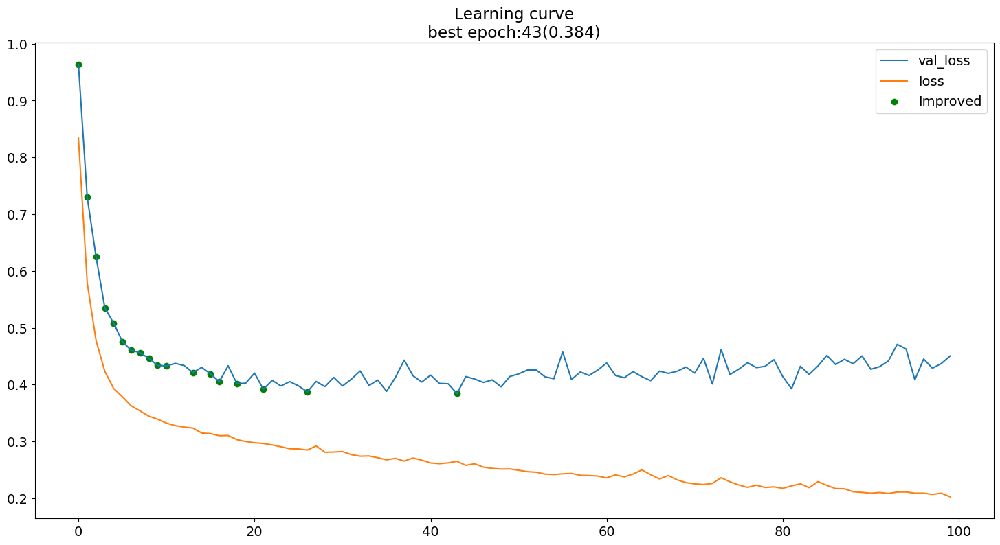

In [436]:
monitor_label = 'val_loss'

plot_learning_curve(history)
max_epoch = np.max(history.epoch)
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
best_epoch = hist[hist[monitor_label] == np.min(hist[monitor_label])]['epoch'].values[0]
print('max epoch :', max_epoch)

In [437]:
# input_dim = n_features # 24
# output_dim = n_targets # 24

# model = Sequential()
# # Encoder
# model.add(LSTM(units=50, return_sequences=False, activation = 'tanh',input_shape=(n_steps, n_features)))
# model.add(Dense(150, activation="relu") )
# #Use "RepeatVector" to copy N copies of Encoder's output (last time step) as Decoder's N inputs
# model.add(RepeatVector(output_dim))
# # Decoder (second LSTM) 
# model.add(LSTM(units=input_dim, activation = 'tanh', return_sequences=True) )
# # TimeDistributed is to ensure consistency between Dense and Decoder
# model.add(TimeDistributed(Dense(output_dim, activation="linear")) )

# # Compile the model
# model.compile(optimizer='adam', loss='mean_squared_error')


# # fit model
# history=model.fit(X_train_2, y_train_2, epochs=500, batch_size=64, validation_data=(X_val_2, y_val_2) ,verbose=1)
# y_pred = model.predict(X_val_2)

# y_pred=y_pred[:,-1,:]         ### he may be the best...
# PRINT_SCORE_3D(y_val_2, y_pred)

In [438]:
# monitor_label = 'val_loss'

# plot_learning_curve(history)
# max_epoch = np.max(history.epoch)
# hist = pd.DataFrame(history.history)
# hist['epoch'] = history.epoch
# best_epoch = hist[hist[monitor_label] == np.min(hist[monitor_label])]['epoch'].values[0]
# print('max epoch :', max_epoch)

## TCN-BiLSTM
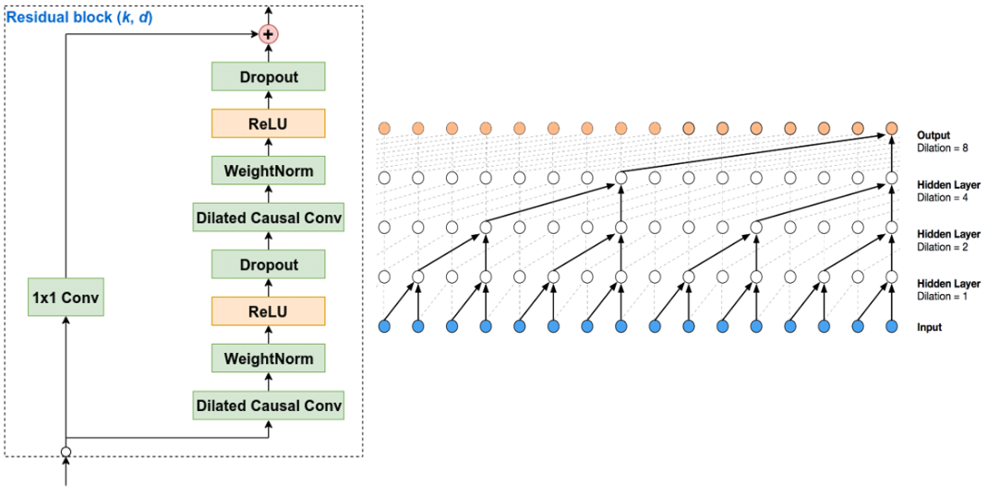

In [440]:
y_train_2.shape
y_train_3.shape

(1415, 24, 1)

In [591]:

i = Input(shape=(X_train_3.shape[1], X_train_3.shape[2]))
m = TCN(nb_filters=32,
                 kernel_size=16,
                 nb_stacks=4,
                 dilations=(2, 4, 8, 16, 32, 64),
                 padding='causal',
                 use_skip_connections=True,
                 dropout_rate=0.0,
                 activation='tanh',
                 kernel_initializer='glorot_uniform',
                 use_batch_norm=False,
                 use_layer_norm=False,
                 use_weight_norm=False,
        return_sequences = True)(i)
m = Bidirectional(LSTM(input_dim, return_sequences=False, activation = 'tanh'))(m)
#m = TimeDistributed(Dense(output_dim, activation = 'linear'))(m)
m = Dense(n_targets, activation='linear')(m)

model = Model(inputs=[i], outputs=[m])

model.summary()

opt = tf.keras.optimizers.Adam(learning_rate=0.0001)
model.compile(loss='mse', optimizer=opt)

# fit model
history=model.fit(X_train_3, y_train_3, epochs=40, batch_size=64, validation_data=(X_val_3, y_val_3) ,verbose=1)

y_pred = model.predict(X_val_3)
PRINT_SCORE_3D(y_val_3, y_pred)

RESULT=SCORE(model_name="TCN-BiLSTM", y_pred=y_pred, y_val=y_val_2,RESULT=RESULT,walk=SARIMAX_RandomWalk['Y_PRED'])
RESULT

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 24, 1)]           0         
                                                                 
 tcn_1 (TCN)                 (None, 24, 32)            772160    
                                                                 
 bidirectional_12 (Bidirecti  (None, 48)               10944     
 onal)                                                           
                                                                 
 dense_52 (Dense)            (None, 24)                1176      
                                                                 
Total params: 784,280
Trainable params: 784,280
Non-trainable params: 0
_________________________________________________________________
Epoch 1/40
23/23 [==============================] - 47s 945ms/step - loss: 0.8982 - val_loss: 1.2002
Epoch 2/40
23/23 [

,model_name,RMSE,MAPE,SMAPE,DTW,RdR_score
0,SARIMAX_Randomwalk_baseline,0.996869,5.161215e+00,43.094156,58.401070,1.000000
0,best_score,0.000000,0.000000e+00,0.000000,0.000000,30.698969
0,LinearRegression,0.677248,2.884223e+00,35.439724,39.060157,10.830267
0,Knn_1,0.634031,4.115064e+00,37.031763,40.187168,10.288370
0,Best_Knn,0.631405,4.459558e+00,36.897767,39.968075,10.399229
0,MLP,0.638252,3.900928e+00,34.859799,38.061255,11.349216
0,XGB,0.669111,4.503739e+00,36.264011,36.030773,12.349027
0,XGB,0.653240,2.826412e+00,36.081918,36.242292,12.251204
0,Vanilla LSTM,1.199456,2.811145e+02,96.303694,108.460316,-24.130916
0,Stacked 2 LSTM,1.196268,4.528660e+02,96.344824,108.499267,-24.148798


max epoch : 39


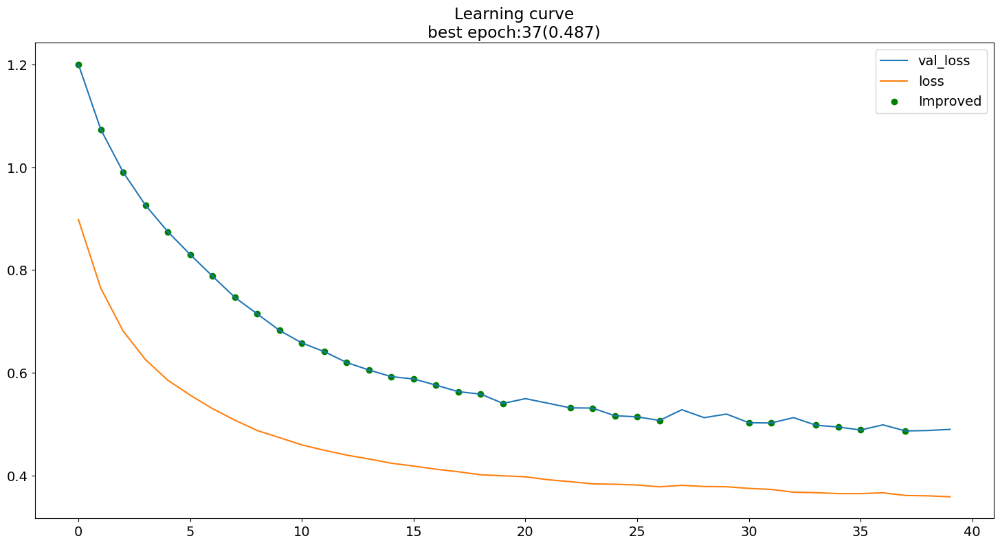

In [592]:
monitor_label = 'val_loss'

plot_learning_curve(history)
max_epoch = np.max(history.epoch)
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
best_epoch = hist[hist[monitor_label] == np.min(hist[monitor_label])]['epoch'].values[0]
print('max epoch :', max_epoch)

# Attention-BiLSTM
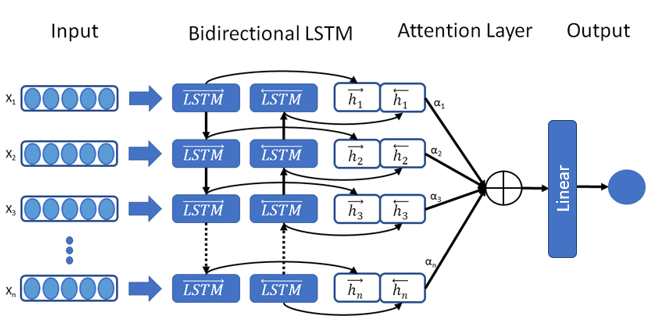

In [443]:
model = Sequential()
model.add(Bidirectional(LSTM(units=input_dim, 
                             return_sequences=True, 
                             kernel_initializer = 'uniform',
                             activation = 'tanh'
                             )))
model.add(SeqSelfAttention(attention_activation = 'linear'))
model.add(TimeDistributed(Dense(units=output_dim, activation = None)))

#opt = tf.keras.optimizers.Adam(learning_rate=0.0005, beta_1=0.9, beta_2=0.999, amsgrad=True)
opt = tf.keras.optimizers.Adam(learning_rate=0.0005)#, beta_1=0.9, beta_2=0.999, amsgrad=True)
model.compile(loss='mse', optimizer=opt)

# fit model
history=model.fit(X_train_2, y_train_2, epochs=100, batch_size=64, validation_data=(X_val_2, y_val_2) ,verbose=1)
y_pred = model.predict(X_val_2)

PRINT_SCORE_3D(y_val_2, y_pred)

RESULT=SCORE(model_name="Attention-BiLSTM", y_pred=y_pred, y_val=y_val_2,RESULT=RESULT,walk=SARIMAX_RandomWalk['Y_PRED'])
RESULT

Epoch 1/100
23/23 [==============================] - 9s 65ms/step - loss: 0.9308 - val_loss: 1.2746
Epoch 2/100
23/23 [==============================] - 0s 8ms/step - loss: 0.7960 - val_loss: 1.1175
Epoch 3/100
23/23 [==============================] - 0s 9ms/step - loss: 0.6667 - val_loss: 0.9972
Epoch 4/100
23/23 [==============================] - 0s 8ms/step - loss: 0.5859 - val_loss: 0.8886
Epoch 5/100
23/23 [==============================] - 0s 9ms/step - loss: 0.5331 - val_loss: 0.7893
Epoch 6/100
23/23 [==============================] - 0s 8ms/step - loss: 0.5017 - val_loss: 0.7317
Epoch 7/100
23/23 [==============================] - 0s 9ms/step - loss: 0.4814 - val_loss: 0.7026
Epoch 8/100
23/23 [==============================] - 0s 8ms/step - loss: 0.4649 - val_loss: 0.6687
Epoch 9/100
23/23 [==============================] - 0s 8ms/step - loss: 0.4516 - val_loss: 0.6482
Epoch 10/100
23/23 [==============================] - 0s 8ms/step - loss: 0.4394 - val_loss: 0.6244
Epoch 11

Epoch 83/100
23/23 [==============================] - 0s 9ms/step - loss: 0.3055 - val_loss: 0.4128
Epoch 84/100
23/23 [==============================] - 0s 9ms/step - loss: 0.3050 - val_loss: 0.4088
Epoch 85/100
23/23 [==============================] - 0s 9ms/step - loss: 0.3052 - val_loss: 0.4056
Epoch 86/100
23/23 [==============================] - 0s 9ms/step - loss: 0.3042 - val_loss: 0.4109
Epoch 87/100
23/23 [==============================] - 0s 8ms/step - loss: 0.3038 - val_loss: 0.4061
Epoch 88/100
23/23 [==============================] - 0s 8ms/step - loss: 0.3040 - val_loss: 0.4049
Epoch 89/100
23/23 [==============================] - 0s 10ms/step - loss: 0.3030 - val_loss: 0.4091
Epoch 90/100
23/23 [==============================] - 0s 11ms/step - loss: 0.3027 - val_loss: 0.4115
Epoch 91/100
23/23 [==============================] - 0s 9ms/step - loss: 0.3024 - val_loss: 0.4054
Epoch 92/100
23/23 [==============================] - 0s 11ms/step - loss: 0.3030 - val_loss: 0.41

,model_name,RMSE,MAPE,SMAPE,DTW,RdR_score
0,SARIMAX_Randomwalk_baseline,0.996869,5.161215,43.094156,58.401070,1.000000
0,best_score,0.000000,0.000000,0.000000,0.000000,30.698969
0,LinearRegression,0.677248,2.884223,35.439724,39.060157,10.830267
0,Knn_1,0.634031,4.115064,37.031763,40.187168,10.288370
0,Best_Knn,0.631405,4.459558,36.897767,39.968075,10.399229
0,MLP,0.638252,3.900928,34.859799,38.061255,11.349216
0,XGB,0.669111,4.503739,36.264011,36.030773,12.349027
0,XGB,0.653240,2.826412,36.081918,36.242292,12.251204
0,Vanilla LSTM,1.199456,281.114532,96.303694,108.460316,-24.130916
0,Stacked 2 LSTM,1.196268,452.865997,96.344824,108.499267,-24.148798


max epoch : 99


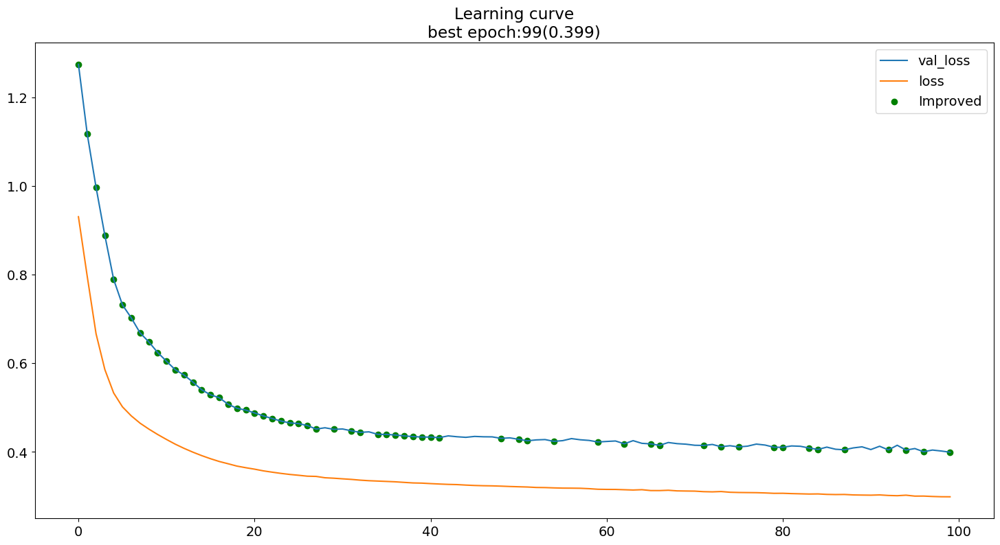

In [444]:
monitor_label = 'val_loss'

plot_learning_curve(history)
max_epoch = np.max(history.epoch)
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
best_epoch = hist[hist[monitor_label] == np.min(hist[monitor_label])]['epoch'].values[0]
print('max epoch :', max_epoch)

In [445]:
model = Sequential()
model.add(Bidirectional(LSTM(units=input_dim*3, 
                             return_sequences=True, 
                             kernel_initializer = 'uniform',
                             activation = 'tanh'
                             )))
model.add(SeqSelfAttention(attention_activation = 'linear'))
model.add(TimeDistributed(Dense(units=output_dim, activation = None)))

#opt = tf.keras.optimizers.Adam(learning_rate=0.0005, beta_1=0.9, beta_2=0.999, amsgrad=True)
opt = tf.keras.optimizers.Adam(learning_rate=0.0005)#, beta_1=0.9, beta_2=0.999, amsgrad=True)
model.compile(loss='mse', optimizer=opt)


# fit model
monitor_label = 'val_loss'
early_stop = EarlyStopping(monitor=monitor_label, patience=50)

history=model.fit(X_train_2, y_train_2, epochs=100, batch_size=64, validation_data=(X_val_2, y_val_2) ,verbose=0)
y_pred = model.predict(X_val_2)

PRINT_SCORE_3D(y_val_2, y_pred)

RESULT=SCORE(model_name="Attention-BiLSTM 2", y_pred=y_pred, y_val=y_val_2,RESULT=RESULT,walk=SARIMAX_RandomWalk['Y_PRED'])
RESULT

12/12 [==============================] - 1s 5ms/step
RMSE :  0.6454873
MAPE :  1.7557847
SMAPE :  33.931857062350765
DTW :  36.798721390645916


[[1.]]
[[1.3513813]]
[[1.]]
[[22.6023488]]
[[11.97686505]]


,model_name,RMSE,MAPE,SMAPE,DTW,RdR_score
0,SARIMAX_Randomwalk_baseline,0.996869,5.161215,43.094156,58.401070,1.000000
0,best_score,0.000000,0.000000,0.000000,0.000000,30.698969
0,LinearRegression,0.677248,2.884223,35.439724,39.060157,10.830267
0,Knn_1,0.634031,4.115064,37.031763,40.187168,10.288370
0,Best_Knn,0.631405,4.459558,36.897767,39.968075,10.399229
0,MLP,0.638252,3.900928,34.859799,38.061255,11.349216
0,XGB,0.669111,4.503739,36.264011,36.030773,12.349027
0,XGB,0.653240,2.826412,36.081918,36.242292,12.251204
0,Vanilla LSTM,1.199456,281.114532,96.303694,108.460316,-24.130916
0,Stacked 2 LSTM,1.196268,452.865997,96.344824,108.499267,-24.148798


max epoch : 299


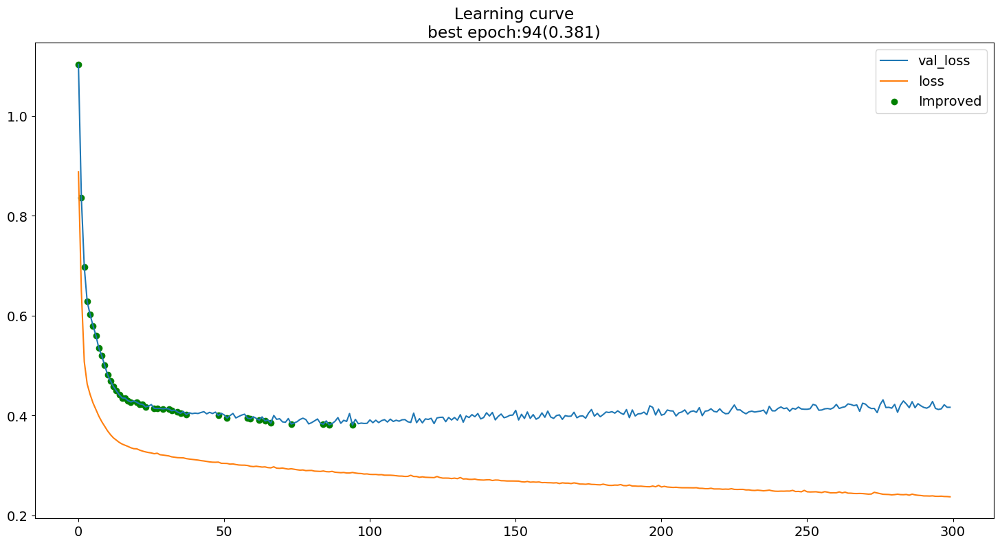

In [447]:
monitor_label = 'val_loss'

plot_learning_curve(history)
max_epoch = np.max(history.epoch)
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
best_epoch = hist[hist[monitor_label] == np.min(hist[monitor_label])]['epoch'].values[0]
print('max epoch :', max_epoch)

# Seq2SeqAttention
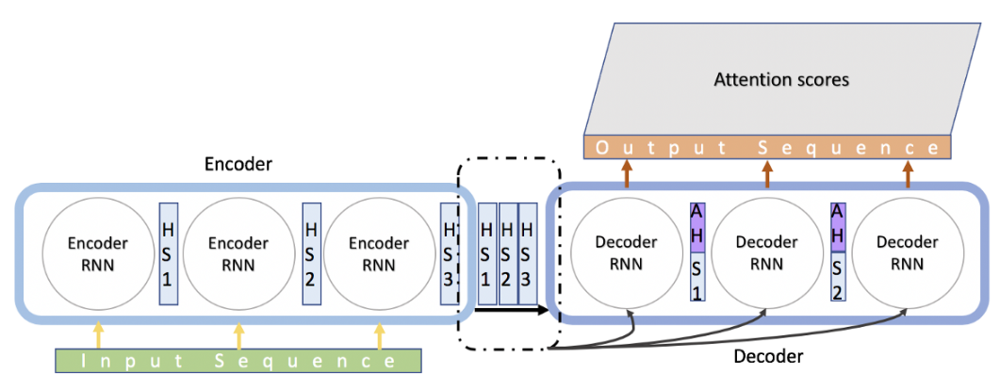

In [448]:
# X_train_2, y_train_2
# X_val_2, y_val_2

input_train = Input(shape=(X_train_2.shape[1], X_train_2.shape[2]))
output_train = Input(shape=(y_train_2.shape[1], y_train_2.shape[2]))    

encoder_stack_h, encoder_last_h, encoder_last_c = LSTM(48, activation='tanh', 
                                                       dropout=0.2, 
                                                       recurrent_dropout=0.2, 
                                                       return_state=True, 
                                                       return_sequences=True)(input_train)

decoder_input = RepeatVector(output_train.shape[1])(encoder_last_h)

decoder_stack_h = LSTM(48, activation='tanh', 
                       dropout=0.2, 
                       recurrent_dropout=0.2,
                       return_state=False, 
                       return_sequences=True)(decoder_input, initial_state=[encoder_last_h, encoder_last_c])

attention = dot([decoder_stack_h, encoder_stack_h], axes=[2, 2])
attention = Activation('softmax')(attention)

context = dot([attention, encoder_stack_h], axes=[2,1])

decoder_combined_context = concatenate([context, decoder_stack_h])

out = TimeDistributed(Dense(y_train_2.shape[2]))(decoder_combined_context)
model = Model(inputs=input_train, outputs=out)

opt = tf.keras.optimizers.Adam(learning_rate=0.0008, beta_1=0.9, beta_2=0.999, amsgrad=True)
model.compile(optimizer=opt, loss='mse')
model.summary()

#fit the model
monitor_label = 'val_loss'
early_stop = EarlyStopping(monitor=monitor_label, patience=20)
history = model.fit(X_train_2, y_train_2,
                    epochs=100, 
                    batch_size = 24, 
                    validation_data = (X_val_2, y_val_2),
                    shuffle = False,
                    verbose=1,
                    callbacks=[early_stop,  PrintDot()])

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 1, 24)]      0           []                               
                                                                                                  
 lstm_34 (LSTM)                 [(None, 1, 48),      14016       ['input_2[0][0]']                
                                 (None, 48),                                                      
                                 (None, 48)]                                                      
                                                                                                  
 repeat_vector_1 (RepeatVector)  (None, 1, 48)       0           ['lstm_34[0][1]']                
                                                                                            

In [449]:
y_pred = model.predict(X_val_2)

PRINT_SCORE_3D(y_val_2, y_pred)

RESULT=SCORE(model_name="Seq2SeqAttention", y_pred=y_pred, y_val=y_val_2,RESULT=RESULT,walk=SARIMAX_RandomWalk['Y_PRED'])
RESULT

12/12 [==============================] - 1s 5ms/step
RMSE :  0.6191636
MAPE :  3.9440045
SMAPE :  34.283191506547055
DTW :  38.251123352844445
[[1.]]
[[1.377705]]
[[1.]]
[[21.14994684]]
[[11.26382591]]


,model_name,RMSE,MAPE,SMAPE,DTW,RdR_score
0,SARIMAX_Randomwalk_baseline,0.996869,5.161215,43.094156,58.401070,1.000000
0,best_score,0.000000,0.000000,0.000000,0.000000,30.698969
0,LinearRegression,0.677248,2.884223,35.439724,39.060157,10.830267
0,Knn_1,0.634031,4.115064,37.031763,40.187168,10.288370
0,Best_Knn,0.631405,4.459558,36.897767,39.968075,10.399229
0,MLP,0.638252,3.900928,34.859799,38.061255,11.349216
0,XGB,0.669111,4.503739,36.264011,36.030773,12.349027
0,XGB,0.653240,2.826412,36.081918,36.242292,12.251204
0,Vanilla LSTM,1.199456,281.114532,96.303694,108.460316,-24.130916
0,Stacked 2 LSTM,1.196268,452.865997,96.344824,108.499267,-24.148798


max epoch : 95


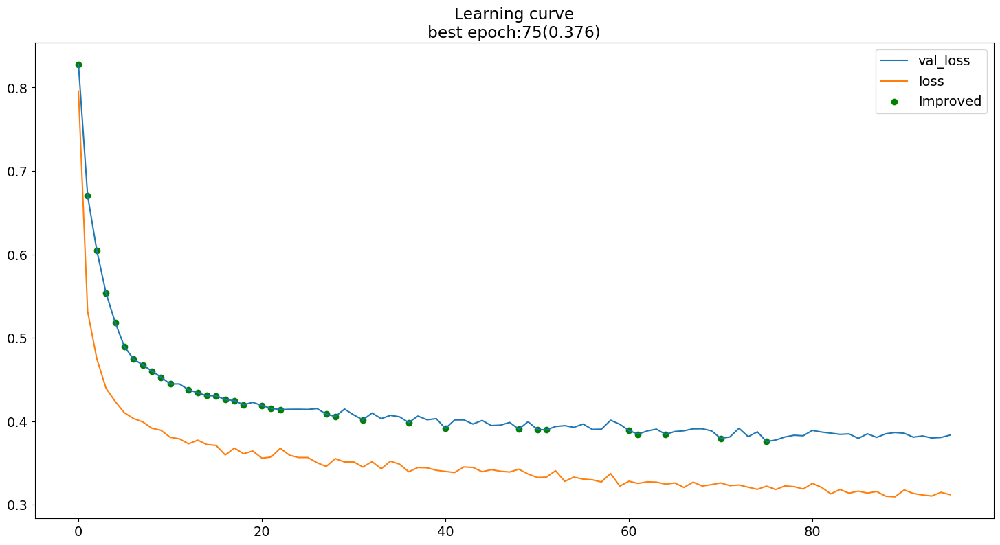

In [450]:
monitor_label = 'val_loss'

plot_learning_curve(history)
max_epoch = np.max(history.epoch)
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
best_epoch = hist[hist[monitor_label] == np.min(hist[monitor_label])]['epoch'].values[0]
print('max epoch :', max_epoch)

# MultiHead Attention-BiLSTM
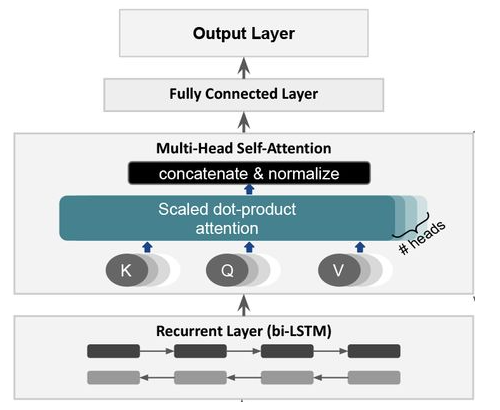

In [ ]:
###### model = Sequential()
model.add(Bidirectional(LSTM(units=input_dim*3, 
                             return_sequences=True, 
                             kernel_initializer = 'uniform',
                             activation = 'tanh'
                             )))
model.add(MultiHeadAttention(head_num = X_val_2.shape[2]))
model.add(Bidirectional(LSTM(input_dim, return_sequences=True, activation = 'tanh')))#,return_sequences=False))
model.add(TimeDistributed(Dense(units=output_dim, activation = 'linear')))


opt = tf.keras.optimizers.Adam(learning_rate=0.001)#, beta_1=0.9, beta_2=0.999, amsgrad=True)
model.compile(loss='mse', optimizer=opt)


# fit model
history=model.fit(X_train_2, y_train_2, epochs=100, batch_size=64, validation_data=(X_val_2, y_val_2) ,verbose=0)
y_pred = model.predict(X_val_2)

PRINT_SCORE_3D(y_val_2, y_pred)

RESULT=SCORE(model_name="MultiHead Attention-BiLSTM", y_pred=y_pred, y_val=y_val_2,RESULT=RESULT,walk=SARIMAX_RandomWalk['Y_PRED'])
RESULT

max epoch : 99


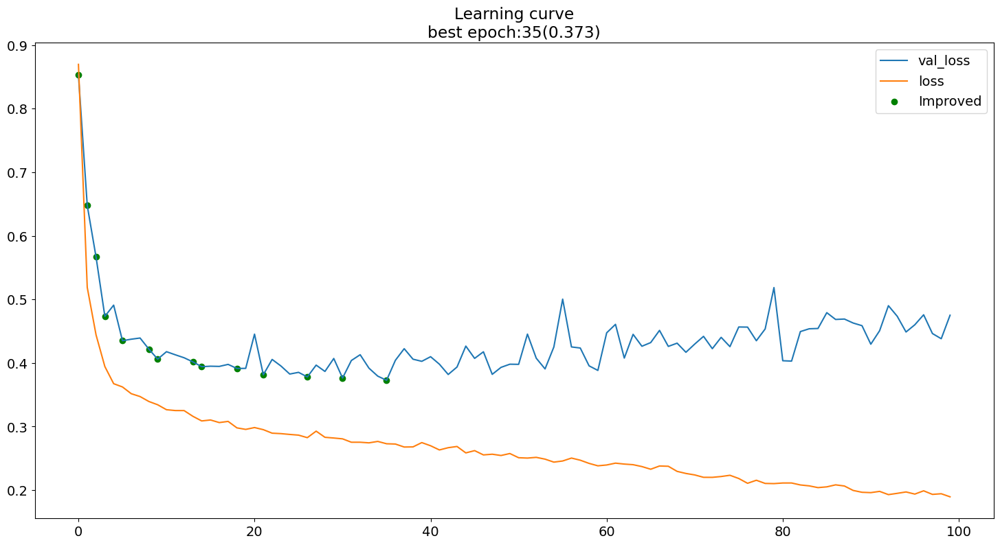

In [452]:
monitor_label = 'val_loss'

plot_learning_curve(history)
max_epoch = np.max(history.epoch)
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
best_epoch = hist[hist[monitor_label] == np.min(hist[monitor_label])]['epoch'].values[0]
print('max epoch :', max_epoch)

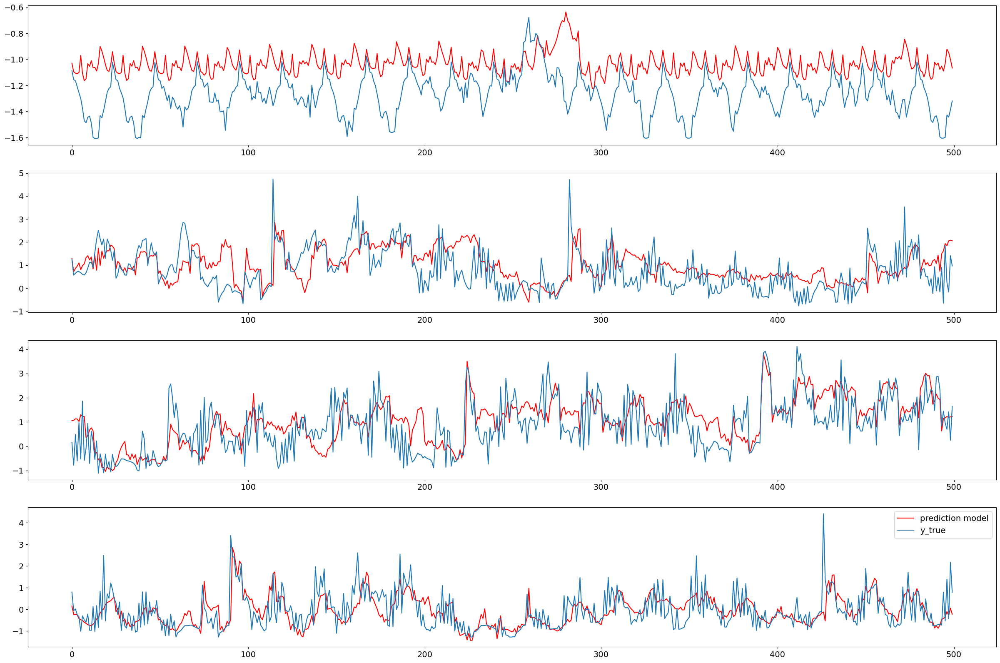

In [453]:
PLOT_RESULT_3D(y_pred,y_val_2)

# Time2Vec-BiLSTM
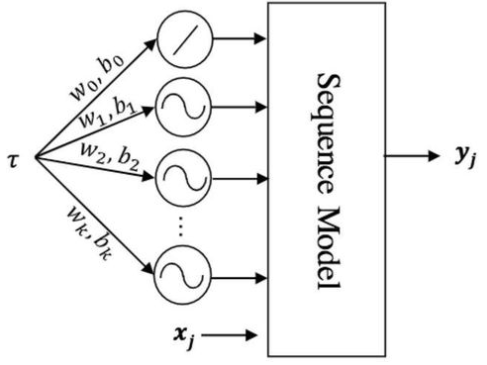

In [454]:
class Time2Vec(Layer):
    
    def __init__(self, output_dim=None, **kwargs):
        self.output_dim = output_dim
        super(Time2Vec, self).__init__(**kwargs)
        
    def build(self, input_shape):

        self.W = self.add_weight(name='W',
                                shape=(input_shape[-1], self.output_dim),
                                initializer='uniform',
                                trainable=True)

        self.P = self.add_weight(name='P',
                                shape=(input_shape[1], self.output_dim),
                                initializer='uniform',
                                trainable=True)

        self.w = self.add_weight(name='w',
                                shape=(input_shape[1], 1),
                                initializer='uniform',
                                trainable=True)

        self.p = self.add_weight(name='p',
                                shape=(input_shape[1], 1),
                                initializer='uniform',
                                trainable=True)

        super(Time2Vec, self).build(input_shape)
        
    def call(self, x):
        
        original = self.w * x + self.p
        sin_trans = K.sin(K.dot(x, self.W) + self.P)
        
        return K.concatenate([sin_trans, original], -1)

In [455]:
y_val_2.shape

(354, 1, 24)

In [652]:
inp = Input(shape=(X_train_2.shape[1],
               X_train_2.shape[2]))
x = Time2Vec(120)(inp)
x = Bidirectional(LSTM(48, activation='tanh', return_sequences = True))(x)
x = Dense(output_dim)(x)

model = Model(inp, x)
opt = tf.keras.optimizers.Adam(learning_rate=0.0008, beta_1=0.9, beta_2=0.999, amsgrad=True)
model.compile(optimizer=opt, loss='mse')
model.summary()



from keras.callbacks import ModelCheckpoint
from keras.callbacks import EarlyStopping  
from keras.models import load_model

es = EarlyStopping(monitor='val_loss', mode='auto', verbose=0,patience=10)
mc = ModelCheckpoint('Time2Vec-BiLSTM.h5', monitor='val_loss', mode='auto', verbose=0, save_best_only=True)


# fit model
history=model.fit(X_train_2, y_train_2, epochs=100, batch_size=64, validation_data=(X_val_2, y_val_2) ,verbose=0,callbacks=[es, mc])
y_pred = model.predict(X_val_2)

PRINT_SCORE_3D(y_val_2, y_pred)

RESULT=SCORE(model_name="Time2Vec-BiLSTM", y_pred=y_pred, y_val=y_val_2,RESULT=RESULT,walk=SARIMAX_RandomWalk['Y_PRED'])
RESULT

Model: "model_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_22 (InputLayer)       [(None, 1, 24)]           0         
                                                                 
 time2_vec_6 (Time2Vec)      (None, 1, 144)            3002      
                                                                 
 bidirectional_18 (Bidirecti  (None, 1, 96)            74112     
 onal)                                                           
                                                                 
 dense_102 (Dense)           (None, 1, 24)             2328      
                                                                 
Total params: 79,442
Trainable params: 79,442
Non-trainable params: 0
_________________________________________________________________
12/12 [==============================] - 1s 3ms/step
RMSE :  0.6270495
MAPE :  2.303785
SMAPE :  34.120902137920346
DTW :

,model_name,RMSE,MAPE,SMAPE,DTW,RdR_score
0,SARIMAX_Randomwalk_baseline,0.996869,5.161215e+00,43.094156,58.401070,1.000000
0,best_score,0.000000,0.000000e+00,0.000000,0.000000,30.698969
0,LinearRegression,0.677248,2.884223e+00,35.439724,39.060157,10.830267
0,Knn_1,0.634031,4.115064e+00,37.031763,40.187168,10.288370
0,Best_Knn,0.631405,4.459558e+00,36.897767,39.968075,10.399229
0,MLP,0.638252,3.900928e+00,34.859799,38.061255,11.349216
0,XGB,0.669111,4.503739e+00,36.264011,36.030773,12.349027
0,XGB,0.653240,2.826412e+00,36.081918,36.242292,12.251204
0,Vanilla LSTM,1.199456,2.811145e+02,96.303694,108.460316,-24.130916
0,Stacked 2 LSTM,1.196268,4.528660e+02,96.344824,108.499267,-24.148798


max epoch : 47


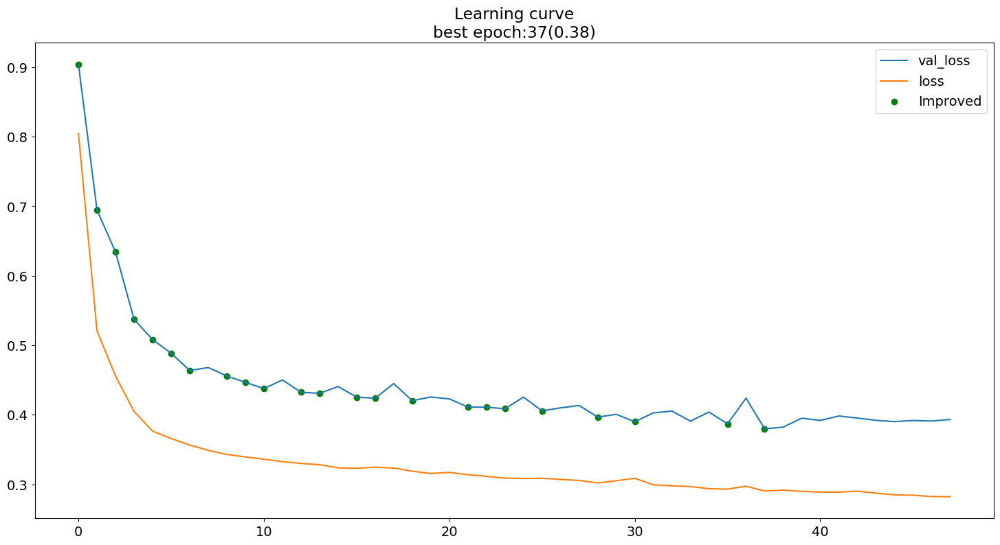

In [653]:
plot_learning_curve(history)
max_epoch = np.max(history.epoch)
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
best_epoch = hist[hist[monitor_label] == np.min(hist[monitor_label])]['epoch'].values[0]
print('max epoch :', max_epoch)

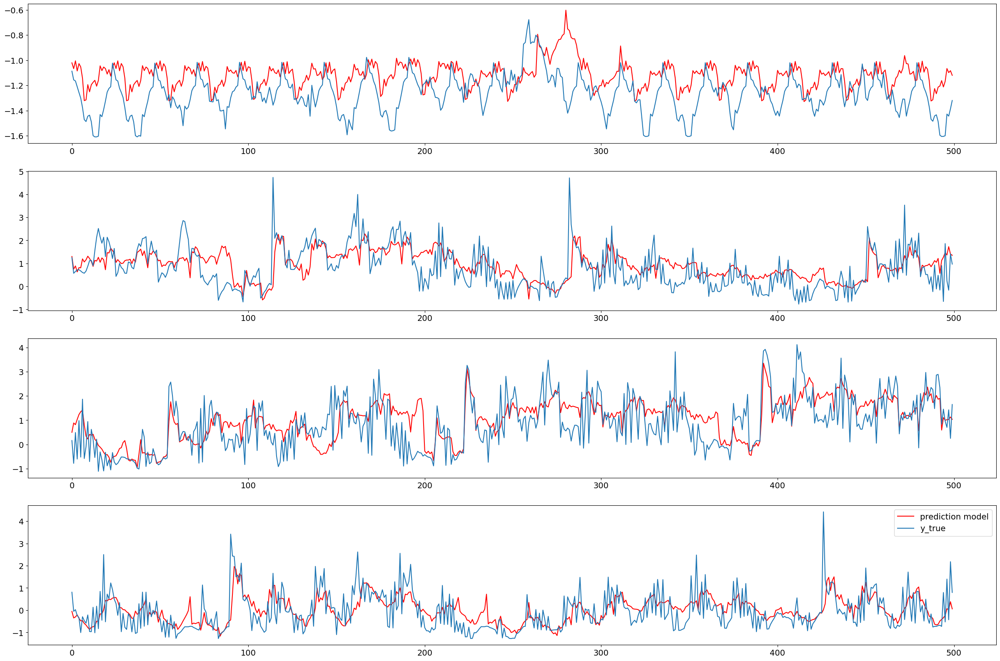

In [654]:
PLOT_RESULT_3D(y_pred,y_val_2)

# Time2Vec-Transformer
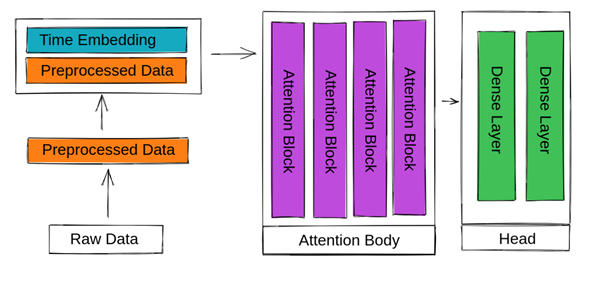

In [624]:
class Time2Vec4TF(tf.keras.layers.Layer):
    def __init__(self, seq_len, **kwargs):
        super(Time2Vec4TF, self).__init__()
        self.seq_len = seq_len

    def build(self, input_shape):
        self.weights_linear = self.add_weight(name='weight_linear',
                                    shape=(int(self.seq_len),),
                                    initializer='uniform',
                                    trainable=True)

        self.bias_linear = self.add_weight(name='bias_linear',
                                    shape=(int(self.seq_len),),
                                    initializer='uniform',
                                    trainable=True)

        self.weights_periodic = self.add_weight(name='weight_periodic',
                                    shape=(int(self.seq_len),),
                                    initializer='uniform',
                                    trainable=True)

        self.bias_periodic = self.add_weight(name='bias_periodic',
                                    shape=(int(self.seq_len),),
                                    initializer='uniform',
                                    trainable=True)

    def call(self, x):
        x = tf.math.reduce_mean(x[:,:,:], axis=-1) # Convert (batch, seq_len, 5) to (batch, seq_len)
        time_linear = self.weights_linear * x + self.bias_linear
        time_linear = tf.expand_dims(time_linear, axis=-1) # (batch, seq_len, 1)
        time_periodic = tf.math.sin(tf.multiply(x, self.weights_periodic) + self.bias_periodic)
        time_periodic = tf.expand_dims(time_periodic, axis=-1) # (batch, seq_len, 1)
        return tf.concat([time_linear, time_periodic], axis=-1) # (batch, seq_len, 2
class TransformerEncoder(layers.Layer):
    def __init__(self, embed_dim, num_heads, feed_forward_dim, rate=0.1):
        super().__init__()
        self.attn = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        self.ffn = keras.Sequential(
            [
                layers.Dense(feed_forward_dim, activation="relu"),
                layers.Dense(embed_dim),
            ]
        )
        self.layernorm1 = layers.LayerNormalization(epsilon=1e-6)
        self.layernorm2 = layers.LayerNormalization(epsilon=1e-6)
        self.dropout1 = layers.Dropout(rate)
        self.dropout2 = layers.Dropout(rate)

    def call(self, inputs, training):
        attn_output = self.attn(inputs, inputs)
        attn_output = self.dropout1(attn_output, training=training)
        out1 = self.layernorm1(inputs + attn_output)
        ffn_output = self.ffn(out1)
        ffn_output = self.dropout2(ffn_output, training=training)
        return self.layernorm2(out1 + ffn_output)


class T2VTransformer(keras.Model):
    def __init__(
            self,
            num_hid=64, # embed_dim - num of features
            time_steps=7,
            num_head = 2,
            num_feed_forward=128, # pointwise dim
            num_layers_enc = 4,
            time_embedding = False,
    ):
        super().__init__()
        self.num_hid = num_hid
        if time_embedding:
            self.num_hid += 2
            self.tv = Time2Vec4TF(time_steps)
        else:
            self.tv = None
        self.numlayers_enc = num_layers_enc
        self.enc_input = layers.Input((time_steps, self.num_hid))
        self.encoder = keras.Sequential(
            [self.enc_input]
            + [
                TransformerEncoder(self.num_hid, num_head, num_feed_forward)
                for _ in range(num_layers_enc)
            ]
        )
        self.GlobalAveragePooling1D = layers.GlobalAveragePooling1D(data_format='channels_last')
#         self.out = layers.Dense(units=time_steps, activation='linear')   
        self.out = layers.Dense(units=n_targets, activation='linear')        
        self.concat = tf.keras.layers.Concatenate(axis=-1)
        
    def call(self, inputs):
        if self.tv:
            x = self.tv(inputs)
            x = self.concat([inputs, x])
            x = self.encoder(x)
        else:
            x = self.encoder(inputs)
        x = self.GlobalAveragePooling1D(x)
        y = self.out(x)
        return y

In [625]:
num_heads=1
num_layers_enc=1
num_feed_forward=32
num_features = X_train_2.shape[2]
time_steps = y_train_2.shape[1]
# time_steps = n_features
# epochs = 100
batch_size = 128

model = T2VTransformer(num_hid=num_features,
                       time_steps=time_steps,
                       time_embedding=True,
                       num_head=y_train_2.shape[1],
#                        num_head=n_features,
                       num_layers_enc=num_layers_enc,
                       num_feed_forward=num_feed_forward)

opt = tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, amsgrad=True)
model.compile(optimizer=opt, loss='mse')


    


In [626]:
# fit model
history=model.fit(X_train_2, y_train_2, epochs=30, batch_size=64, validation_data=(X_val_2, y_val_2) ,verbose=0)
y_pred = model.predict(X_val_2)

PRINT_SCORE_3D(y_val_2, y_pred)

# RESULT=SCORE(model_name="Time2Vec-Transformer 2", y_pred=y_pred, yaval=y_val_2,RESULT=RESULT,walk=SARIMAX_RandomWalk['Y_PRED'])
# RESULT

12/12 [==============================] - 0s 3ms/step
RMSE :  1.1952232
MAPE :  126.21884
SMAPE :  91.50169963248293
DTW :  92.92977345082552


max epoch : 29


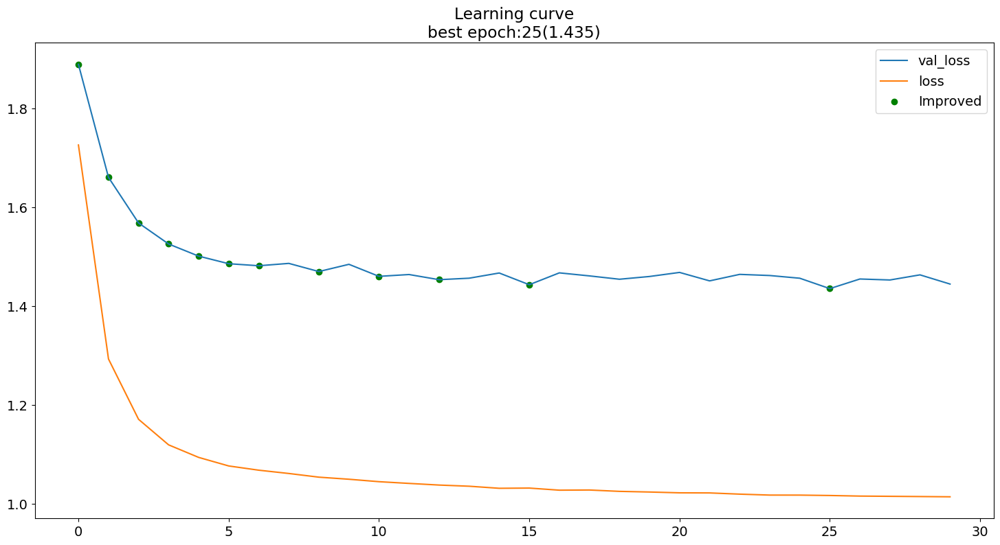

In [627]:
plot_learning_curve(history)
max_epoch = np.max(history.epoch)
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
best_epoch = hist[hist[monitor_label] == np.min(hist[monitor_label])]['epoch'].values[0]
print('max epoch :', max_epoch)

In [462]:
PLOT_RESULT_3D(y_pred,y_val_2)

# Correlation matrix

In [463]:
# RESULT[["RMSE","MAPE","SMAPE","DTW","RdR_score"]]

<AxesSubplot:>

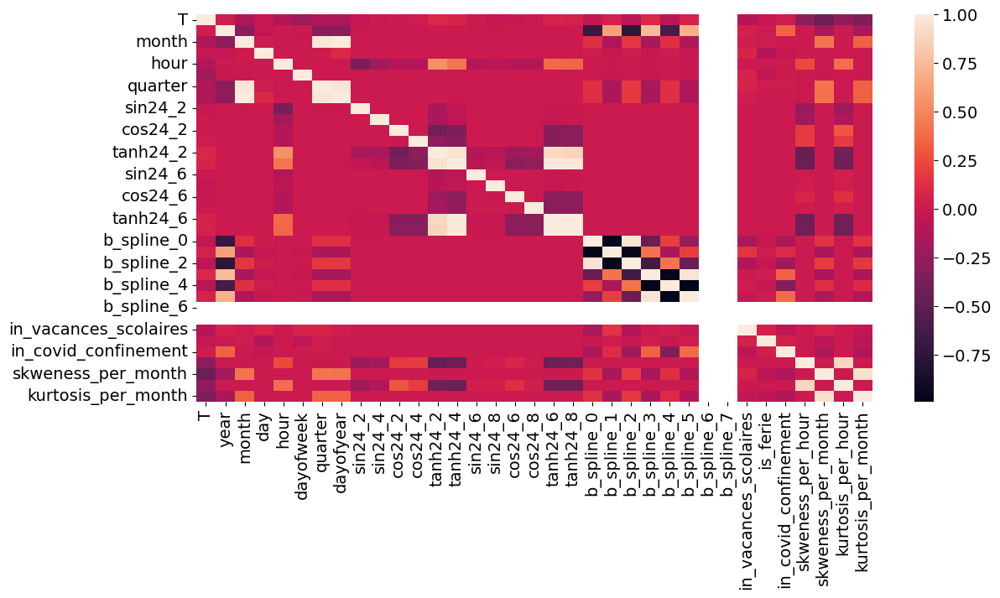

In [236]:
sns.heatmap(df2.corr())

In [239]:
df2.corr()['T']

T                        1.000000
year                     0.021987
month                   -0.132443
day                     -0.021163
hour                    -0.121814
dayofweek               -0.211603
quarter                 -0.130263
dayofyear               -0.132043
sin24_2                 -0.031776
sin24_4                  0.004063
cos24_2                  0.008191
cos24_4                  0.014860
tanh24_2                 0.088171
tanh24_4                 0.069303
sin24_6                  0.003505
sin24_8                 -0.031128
cos24_6                 -0.011018
cos24_8                 -0.000909
tanh24_6                 0.061480
tanh24_8                 0.058467
b_spline_0              -0.038552
b_spline_1               0.052480
b_spline_2              -0.070650
b_spline_3               0.087609
b_spline_4              -0.078048
b_spline_5               0.062031
b_spline_6                    NaN
b_spline_7                    NaN
in_vacances_scolaires   -0.108764
is_ferie      

<AxesSubplot:>

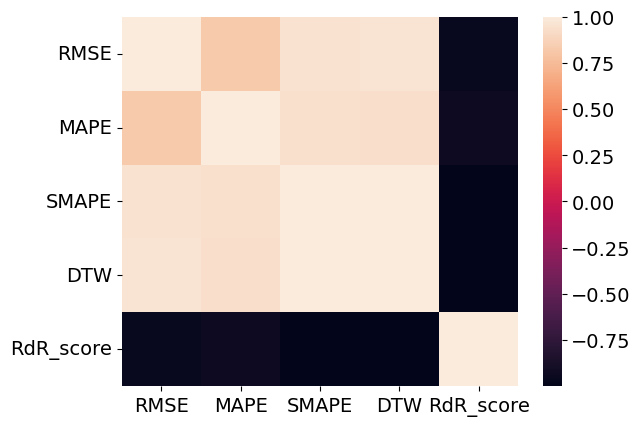

In [464]:
import seaborn as sns
%matplotlib inline

# calculate the correlation matrix
corr = RESULT[["RMSE","MAPE","SMAPE","DTW","RdR_score"]].corr()

# plot the heatmap
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns)

In [465]:
corr

,RMSE,MAPE,SMAPE,DTW,RdR_score
RMSE,1.000000,0.824048,0.950993,0.958470,-0.959187
MAPE,0.824048,1.000000,0.937733,0.934655,-0.934017
SMAPE,0.950993,0.937733,1.000000,0.996788,-0.996746
DTW,0.958470,0.934655,0.996788,1.000000,-0.999997
RdR_score,-0.959187,-0.934017,-0.996746,-0.999997,1.000000
